# Experiments with Autoencoder

## Setup

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

import pandas as pd
from IPython.display import display

import numpy as np
import copy
import sys
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torch.optim as optim

from torch.utils.data import DataLoader, random_split, ConcatDataset, SubsetRandomSampler
from sklearn.model_selection import KFold
from scipy.stats import norm
from torch.autograd import Variable
from torch.utils.data.dataloader import DataLoader
from torchvision.datasets import MNIST
from torchvision.utils import make_grid as make_image_grid
from matplotlib.backends.backend_pdf import PdfPages
from tqdm import tnrange

 ## Training and evaluation functions

### Training functions AE

In [ ]:
def train_AE_model(model, train_loader, val_loader, test_loader, AE_criterion, eval_criterions, optimizer, device, epochs, AE_likelihood, fold):
    train_outputs = []
    train_average_losses = []
    val_average_losses = []

    # Iterate over epochs
    for epoch in range(epochs):
        # Training phase
        model.train()
        total_train_loss = 0.0
        for batch_idx, (img, _) in enumerate(train_loader):
            x_in = img.view(img.size(0), -1).to(device)
            z, x_out = model(x_in)
            loss = AE_criterion(x_out, x_in, AE_likelihood)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_train_loss += loss.item()

        average_train_loss = total_train_loss / len(train_loader)
        train_average_losses.append(average_train_loss)

        print(f'Train Fold/Epoch: {fold + 1}/{epoch + 1}, Training Loss: {average_train_loss:.6f}')

        # Validation phase
        average_val_loss = eval_AE_model(fold, model, val_loader, eval_criterions, device)
        average_val_losses_1 = {criterion_name_1: loss_value_1 for criterion_name_1, loss_value_1 in average_val_loss.items()}
        val_average_losses.append(average_val_losses_1)

        print(f'Validation Fold/Epoch: {fold + 1}/{epoch + 1}, Validation AE Loss: {average_val_losses_1:}')




        # Keep track of training outputs
        train_outputs.append((epoch, x_in, x_out))

    return train_outputs, train_average_losses, val_average_losses


### Visualize reconstructions function AE

In [ ]:
def AE_visualize_original_images(test_loader, img_shape, num_samples=10, figure_size=(8, 2)):
    with torch.no_grad():
        for batch_features, _ in test_loader:
            batch_features = batch_features.view(-1, img_shape[0] * img_shape[1])
            break

    plt.figure(figsize=figure_size)
    plt.gray()

    plt.suptitle('Visualizing Original Images', fontsize=12)

    for i in range(num_samples):
        ax = plt.subplot(2, num_samples, i + 1)
        # Check if there is only one image in the batch
        if len(batch_features) == 1:
            plt.imshow(batch_features[0].numpy().reshape(img_shape))
        else:
            plt.imshow(batch_features[i].numpy().reshape(img_shape))
        plt.axis('off')

    plt.show()
def AE_visualize_reconstructions(model, test_loader, img_shape,  device, num_samples=10, fold_index=None, figure_size=(8, 2)):
    with torch.no_grad():
        for batch_features, _ in test_loader:
            batch_features = batch_features.to(device)
            x_in = batch_features.view(batch_features.size(0), -1)
            z, x_out = model(x_in)
            break

    plt.figure(figsize=figure_size)
    plt.gray()

    for i, (item_in, item_out) in enumerate(zip(x_in.cpu().numpy(), x_out.cpu().numpy())):
        if i >= num_samples:
            break
        # Plot original image
        if fold_index == 0:
          plt.subplot(2, num_samples, i + 1)
          item_in = item_in.reshape(img_shape)
          plt.imshow(item_in)
          plt.axis('off')

        # Plot reconstructed image for all folds
        plt.subplot(2, num_samples, num_samples + i + 1)
        item_out = item_out.reshape(img_shape)
        plt.imshow(item_out)
        plt.axis('off')

    plt.show()
img_shape = (28, 28)

### Evaluation functions AE

In [ ]:
def eval_AE_model(fold, model, test_loader, criterions, device):
    model.eval()
    criterion_names = list(criterions.keys())
    average_eval_loss = {criterion_name: 0.0 for criterion_name in criterion_names}

    for criterion_name, criterion in criterions.items():
        total_ae_loss = 0.0

        for (img, _) in test_loader:
            img = img.to(device)
            x_in = img.view(img.size(0), -1)
            z, x_out = model(x_in)
            loss = criterion(x_out, x_in)
            total_ae_loss += loss.item()

        # Calculate the average loss
        average_loss = total_ae_loss / len(test_loader)
        average_eval_loss[criterion_name] = average_loss

    return average_eval_loss


## Model definitions: Pytorch Classes

### Autoencoder

Code by Regis Djaha

In [ ]:
class AE(nn.Module):
    def __init__(self, D_x=784, n_layers=1, D_z=2, activation=nn.ReLU):
        super(AE, self).__init__()

        self.D_x = D_x
        self.D_z = D_z
        self.n_layers=n_layers

        # The hidden sizes are computed based on a linear decrease of size from D_x to D_z
        hidden_sizes = [D_x - (D_x - D_z) * i // n_layers for i in range(n_layers)] + [D_z]
        encoder_hidden_sizes = [D_x] + hidden_sizes
        decoder_hidden_sizes = encoder_hidden_sizes[::-1]


        # Define the encoder layers
        encoder_layers = []
        for i in range(1, len(encoder_hidden_sizes) - 1):
            # Remove activation at the last layer of the encoder
            if i == len(encoder_hidden_sizes) - 2:
                encoder_layers.extend([nn.Linear(encoder_hidden_sizes[i], encoder_hidden_sizes[i + 1])])
            else:
                encoder_layers.extend([nn.Linear(encoder_hidden_sizes[i], encoder_hidden_sizes[i + 1]), activation()])

        self.encoder = nn.Sequential(*encoder_layers)
        print(encoder_layers)

        # Define the decoder layers
        decoder_layers = []
        for i in range(0, len(decoder_hidden_sizes) - 2):
            if i == len(decoder_hidden_sizes) - 3:
                decoder_layers.extend([nn.Linear(decoder_hidden_sizes[i], decoder_hidden_sizes[i + 1]), nn.Sigmoid()])
            else:
                decoder_layers.extend([nn.Linear(decoder_hidden_sizes[i], decoder_hidden_sizes[i + 1]), activation()])

        self.decoder = nn.Sequential(*decoder_layers)
        print(decoder_layers)

    def forward(self, x_in):
        z = self.encoder(x_in)
        x_out = self.decoder(z)
        return z,x_out

### AE criterion

In [ ]:
# AE criterion: reconstruction loss, based on Gaussian or Bernoulli likelihoods
def AE_criterion(x_out, x_in, AE_likelihood):

    if AE_likelihood == "gaussian":
      recon_loss = F.mse_loss(x_out, x_in, reduction='mean')
    elif AE_likelihood == "bernoulli":
      recon_loss = F.binary_cross_entropy(x_out, x_in, reduction='mean')

    else:
        raise ValueError("Invalid likelihood type. Supported types are 'gaussian' and 'bernoulli'.")

    loss = recon_loss

    return loss

### Latent Space AE model

In [ ]:
def latent_space_AE_model(model, test_loader, device, ax=None):
    model.eval()
    z_latent = []
    labels = []

    for (img, _) in test_loader:
        x_in = img.view(img.size(0), -1).to(device)
        with torch.no_grad():
            z, x_out = model(x_in)

        z_latent.append(z.cpu().numpy())
        labels.append(_.numpy())

    z_latent = np.concatenate(z_latent)
    labels = np.concatenate(labels)

    # Create a colormap for different colors
    colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))

    # Map labels to colors
    colors = colormap(labels)

    # Figure with one subplot or use the provided axis
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))
    else:
        fig = ax.figure

    # Scatter plot for z_mean
    scatter_mean = ax.scatter(z_latent[:, 0], z_latent[:, 1], c=labels, cmap=colormap)
    ax.set_xlabel("Latent Space 1")
    ax.set_ylabel(" Latent Space 2")
    # ax.set_title(f'Latent Space (z_size = {model.D_z}) for fold # {}')
    ax.set_title(f'Latent Space (z_size = {model.D_z})')
    cbar_mean = plt.colorbar(scatter_mean)

    plt.tight_layout()

    # If no axis, show the plot
    if ax is None:
        plt.show()

### AE k_fold_cross_validation

In [ ]:
def AE_k_fold_cross_validation(model_class, model_config, train_dataset, test_dataset, AE_criterion, learning_rate, training_setup, k_folds, batch_size,
                            eval_criterions={
        'MSE': torch.nn.MSELoss(),
        'L1 Loss': torch.nn.L1Loss(),
        'BCE': torch.nn.BCELoss()
    }):
    # Set up k-fold cross-validation
    kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

    # Initialize a list to store models and losses
    models = []
    fold_results = []

    # Perform k-fold cross-validation
    for fold, (train_indices, val_indices) in enumerate(kf.split(train_dataset)):
        print(f"Fold {fold + 1}/{k_folds}")

        # Split dataset into training and validation sets
        train_subset = torch.utils.data.Subset(train_dataset, train_indices)
        val_subset = torch.utils.data.Subset(train_dataset, val_indices)

        # Create data loaders
        train_loader_fold = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
        print(len(train_loader_fold.dataset))
        val_loader_fold = DataLoader(val_subset, batch_size=batch_size, shuffle=False)
        print(len(val_loader_fold.dataset))
        test_loader_fold = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
        print(test_loader_fold.dataset)

        # Initialize autoencoder model

        model = model_class(**model_config).to(training_setup['device'])

        # Define loss function and optimizer after initializing the model
        criterion = AE_criterion
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)

        # Initialize test_losses_fold
        test_losses_fold_1 = []
        val_losses_fold_1 = []

        # Train the model for k-fold cross-validation
        train_outputs_fold, train_losses_fold, val_losses_fold = train_AE_model(
            model,
            train_loader_fold,
            val_loader_fold,
            test_loader_fold,
            criterion,
            eval_criterions,
            optimizer,
            training_setup['device'],
            training_setup['epochs'],
            training_setup['AE_likelihood'],
            fold
        )

        # Test and validate the model for k-fold cross-validation
        val_losses_fold_1 = eval_AE_model(fold,
                                       model,
                                       val_loader_fold,
                                       eval_criterions,
                                       training_setup['device'])
        val_losses_1 = {criterion_name_1: loss_value_1 for criterion_name_1, loss_value_1 in val_losses_fold_1.items()}
        print(f'Validation results for fold {fold +1}, Validation Average AE Loss: {val_losses_1:}')

        test_losses_fold_1 = eval_AE_model(fold,
                                           model,
                                           test_loader_fold,
                                           eval_criterions,
                                           training_setup['device'])
        #print(f"Test results for fold {fold + 1}: {test_losses_fold:.6f}")
        test_losses_1 = {criterion_name_1: loss_value_1 for criterion_name_1, loss_value_1 in test_losses_fold_1.items()}
        print(f'Test results for fold {fold +1}, Testing Average AE Loss: {test_losses_1}')


        # Save the model from this fold
        models.append(model)
        fold_results.append({
            "outputs": train_outputs_fold,
            "train_losses_fold": train_losses_fold,
            "val_losses_fold": val_losses_fold,
            "val_results": val_losses_1 ,
            "test_results": test_losses_1
        })

    return models, fold_results


## plot mean and std AE

In [ ]:
def plot_mean_std(data, title, ax, label, epochs, plot_std=True):
    mean_data = np.mean(data, axis=0)
    std_data = np.std(data, axis=0)
    ax.plot(epochs, mean_data, label=label)

    if plot_std:
        ax.fill_between(
            epochs,
            mean_data - std_data,
            mean_data + std_data,
            alpha=0.3,
            label='Standard Deviation'
        )

    ax.set_title(title)
    ax.set_xlabel('Epochs')
    ax.set_ylabel('Loss')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))  # x-axis ticks to integers

def AE_plot_results(kfold_results, loss_type='MSE'):
    train_losses = []
    val_losses = []

    # valid result
    valid_result = []

    # test result
    test_result = []
    epochs = None

    for fold_result in kfold_results:
        train_losses.append(fold_result['train_losses_fold'])

        if isinstance(fold_result['val_losses_fold'], list):
            val_losses.append([val[loss_type] for val in fold_result['val_losses_fold']])
        else:
            val_losses.append(fold_result['val_losses_fold'][loss_type])

        # valid result
        if isinstance(fold_result['val_results'], list):
            valid_result.append([val[loss_type] for val in fold_result['val_results']])
        else:
            valid_result.append(fold_result['val_results'][loss_type])

        # test result
        if isinstance(fold_result['test_results'], list):
            test_result.append([val[loss_type] for val in fold_result['test_results']])
        else:
            test_result.append(fold_result['test_results'][loss_type])

        if epochs is None:
            epochs = np.arange(1, len(train_losses[0]) + 1)

    # Convert lists to numpy arrays
    train_losses = np.array(train_losses)
    val_losses = np.array(val_losses)
    valid_result = np.array(valid_result)
    test_result = np.array(test_result)

    # Calculate mean for validation
    mean_valid_result = np.mean(valid_result)
    std_valid_result = np.std(valid_result)

    # Calculate mean for testing
    mean_test_result = np.mean(test_result)
    std_test_result = np.std(test_result)

    return {
        'mean_valid_result': mean_valid_result,
        'std_valid_result': std_valid_result,
        'mean_test_result': mean_test_result,
        'std_test_result': std_test_result,
        'epochs': epochs,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'valid_result': valid_result,
        'test_result': test_result
    }
def highlight_min(s):
    is_min = s == s.min()
    return ['background-color: lightgreen' if v else '' for v in is_min]

def print_evaluation_table(valid_result, test_result):
    # Calculate mean and standard deviation for Validation Loss and Test Loss
    mean_valid_loss = np.mean(valid_result)
    std_valid_loss = np.std(valid_result)

    mean_test_loss = np.mean(test_result)
    std_test_loss = np.std(test_result)

    # Create a DataFrame for mean and standard deviation
    evaluation_summary_dict = {
        'Metric': ['Mean', 'Standard Deviation'],
        'Validation Loss': [mean_valid_loss, std_valid_loss],
        'Test Loss': [mean_test_loss, std_test_loss]
    }
    df_summary = pd.DataFrame(evaluation_summary_dict)

    # Print the mean and standard deviation table
    print("\nMean and Standard Deviation Table:")
    print(df_summary)


    # Print the detailed evaluation table with highlighted rows
    min_val_loss_index = np.argmin(valid_result)
    evaluation_dict = {
        'Fold': np.arange(1, len(valid_result) + 1),
        'Validation Loss': valid_result,
        'Test Loss': test_result
    }
    df = pd.DataFrame(evaluation_dict)


    # Display the Detailed Evaluation Table with proper styling
    styles = [
        dict(selector=f'.row{min_val_loss_index + 2}', props=[('background-color', 'lightgreen')])
    ]
    #df_styled = df.style.set_table_styles(styles, axis=1)
    df_styled = df.style.apply(highlight_min, subset=['Validation Loss'], axis=0)

    print("\nDetailed Evaluation Table:")
    display(df_styled)

## Experiments with MNIST

### Set our seed and other configurations for reproducibility.

In [ ]:
seed = 42
torch.manual_seed(seed)
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

### Dataset

#### We load our MNIST dataset using the torchvision package.

#### We need to specify the batch size for the dataloader first

In [ ]:
batch_size=64

In [ ]:
# Load MNIST Training data
# Note that we shuffle the training data
train_loader = DataLoader(
    MNIST(
      root='./data',
      train=True,
      download=True,
      transform=transforms.ToTensor()),
       batch_size=batch_size,
       shuffle=True
    )

100%|██████████| 9912422/9912422 [00:00<00:00, 142970121.20it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 41329134.71it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 46609009.22it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 18126097.78it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [ ]:
# Load MNIST Test data
# Note that we DO NOT shuffle the test data
test_loader = DataLoader(
    MNIST(
      root='./data',
      train=False,
      download=True,
      transform=transforms.ToTensor()),
      batch_size=batch_size,
      shuffle=False
    )

#### Total number of images in the training and testing sets

In [ ]:
print("Total number of training images:", len(train_loader.dataset))
print("Total number of testing images:", len(test_loader.dataset))

Total number of training images: 60000
Total number of testing images: 10000


In [ ]:
examples = iter(train_loader)
example_data, example_targets = next(examples)
print(example_data.shape)
print(example_targets)

torch.Size([64, 1, 28, 28])
tensor([1, 2, 8, 5, 2, 6, 9, 9, 9, 4, 0, 3, 9, 9, 5, 6, 7, 8, 8, 9, 2, 6, 9, 3,
        0, 5, 0, 7, 6, 1, 2, 0, 7, 4, 6, 0, 6, 9, 7, 0, 7, 3, 2, 5, 9, 0, 4, 8,
        3, 6, 4, 0, 3, 2, 6, 6, 3, 2, 2, 3, 6, 7, 8, 4])


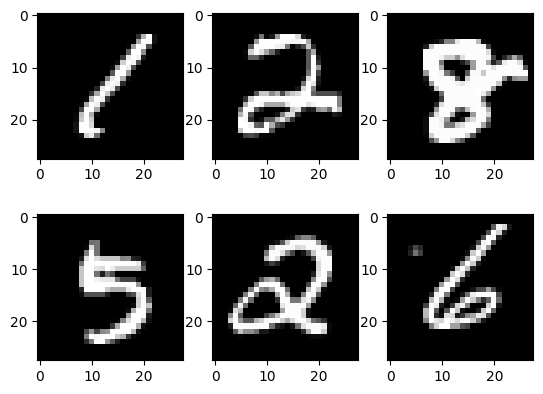

In [ ]:
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(example_data[i][0], cmap='gray')
plt.show()

**Hyper-parameters used in all experiments**
\begin{array}{|c|c|}
\hline
\textbf{Hyperparameters} & \textbf{Values} \\
\hline
\text{Epochs} & 30 \\
\hline
\text{Batch-size} & 64 \\
\hline
\text{Learning Rate} & 0.001 \\
\hline
\text{Optimizer} & \text{Adam} \\
\hline
\text{Dataset} & \text{MNST} \\
\hline
\end{array}
**Table 1:** Hyper-parameters used in all experiments

### Experiments 1 : AE with n_layers =1

- We evaluate the performance of both the autoencoder and the variational autoencoder by systematically varying the latent space dimensionality (Dz) across different values, specifically {2, 8, 16, 32, 64}. Additionally, for this assessment, we set the number of layers (n_layer) to be equal to 1, considering likelihoods modeled as Gaussian and Bernoulli.

### Experiments with MNIST: Autoencoder

## Test 1 AE: MSE

### Experiment 1.1 : AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=2, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_1_1 = 'AE'
model_config_1_1 = {'D_x': 784, 'n_layers': 1, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_1_1, fold_results_1_1 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_1_1),
                                                model_config=model_config_1_1,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=2, bias=True)]
[Linear(in_features=2, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.105293
Validation Fold/Epoch: 1/1, Average AE Loss: {'MSE': 0.06668693144270714, 'L1 Loss': 0.14725964817594975, 'BCE': 0.2923716737868938}
Train Fold/Epoch: 1/2, Training Loss: 0.065732
Validation Fold/Epoch: 1/2, Average AE Loss: {'MSE': 0.06437245562197046, 'L1 Loss': 0.141570083955501, 'BCE': 0.2840412804420958}
Train Fold/Epoch: 1/3, Training Loss: 0.063775
Validation Fold/Epoch: 1/3, Average AE Loss: {'MSE': 0.06266449510734132, 'L1 Loss': 0.13961938055271797, 'BCE': 0.27966545807554366}
Train Fold/Epoch: 1/4, Training Loss: 0.062107
Validation Fold/Epoch: 1/4, Average AE Loss: {'MSE': 0.06109024719037908, 'L1 Loss': 0.13625378542123956, 'BCE': 0.2787883554367309}
Train Fold/

### Visualizing reconstructions for all fold

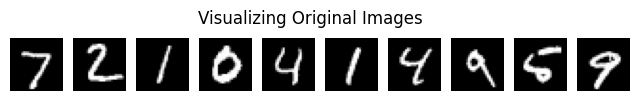

Visualizing reconstructions for fold 1


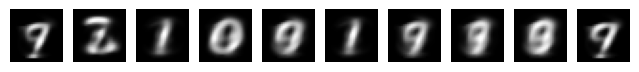

Visualizing reconstructions for fold 2


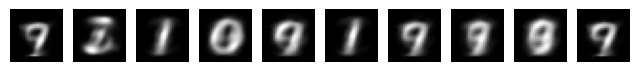

Visualizing reconstructions for fold 3


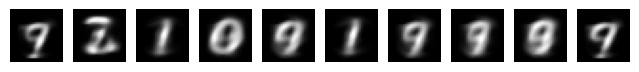

Visualizing reconstructions for fold 4


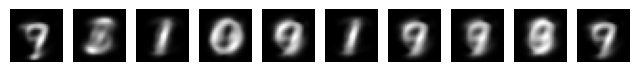

Visualizing reconstructions for fold 5


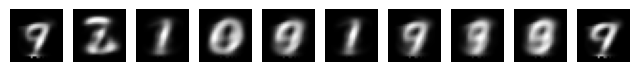

Visualizing reconstructions for fold 6


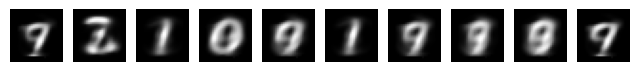

Visualizing reconstructions for fold 7


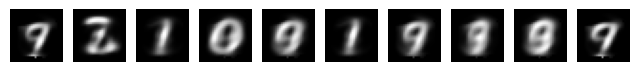

Visualizing reconstructions for fold 8


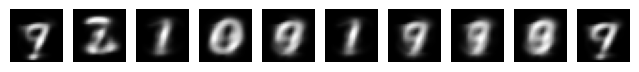

Visualizing reconstructions for fold 9


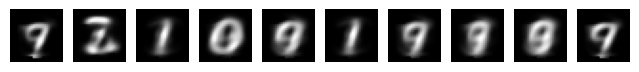

Visualizing reconstructions for fold 10


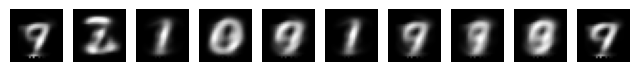

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_1_1):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

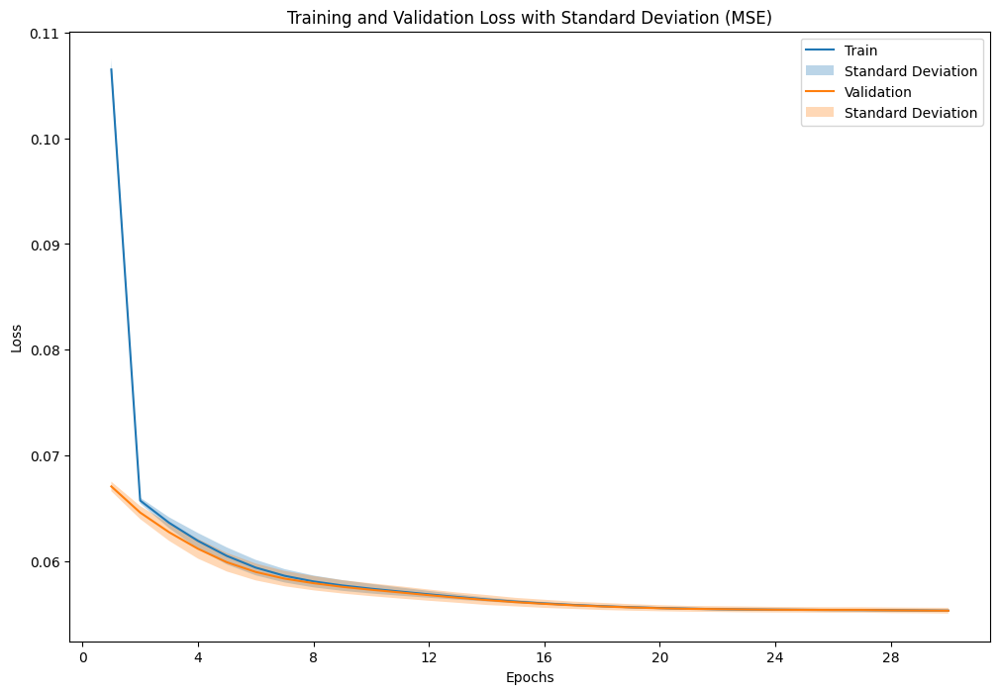

In [ ]:
loss_type_to_plot = 'MSE'  # We can change this to our desired loss type
result_data_1_1_1 = AE_plot_results(fold_results_1_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_1_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_1_1['epochs'])
plot_mean_std(result_data_1_1_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_1_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_1_1['valid_result'], result_data_1_1_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.055315   0.055031
1  Standard Deviation         0.000270   0.000087

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.054977,0.055007
1,2,0.055371,0.055098
2,3,0.055544,0.054955
3,4,0.055075,0.054907
4,5,0.055313,0.055109
5,6,0.055589,0.055145
6,7,0.055555,0.055137
7,8,0.055723,0.054901
8,9,0.055071,0.054992
9,10,0.054935,0.055056


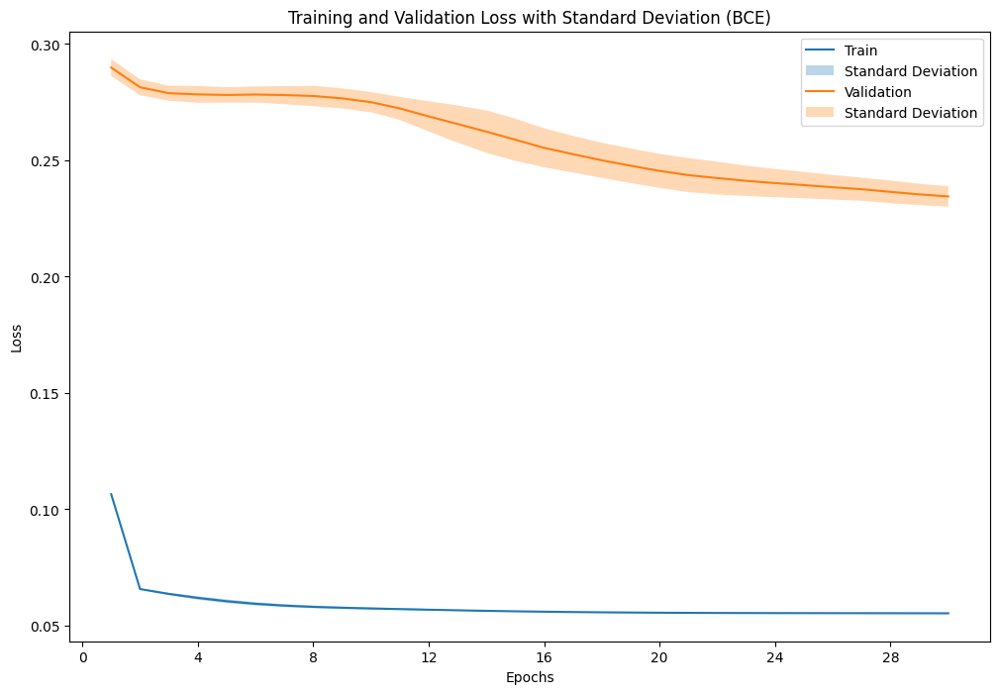

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_1_1_2 = AE_plot_results(fold_results_1_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_1_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_1_2['epochs'])
plot_mean_std(result_data_1_1_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_1_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_1_2['valid_result'], result_data_1_1_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.234479   0.232816
1  Standard Deviation         0.004406   0.004275

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.230731,0.229894
1,2,0.240291,0.238424
2,3,0.232503,0.229885
3,4,0.227357,0.226484
4,5,0.236466,0.234710
5,6,0.241574,0.239123
6,7,0.238302,0.236411
7,8,0.229817,0.226729
8,9,0.233477,0.232807
9,10,0.234268,0.233695


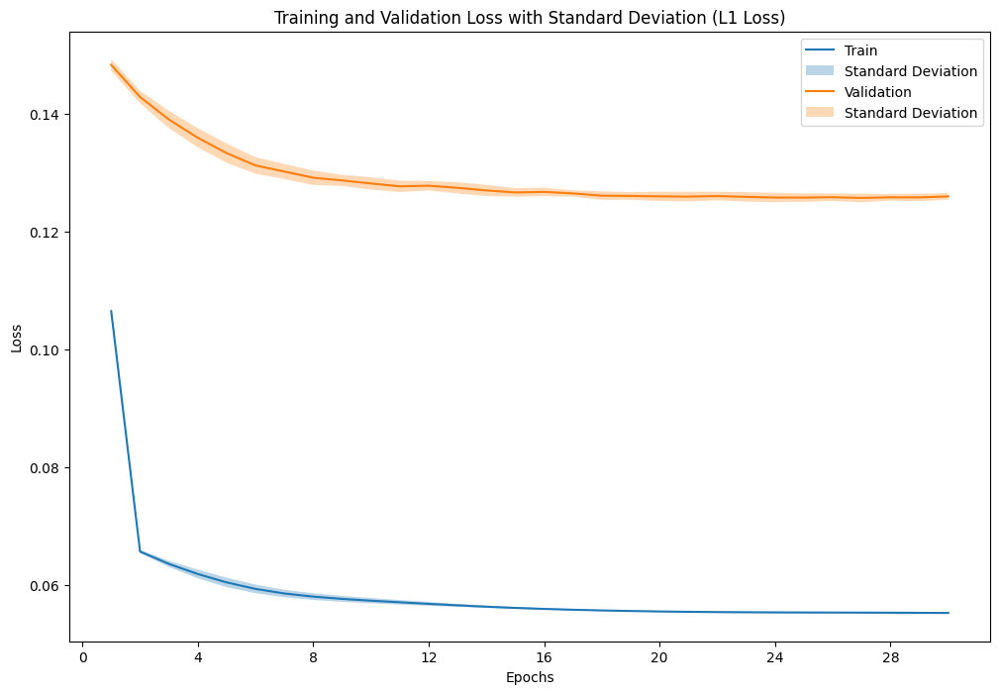

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_1_1_3 = AE_plot_results(fold_results_1_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_1_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_1_3['epochs'])
plot_mean_std(result_data_1_1_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_1_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_1_3['valid_result'], result_data_1_1_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.125978   0.125842
1  Standard Deviation         0.000541   0.000217

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.125832,0.126139
1,2,0.125720,0.125611
2,3,0.126474,0.125870
3,4,0.126042,0.126015
4,5,0.125746,0.125690
5,6,0.126157,0.125804
6,7,0.125872,0.125634
7,8,0.127248,0.126251
8,9,0.125532,0.125810
9,10,0.125156,0.125597


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_1_1 = sum(p.numel() for p in models_1_1[0].parameters())
print(f"Number of parameters in the model: {total_params_1_1}")

Number of parameters in the model: 3922


### Latente Space for each fold

<ipython-input-10-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


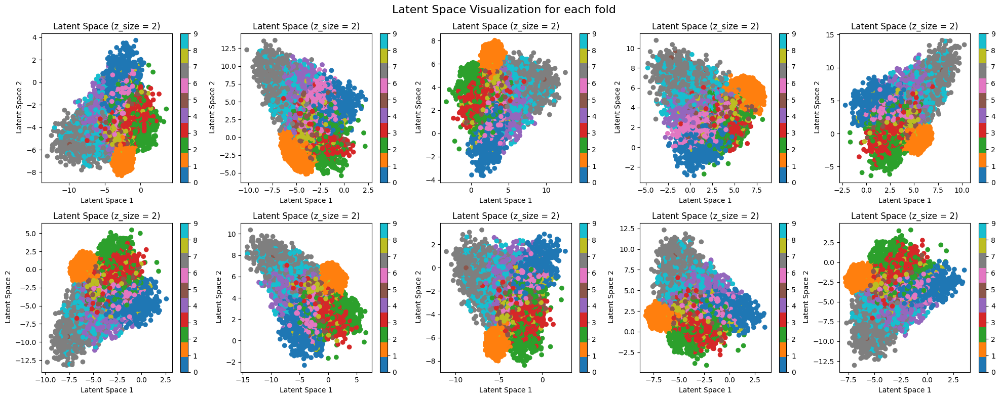

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))
fig.suptitle('Latent Space Visualization for each fold', fontsize=16)

# Flatten the 2D array of subplots
axes = axes.flatten()

for i, model in enumerate(models_1_1):
    latent_space_AE_model(model, test_loader, device, ax=axes[i])

# plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


<ipython-input-10-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


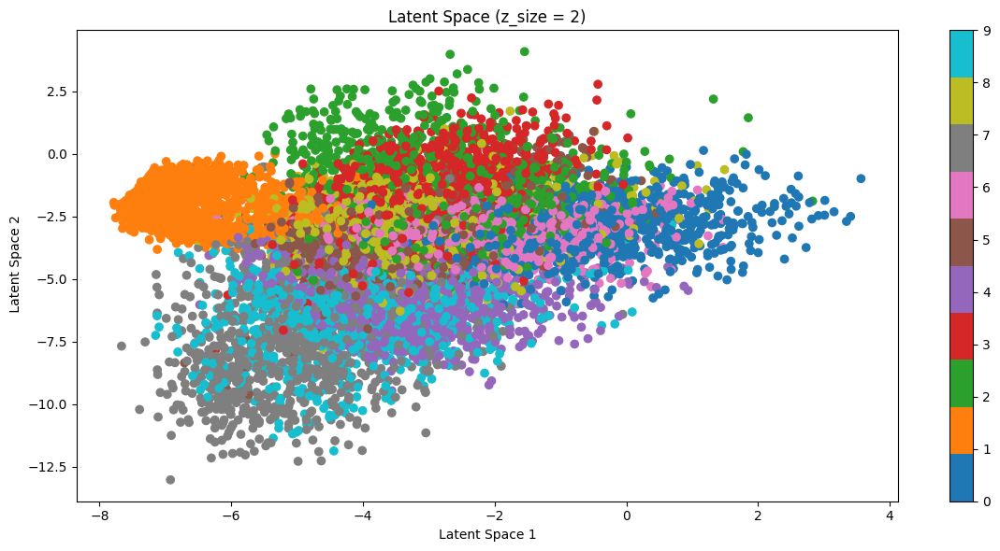

In [ ]:
latent_space_AE_model(models_1_1[9], test_loader, device)
# print(type(models_1_4[9]))

### Experiment 1.2: AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=8, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_1_2 = 'AE'
model_config_1_2 = {'D_x': 784, 'n_layers': 1, 'D_z': 8, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_1_2, fold_results_1_2 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_1_2),
                                                model_config=model_config_1_2,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=8, bias=True)]
[Linear(in_features=8, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.071678
Validation Fold/Epoch: 1/1, Average AE Loss: {'MSE': 0.04961160831946008, 'L1 Loss': 0.11395222059589752, 'BCE': 0.2358954520301616}
Train Fold/Epoch: 1/2, Training Loss: 0.044891
Validation Fold/Epoch: 1/2, Average AE Loss: {'MSE': 0.04123655290521206, 'L1 Loss': 0.09877493945842093, 'BCE': 0.213584969493937}
Train Fold/Epoch: 1/3, Training Loss: 0.039346
Validation Fold/Epoch: 1/3, Average AE Loss: {'MSE': 0.0378757525790245, 'L1 Loss': 0.09225641634870083, 'BCE': 0.2048860198639809}
Train Fold/Epoch: 1/4, Training Loss: 0.037005
Validation Fold/Epoch: 1/4, Average AE Loss: {'MSE': 0.036355208803681614, 'L1 Loss': 0.08892903881187135, 'BCE': 0.20144652147242365}
Train Fold

### Visualizing reconstructions for all fold

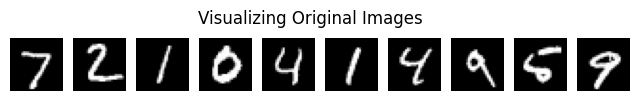

Visualizing reconstructions for fold 1


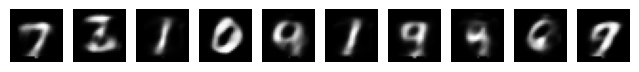

Visualizing reconstructions for fold 2


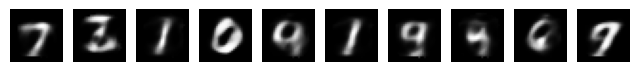

Visualizing reconstructions for fold 3


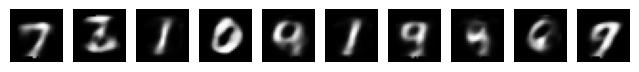

Visualizing reconstructions for fold 4


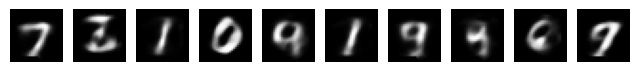

Visualizing reconstructions for fold 5


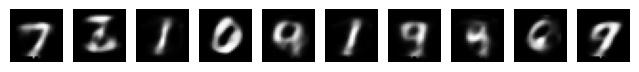

Visualizing reconstructions for fold 6


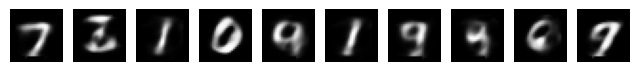

Visualizing reconstructions for fold 7


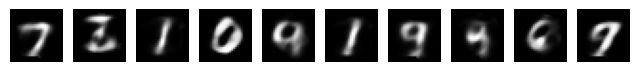

Visualizing reconstructions for fold 8


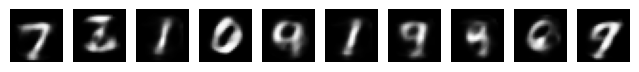

Visualizing reconstructions for fold 9


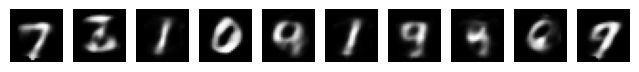

Visualizing reconstructions for fold 10


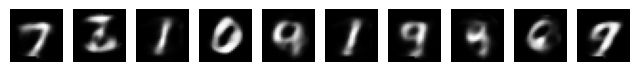

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_1_2):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

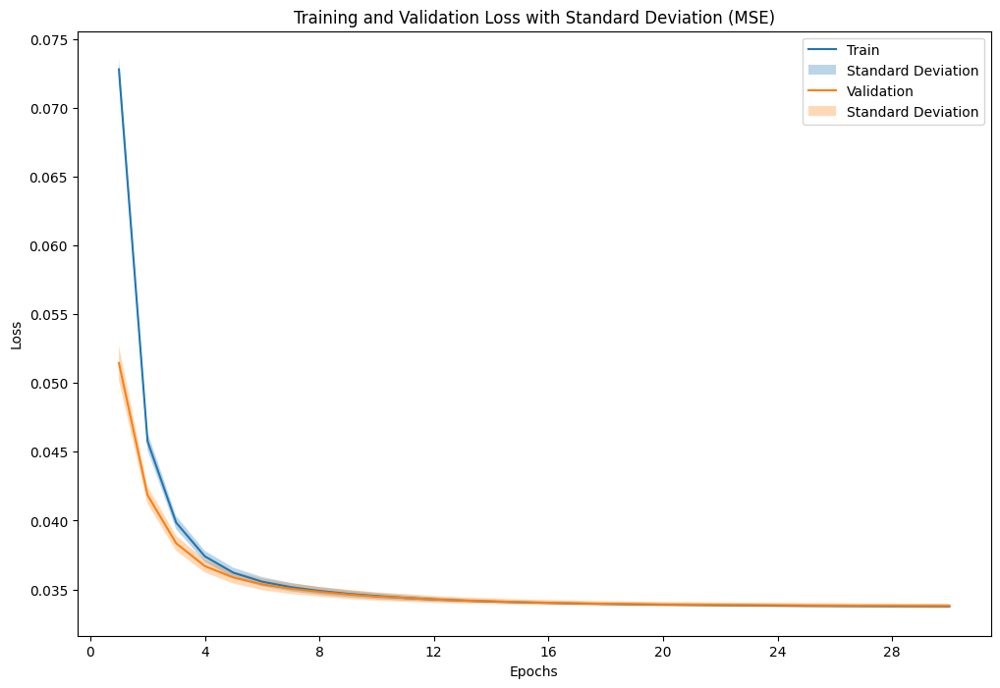

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_1_2_1 = AE_plot_results(fold_results_1_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_2_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_2_1['epochs'])
plot_mean_std(result_data_1_2_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_2_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_2_1['valid_result'], result_data_1_2_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.033802   0.033319
1  Standard Deviation         0.000171   0.000106

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.033832,0.033362
1,2,0.033819,0.033460
2,3,0.034047,0.033395
3,4,0.033757,0.033346
4,5,0.033903,0.033321
5,6,0.033947,0.033426
6,7,0.033879,0.033342
7,8,0.033835,0.033101
8,9,0.033557,0.033166
9,10,0.033441,0.033273


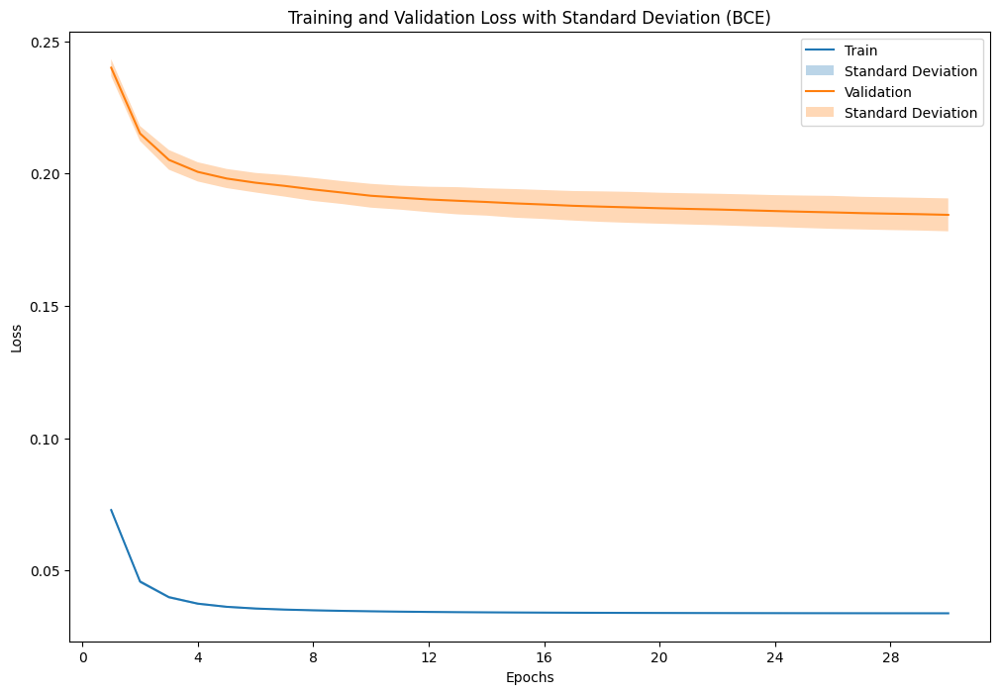

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_1_2_2 = AE_plot_results(fold_results_1_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_2_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_2_2['epochs'])
plot_mean_std(result_data_1_2_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_2_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_2_2['valid_result'], result_data_1_2_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.184412   0.182613
1  Standard Deviation         0.006224   0.006190

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.184854,0.182845
1,2,0.190364,0.188403
2,3,0.190611,0.188172
3,4,0.186195,0.184966
4,5,0.184718,0.182667
5,6,0.190934,0.189279
6,7,0.187205,0.185372
7,8,0.171800,0.169232
8,9,0.174485,0.173617
9,10,0.182959,0.181576


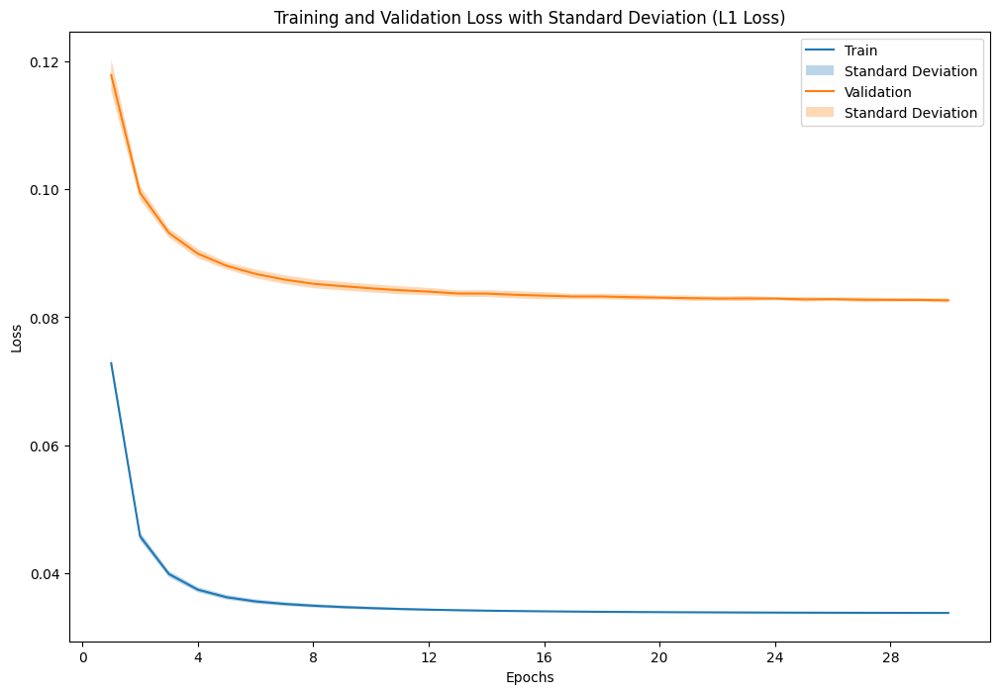

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_1_2_3 = AE_plot_results(fold_results_1_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_2_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_2_3['epochs'])
plot_mean_std(result_data_1_2_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_2_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_2_3['valid_result'], result_data_1_2_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.082636   0.081822
1  Standard Deviation         0.000333   0.000180

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.082766,0.081955
1,2,0.082533,0.082001
2,3,0.082735,0.081729
3,4,0.082329,0.081605
4,5,0.082699,0.081630
5,6,0.082649,0.081730
6,7,0.082721,0.081824
7,8,0.083404,0.082225
8,9,0.082481,0.081806
9,10,0.082040,0.081712


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_1_2 = sum(p.numel() for p in models_1_2[0].parameters())
print(f"Number of parameters in the model: {total_params_1_2}")

Number of parameters in the model: 13336


### Experiment 1.3: AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=16, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_1_3 = 'AE'
model_config_1_3 = {'D_x': 784, 'n_layers': 1, 'D_z': 16, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_1_3, fold_results_1_3 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_1_3),
                                                model_config=model_config_1_3,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=16, bias=True)]
[Linear(in_features=16, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.056109
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.03582486226916947, 'L1 Loss': 0.08904048681576202, 'BCE': 0.19598675408261887}
Train Fold/Epoch: 1/2, Training Loss: 0.031302
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.02786825418947859, 'L1 Loss': 0.0733771431160734, 'BCE': 0.1685629889686057}
Train Fold/Epoch: 1/3, Training Loss: 0.025892
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.024315316150797173, 'L1 Loss': 0.06629393998771271, 'BCE': 0.1537520097608262}
Train Fold/Epoch: 1/4, Training Loss: 0.023465
Validation Fold/Epoch: 1/4, Validation AE Loss: {'MSE': 0.022814307005164472, 'L1 Loss': 0.06259285979607004, 'BCE': 0.146587812678

### Visualizing reconstructions for all fold

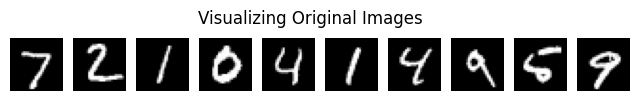

Visualizing reconstructions for fold 1


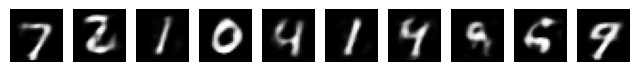

Visualizing reconstructions for fold 2


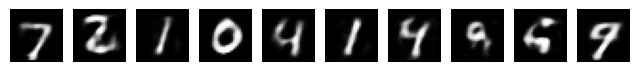

Visualizing reconstructions for fold 3


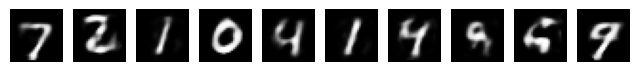

Visualizing reconstructions for fold 4


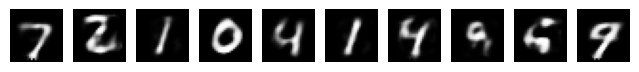

Visualizing reconstructions for fold 5


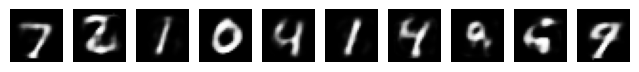

Visualizing reconstructions for fold 6


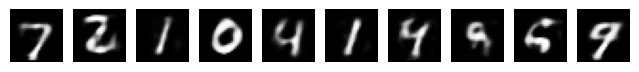

Visualizing reconstructions for fold 7


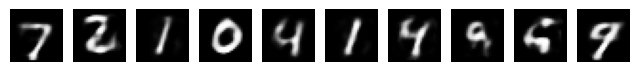

Visualizing reconstructions for fold 8


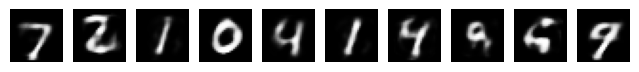

Visualizing reconstructions for fold 9


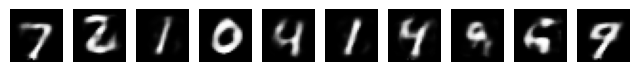

Visualizing reconstructions for fold 10


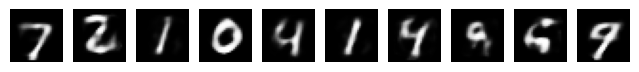

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_1_3):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

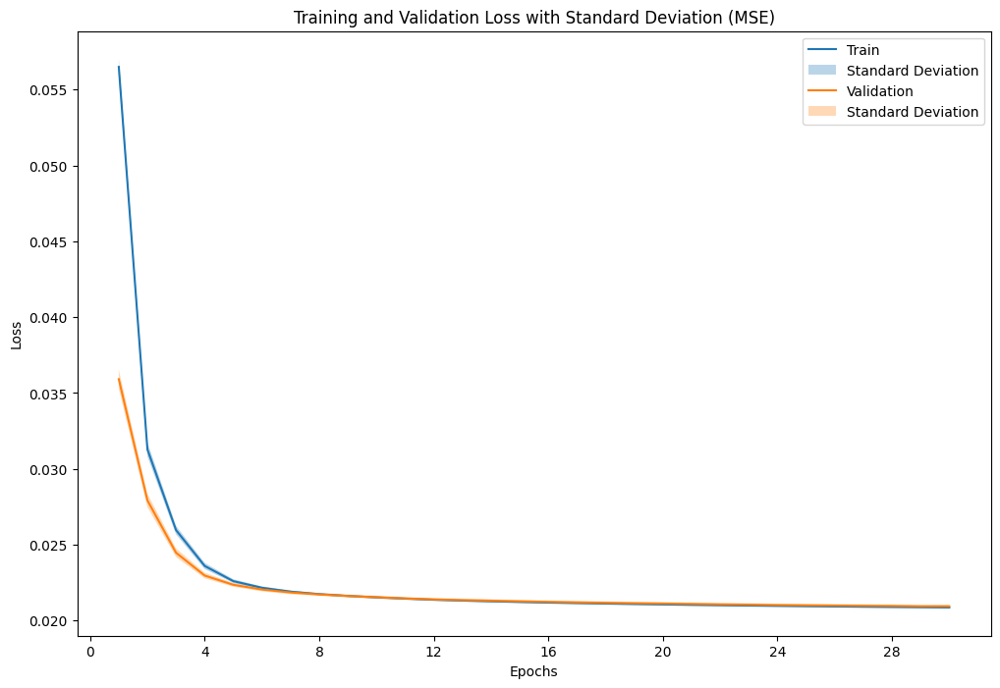

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_1_3_1 = AE_plot_results(fold_results_1_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_3_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_3_1['epochs'])
plot_mean_std(result_data_1_3_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_3_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_3_1['valid_result'], result_data_1_3_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.020944   0.020364
1  Standard Deviation         0.000089   0.000040

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.021013,0.020416
1,2,0.020871,0.020296
2,3,0.021099,0.020422
3,4,0.020849,0.020335
4,5,0.021031,0.020323
5,6,0.020959,0.020375
6,7,0.020964,0.020367
7,8,0.020955,0.020334
8,9,0.020926,0.020407
9,10,0.020776,0.020369


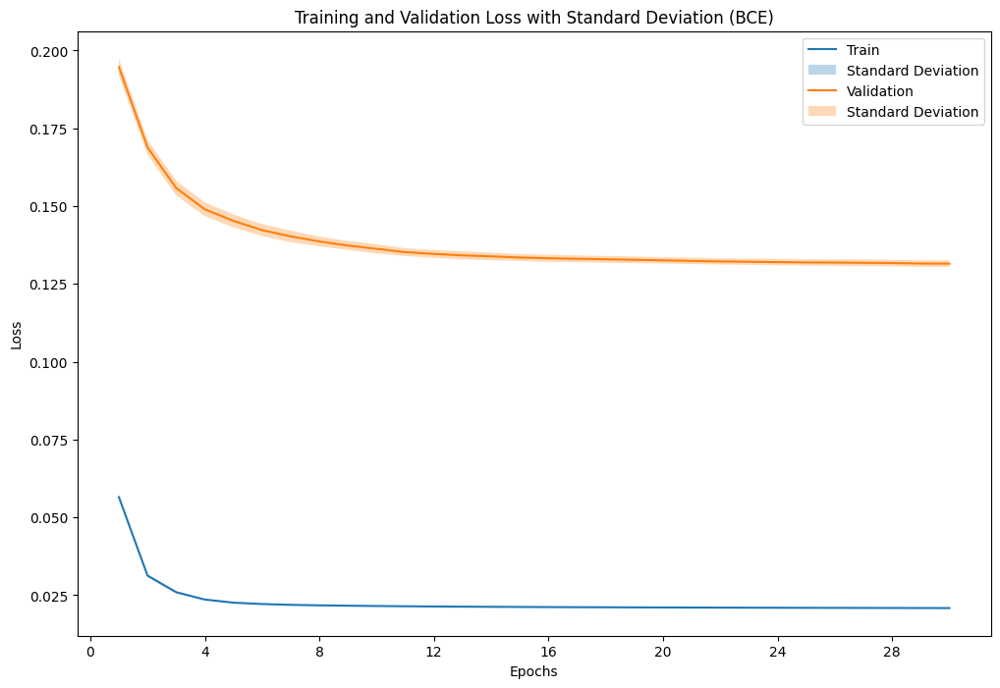

In [ ]:
loss_type_to_plot = 'BCE'  # We can change this to our desired loss type
result_data_1_3_2 = AE_plot_results(fold_results_1_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_3_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_3_2['epochs'])
plot_mean_std(result_data_1_3_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_3_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_3_2['valid_result'], result_data_1_3_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.131497   0.129503
1  Standard Deviation         0.001080   0.000917

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.131649,0.129505
1,2,0.129759,0.127787
2,3,0.131183,0.129061
3,4,0.131672,0.129810
4,5,0.134212,0.131549
5,6,0.131116,0.128619
6,7,0.131367,0.129695
7,8,0.132028,0.129785
8,9,0.131262,0.129784
9,10,0.130718,0.129432


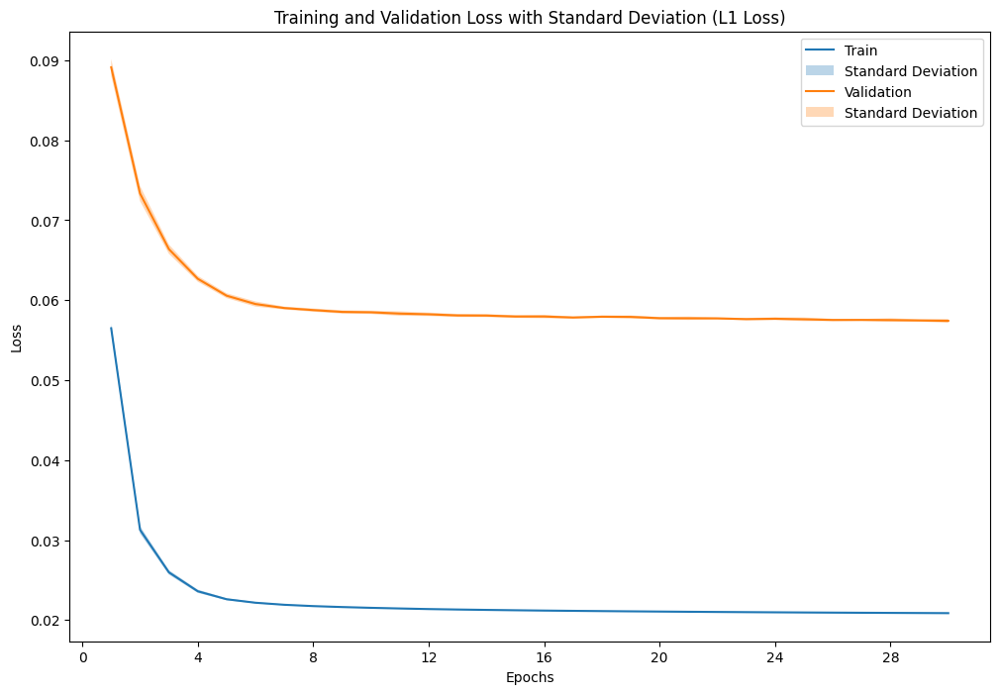

In [ ]:
loss_type_to_plot = 'L1 Loss'  # We can change this to our desired loss type
result_data_1_3_3 = AE_plot_results(fold_results_1_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_3_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_3_3['epochs'])
plot_mean_std(result_data_1_3_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_3_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_3_3['valid_result'], result_data_1_3_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.057422   0.056342
1  Standard Deviation         0.000248   0.000224

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.057370,0.056291
1,2,0.057353,0.056427
2,3,0.057719,0.056492
3,4,0.057323,0.056297
4,5,0.057376,0.056059
5,6,0.057822,0.056700
6,7,0.057292,0.056178
7,8,0.057250,0.056079
8,9,0.057741,0.056713
9,10,0.056974,0.056178


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_1_3 = sum(p.numel() for p in models_1_3[0].parameters())
print(f"Number of parameters in the model: {total_params_1_3}")

Number of parameters in the model: 25888


### Experiment 1.4: AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=32, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_1_4 = 'AE'
model_config_1_4 = {'D_x': 784, 'n_layers': 1, 'D_z': 32, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_1_4, fold_results_1_4 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_1_4),
                                                model_config=model_config_1_4,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=32, bias=True)]
[Linear(in_features=32, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.044184
Validation Fold/Epoch: 1/1, Average AE Loss: {'MSE': 0.02431976385018293, 'L1 Loss': 0.07013528159958252, 'BCE': 0.15241002814566834}
Train Fold/Epoch: 1/2, Training Loss: 0.019186
Validation Fold/Epoch: 1/2, Average AE Loss: {'MSE': 0.015626020997049326, 'L1 Loss': 0.05129019805091493, 'BCE': 0.1216399018910337}
Train Fold/Epoch: 1/3, Training Loss: 0.013487
Validation Fold/Epoch: 1/3, Average AE Loss: {'MSE': 0.01208970496589516, 'L1 Loss': 0.042157592925619575, 'BCE': 0.10717943183919217}
Train Fold/Epoch: 1/4, Training Loss: 0.011337
Validation Fold/Epoch: 1/4, Average AE Loss: {'MSE': 0.01095675468008886, 'L1 Loss': 0.03808173089426883, 'BCE': 0.1013454868596919}
Trai

### Visualizing reconstructions for all fold

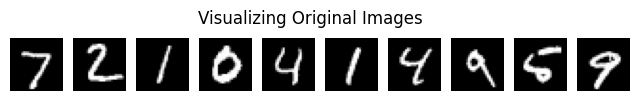

Visualizing reconstructions for fold 1


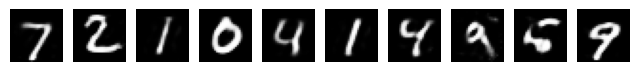

Visualizing reconstructions for fold 2


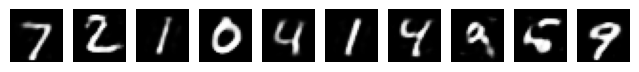

Visualizing reconstructions for fold 3


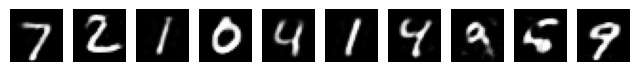

Visualizing reconstructions for fold 4


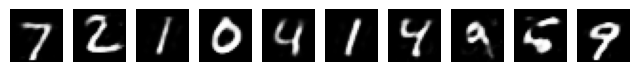

Visualizing reconstructions for fold 5


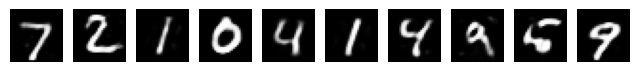

Visualizing reconstructions for fold 6


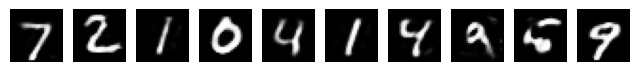

Visualizing reconstructions for fold 7


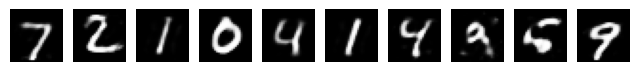

Visualizing reconstructions for fold 8


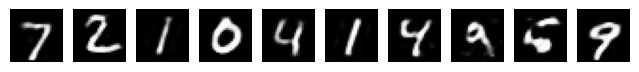

Visualizing reconstructions for fold 9


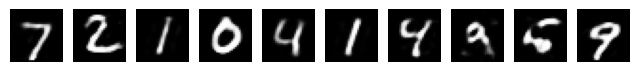

Visualizing reconstructions for fold 10


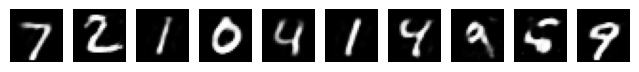

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_1_4):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

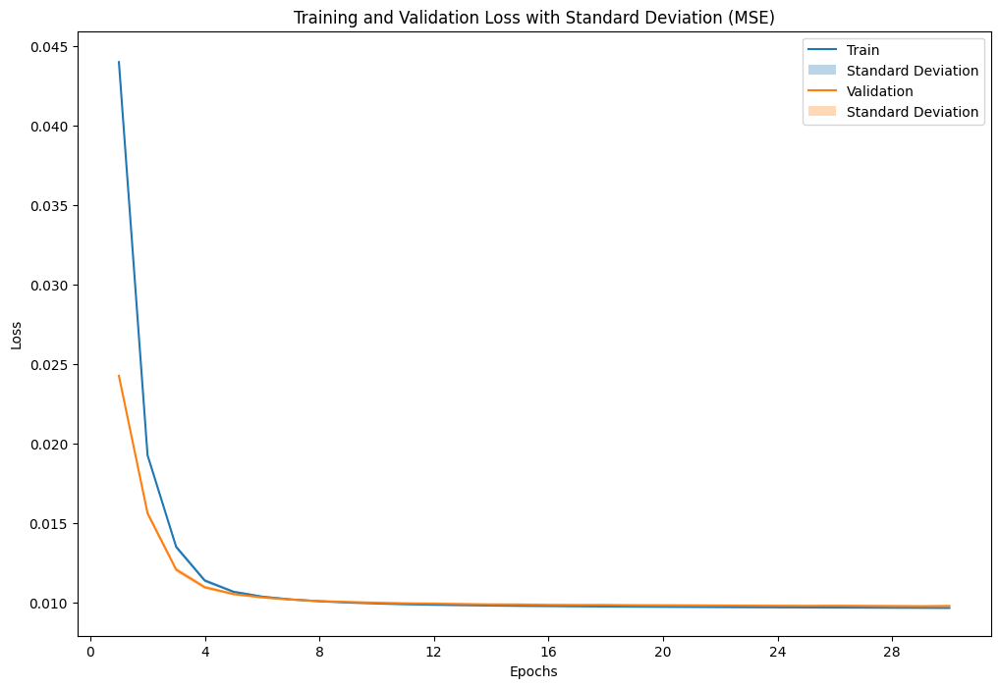

In [ ]:
loss_type_to_plot = 'MSE'  # We can change this to our desired loss type
result_data_1_4_1 = AE_plot_results(fold_results_1_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_4_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_4_1['epochs'])
plot_mean_std(result_data_1_4_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_4_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_4_1['valid_result'], result_data_1_4_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.009812   0.009411
1  Standard Deviation         0.000029   0.000016

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.009832,0.009387
1,2,0.009823,0.009395
2,3,0.009801,0.009396
3,4,0.009788,0.009423
4,5,0.009866,0.009421
5,6,0.009816,0.009422
6,7,0.009798,0.009434
7,8,0.009844,0.009414
8,9,0.009788,0.009392
9,10,0.009764,0.009427


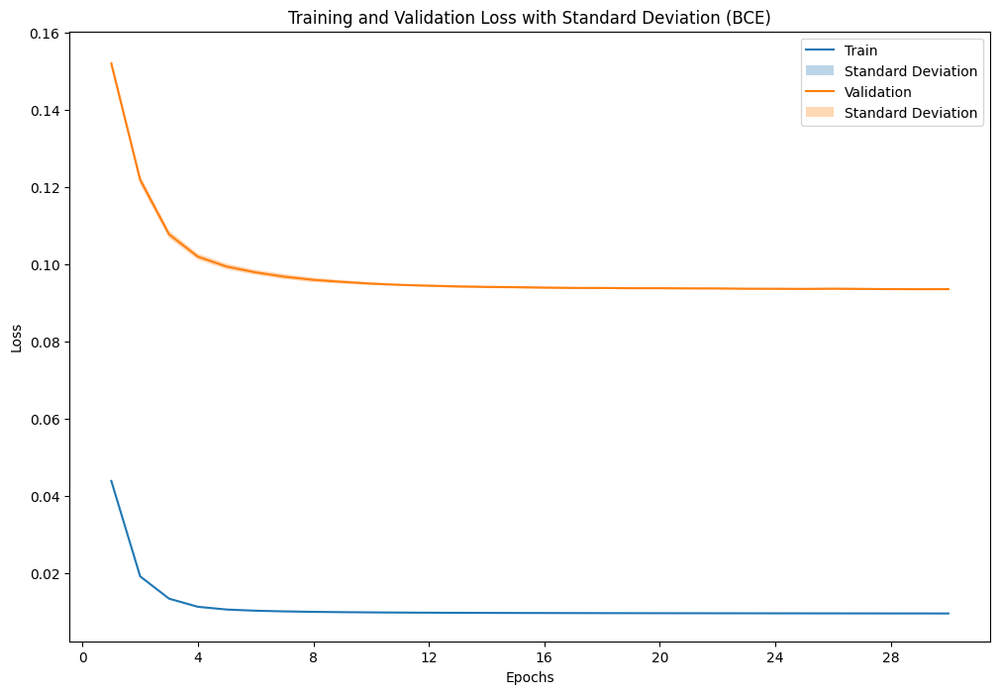

In [ ]:
loss_type_to_plot = 'BCE'  # We can change this to our desired loss type
result_data_1_4_2 = AE_plot_results(fold_results_1_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_4_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_4_2['epochs'])
plot_mean_std(result_data_1_4_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_4_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_4_2['valid_result'], result_data_1_4_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.093588   0.092019
1  Standard Deviation         0.000292   0.000092

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.093768,0.092041
1,2,0.093379,0.091830
2,3,0.093468,0.091877
3,4,0.093410,0.092026
4,5,0.093814,0.092158
5,6,0.093985,0.092073
6,7,0.093555,0.092094
7,8,0.094073,0.092028
8,9,0.093264,0.092017
9,10,0.093160,0.092049


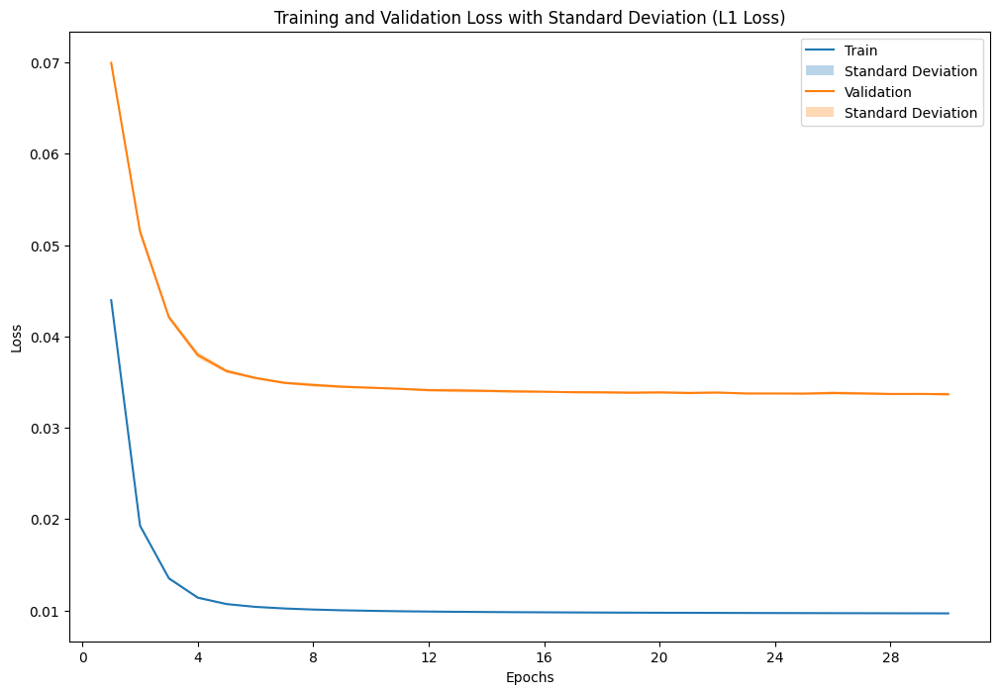

In [ ]:
loss_type_to_plot = 'L1 Loss'  # We can change this to our desired loss type
result_data_1_4_3 = AE_plot_results(fold_results_1_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_4_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_4_3['epochs'])
plot_mean_std(result_data_1_4_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_4_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_4_3['valid_result'], result_data_1_4_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.033675   0.032822
1  Standard Deviation         0.000177   0.000130

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.033875,0.032914
1,2,0.033394,0.032574
2,3,0.033601,0.032724
3,4,0.033477,0.032703
4,5,0.033954,0.032977
5,6,0.033881,0.033005
6,7,0.033584,0.032794
7,8,0.033670,0.032755
8,9,0.033756,0.032936
9,10,0.033554,0.032842


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_1_4 = sum(p.numel() for p in models_1_4[0].parameters())
print(f"Number of parameters in the model: {total_params_1_4}")

Number of parameters in the model: 50992


### Experiment 1.5: AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=64, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_1_5 = 'AE'
model_config_1_5 = {'D_x': 784, 'n_layers': 1, 'D_z': 64, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_1_5, fold_results_1_5 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_1_5),
                                                model_config=model_config_1_5,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=64, bias=True)]
[Linear(in_features=64, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.034604
Validation Fold/Epoch: 1/1, Average AE Loss: {'MSE': 0.016164053588154467, 'L1 Loss': 0.05621400071268386, 'BCE': 0.12264508944242558}
Train Fold/Epoch: 1/2, Training Loss: 0.011274
Validation Fold/Epoch: 1/2, Average AE Loss: {'MSE': 0.00789487751775441, 'L1 Loss': 0.03611067611169308, 'BCE': 0.09388028965034384}
Train Fold/Epoch: 1/3, Training Loss: 0.006417
Validation Fold/Epoch: 1/3, Average AE Loss: {'MSE': 0.005496331128945693, 'L1 Loss': 0.02739721705067031, 'BCE': 0.08316008857590088}
Train Fold/Epoch: 1/4, Training Loss: 0.004979
Validation Fold/Epoch: 1/4, Average AE Loss: {'MSE': 0.00465027723669451, 'L1 Loss': 0.024105116606075713, 'BCE': 0.07912556026527222}
T

### Visualizing reconstructions for all fold

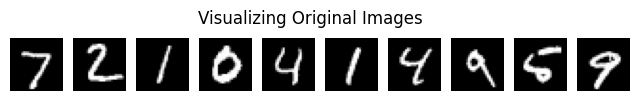

Visualizing reconstructions for fold 1


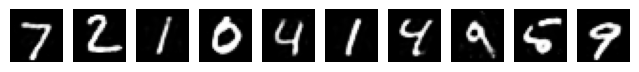

Visualizing reconstructions for fold 2


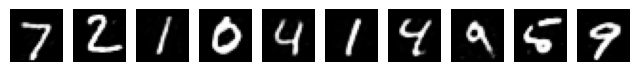

Visualizing reconstructions for fold 3


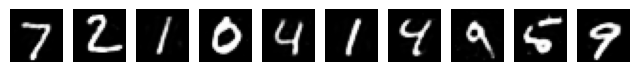

Visualizing reconstructions for fold 4


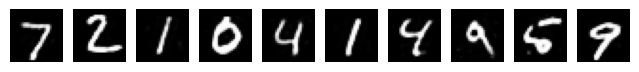

Visualizing reconstructions for fold 5


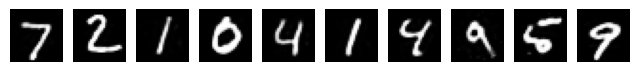

Visualizing reconstructions for fold 6


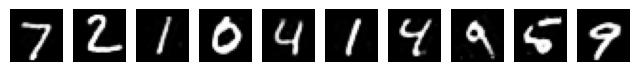

Visualizing reconstructions for fold 7


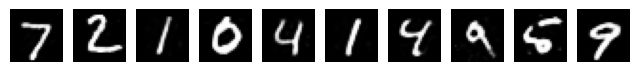

Visualizing reconstructions for fold 8


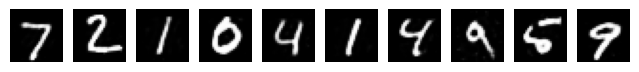

Visualizing reconstructions for fold 9


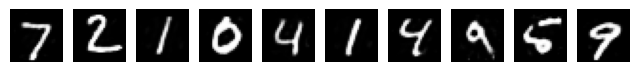

Visualizing reconstructions for fold 10


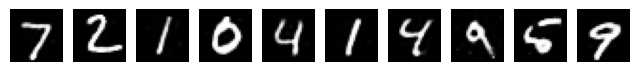

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_1_5):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

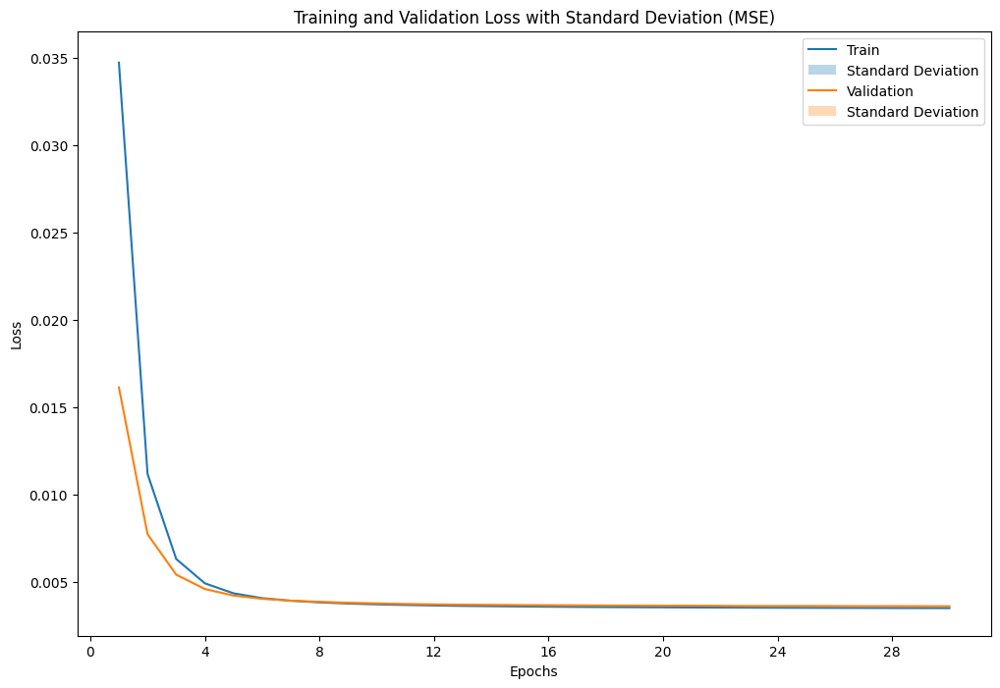

In [ ]:
loss_type_to_plot = 'MSE'  # We can change this to our desired loss type
result_data_1_5_1 = AE_plot_results(fold_results_1_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_5_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_5_1['epochs'])
plot_mean_std(result_data_1_5_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_5_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_5_1['valid_result'], result_data_1_5_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.003633   0.003473
1  Standard Deviation         0.000022   0.000010

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.003667,0.003480
1,2,0.003643,0.003478
2,3,0.003636,0.003478
3,4,0.003603,0.003464
4,5,0.003650,0.003455
5,6,0.003639,0.003480
6,7,0.003606,0.003470
7,8,0.003651,0.003460
8,9,0.003634,0.003479
9,10,0.003599,0.003487


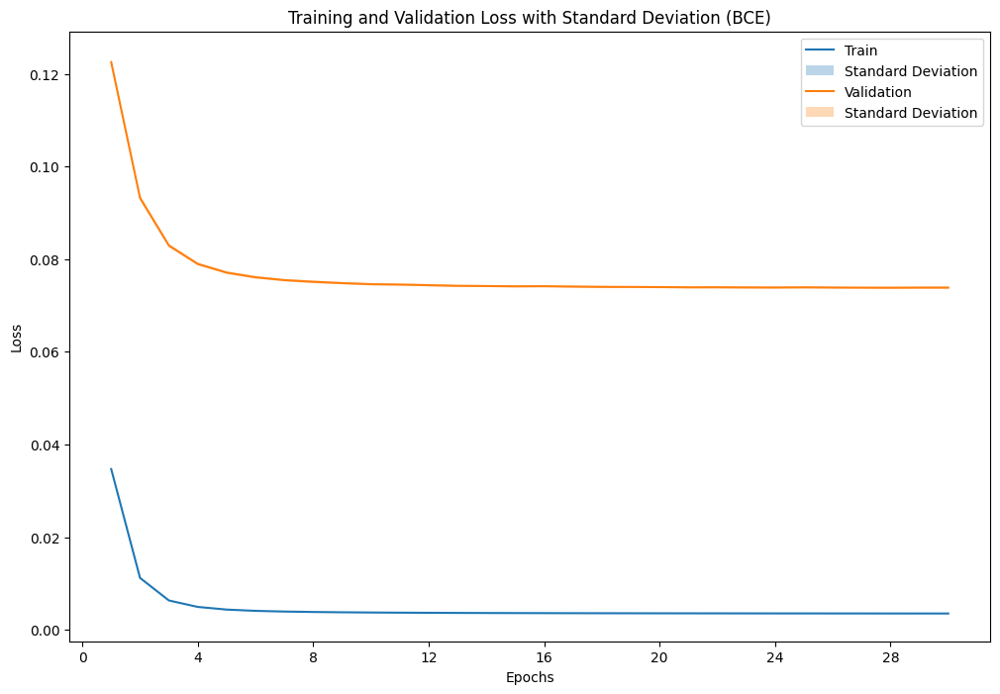

In [ ]:
loss_type_to_plot = 'BCE'  # We can change this to our desired loss type
result_data_1_5_2 = AE_plot_results(fold_results_1_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_5_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_5_2['epochs'])
plot_mean_std(result_data_1_5_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_5_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_5_2['valid_result'], result_data_1_5_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.073855   0.072985
1  Standard Deviation         0.000231   0.000064

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.074064,0.073000
1,2,0.073837,0.073043
2,3,0.073750,0.072892
3,4,0.073734,0.072965
4,5,0.073861,0.072894
5,6,0.074264,0.073105
6,7,0.073729,0.072995
7,8,0.074186,0.072943
8,9,0.073555,0.072969
9,10,0.073573,0.073044


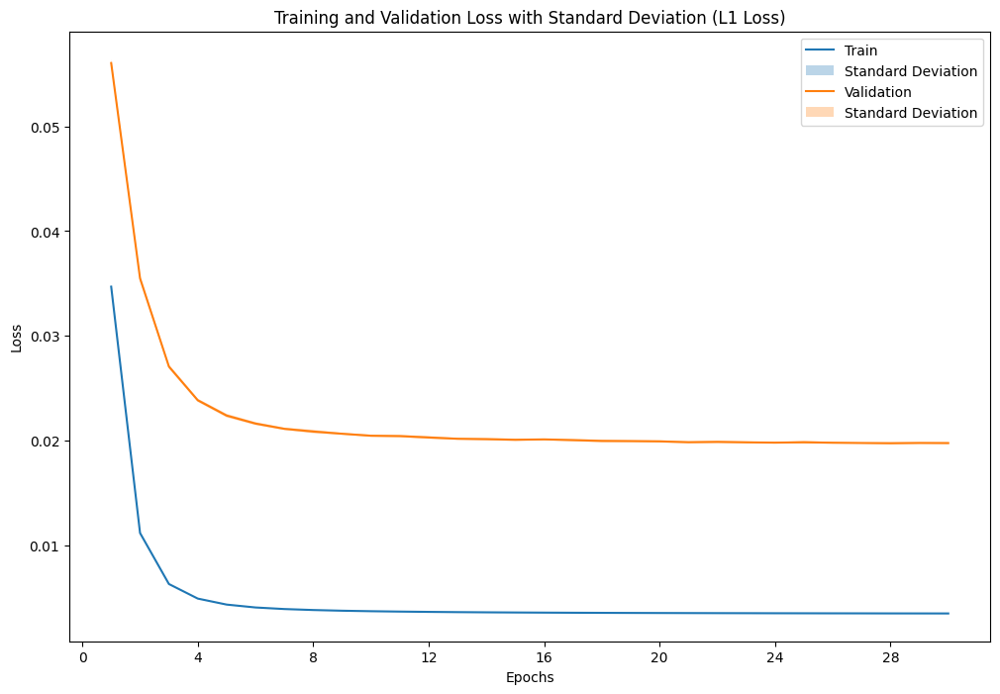

In [ ]:
loss_type_to_plot = 'L1 Loss'  # We can change this to our desired loss type
result_data_1_5_3 = AE_plot_results(fold_results_1_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_5_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_5_3['epochs'])
plot_mean_std(result_data_1_5_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_5_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_5_3['valid_result'], result_data_1_5_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.019782   0.019320
1  Standard Deviation         0.000085   0.000074

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.019910,0.019357
1,2,0.019843,0.019398
2,3,0.019670,0.019203
3,4,0.019722,0.019317
4,5,0.019754,0.019223
5,6,0.019929,0.019455
6,7,0.019739,0.019318
7,8,0.019825,0.019259
8,9,0.019710,0.019298
9,10,0.019715,0.019368


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_1_5 = sum(p.numel() for p in models_1_5[0].parameters())
print(f"Number of parameters in the model: {total_params_1_5}")

Number of parameters in the model: 101200


## Test 2 AE: BCE

### Experiment 2.1 : AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=2, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_2_1 = 'AE'
model_config_2_1 = {'D_x': 784, 'n_layers': 1, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_2_1, fold_results_2_1 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_2_1),
                                                model_config=model_config_2_1,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=2, bias=True)]
[Linear(in_features=2, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.373462
Validation Fold/Epoch: 1/1, Average AE Loss: {'MSE': 0.06646707527180935, 'L1 Loss': 0.152380810931642, 'BCE': 0.26350794003364886}
Train Fold/Epoch: 1/2, Training Loss: 0.260712
Validation Fold/Epoch: 1/2, Average AE Loss: {'MSE': 0.06449976044290877, 'L1 Loss': 0.1472572696969864, 'BCE': 0.25726194109054323}
Train Fold/Epoch: 1/3, Training Loss: 0.255129
Validation Fold/Epoch: 1/3, Average AE Loss: {'MSE': 0.06251620992701104, 'L1 Loss': 0.14225120699786126, 'BCE': 0.2518131556980153}
Train Fold/Epoch: 1/4, Training Loss: 0.249415
Validation Fold/Epoch: 1/4, Average AE Loss: {'MSE': 0.06060813030505434, 'L1 Loss': 0.1389216274974194, 'BCE': 0.2460356590912697}
Train Fold/E

### Visualizing reconstructions for all fold

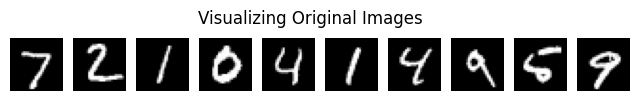

Visualizing reconstructions for fold 1


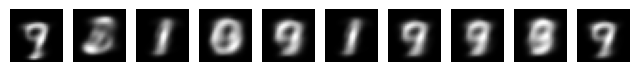

Visualizing reconstructions for fold 2


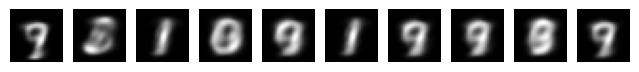

Visualizing reconstructions for fold 3


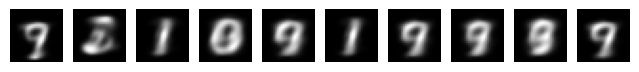

Visualizing reconstructions for fold 4


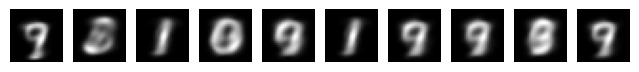

Visualizing reconstructions for fold 5


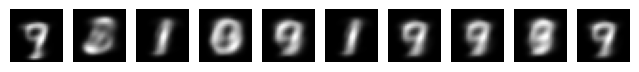

Visualizing reconstructions for fold 6


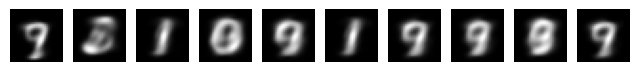

Visualizing reconstructions for fold 7


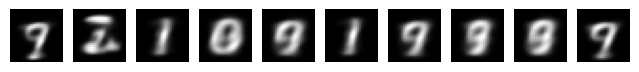

Visualizing reconstructions for fold 8


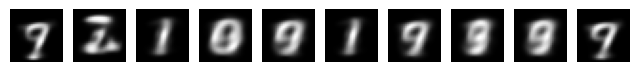

Visualizing reconstructions for fold 9


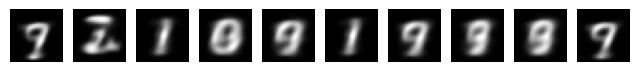

Visualizing reconstructions for fold 10


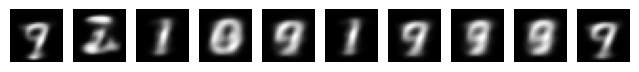

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_2_1):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

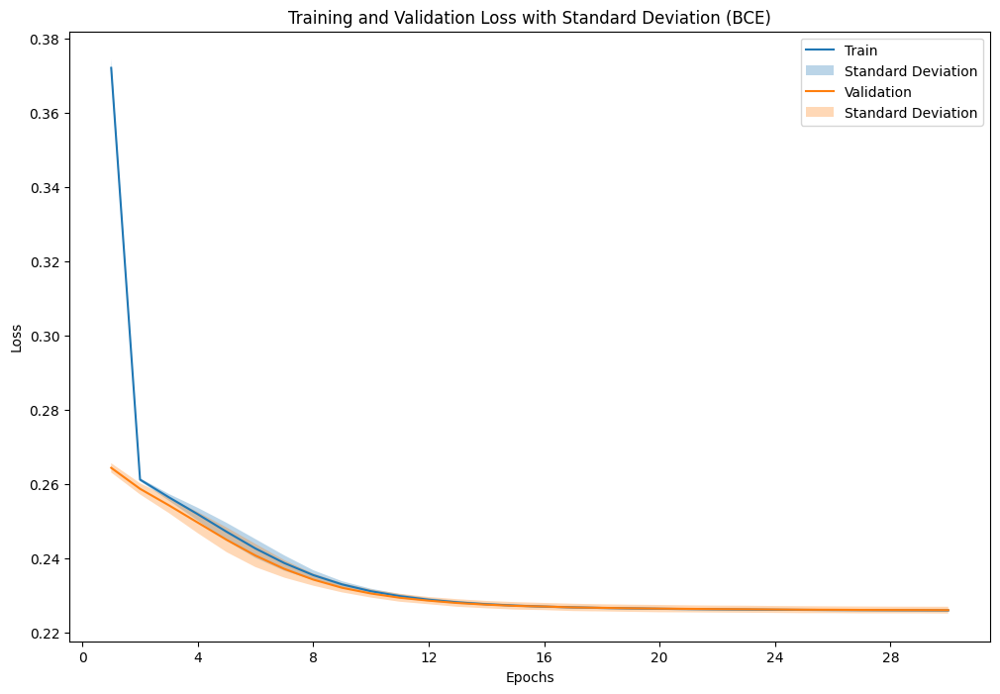

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_2_1_1 = AE_plot_results(fold_results_2_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_1_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_1_1['epochs'])
plot_mean_std(result_data_2_1_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_1_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_1_1['valid_result'], result_data_2_1_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.226050   0.224878
1  Standard Deviation         0.000917   0.000088

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.225479,0.224848
1,2,0.225509,0.224825
2,3,0.226769,0.224812
3,4,0.225459,0.224845
4,5,0.225820,0.224891
5,6,0.226923,0.224900
6,7,0.226571,0.225008
7,8,0.227959,0.225046
8,9,0.225113,0.224875
9,10,0.224901,0.224727


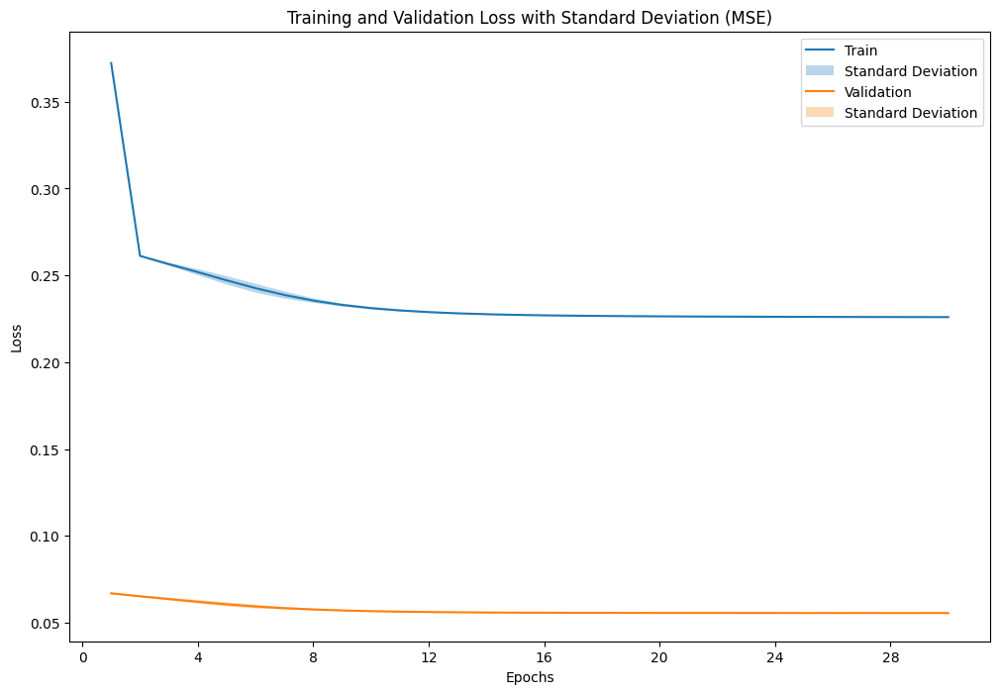

In [ ]:
loss_type_to_plot = 'MSE'  # You can change this to our desired loss type
result_data_2_1_2 = AE_plot_results(fold_results_2_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_1_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_1_2['epochs'])
plot_mean_std(result_data_2_1_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_1_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_1_2['valid_result'], result_data_2_1_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.055572   0.055313
1  Standard Deviation         0.000272   0.000034

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.055341,0.055323
1,2,0.055432,0.055290
2,3,0.055765,0.055252
3,4,0.055419,0.055295
4,5,0.055572,0.055363
5,6,0.055798,0.055325
6,7,0.055742,0.055324
7,8,0.056134,0.055338
8,9,0.055346,0.055351
9,10,0.055172,0.055267


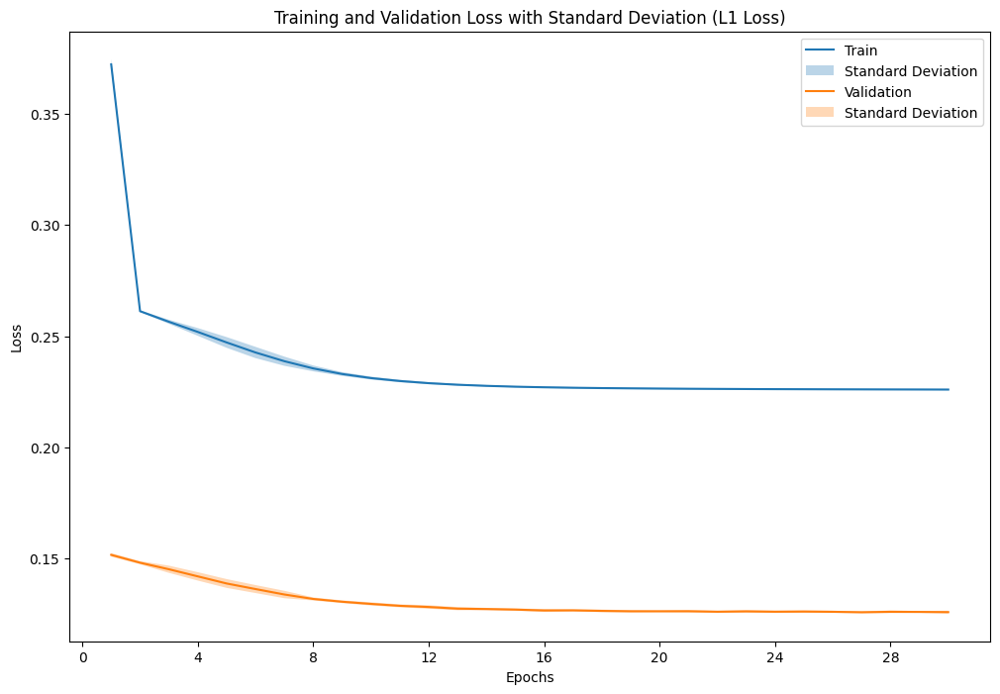

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_2_1_3 = AE_plot_results(fold_results_2_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_1_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_1_3['epochs'])
plot_mean_std(result_data_2_1_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_1_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_1_3['valid_result'], result_data_2_1_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.125921   0.125696
1  Standard Deviation         0.000633   0.000311

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.125559,0.125650
1,2,0.125684,0.125692
2,3,0.126565,0.125875
3,4,0.125670,0.125712
4,5,0.125374,0.125209
5,6,0.126331,0.125762
6,7,0.126886,0.126427
7,8,0.126805,0.125742
8,9,0.125043,0.125326
9,10,0.125297,0.125568


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_2_1 = sum(p.numel() for p in models_2_1[0].parameters())
print(f"Number of parameters in the model: {total_params_2_1}")

Number of parameters in the model: 3922


### Latente Space for each fold

<ipython-input-10-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


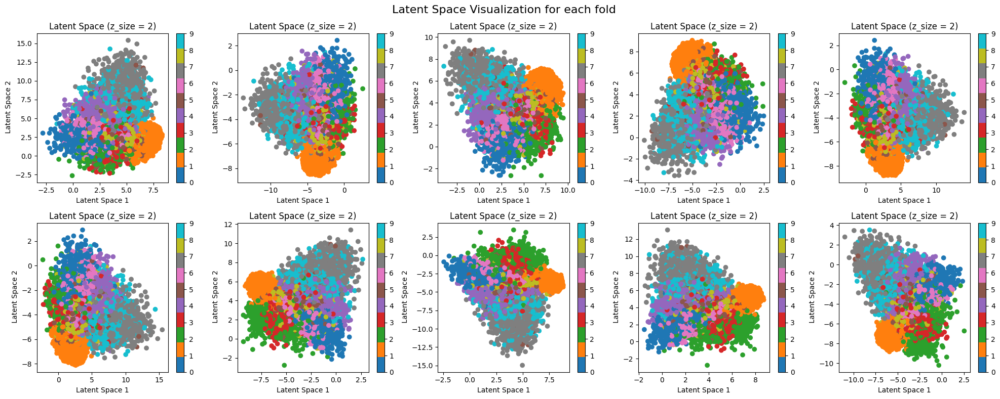

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))
fig.suptitle('Latent Space Visualization for each fold', fontsize=16)

# Flatten the 2D array of subplots
axes = axes.flatten()

for i, model in enumerate(models_2_1):
    latent_space_AE_model(model, test_loader, device, ax=axes[i])

# plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


<ipython-input-10-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


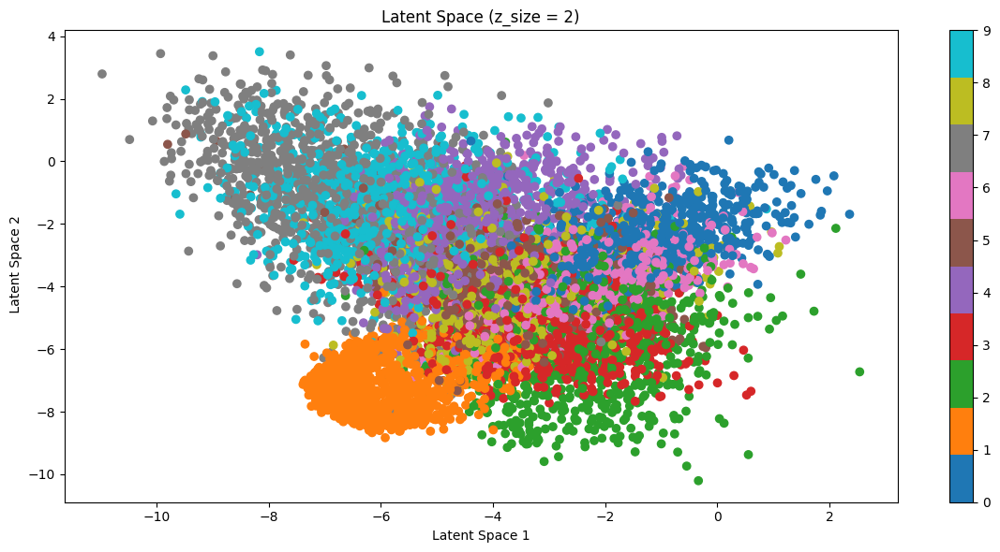

In [ ]:
latent_space_AE_model(models_2_1[9], test_loader, device)
# print(type(models_1_4[9]))

### Experiment 2.2: AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=8, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_2_2 = 'AE'
model_config_2_2 = {'D_x': 784, 'n_layers': 1, 'D_z': 8, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_2_2, fold_results_2_2 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_2_2),
                                                model_config=model_config_2_2,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=8, bias=True)]
[Linear(in_features=8, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.282771
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.05162675900662199, 'L1 Loss': 0.12168107609799568, 'BCE': 0.22148780619844477}
Train Fold/Epoch: 1/2, Training Loss: 0.201629
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.041073454583578924, 'L1 Loss': 0.09941758873297814, 'BCE': 0.1887039968625028}
Train Fold/Epoch: 1/3, Training Loss: 0.181587
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.037446575160039235, 'L1 Loss': 0.09265725393878653, 'BCE': 0.17699677861751395}
Train Fold/Epoch: 1/4, Training Loss: 0.173935
Validation Fold/Epoch: 1/4, Validation AE Loss: {'MSE': 0.03618973735323612, 'L1 Loss': 0.08960814393581228, 'BCE': 0.172485131057

### Visualizing reconstructions for all fold

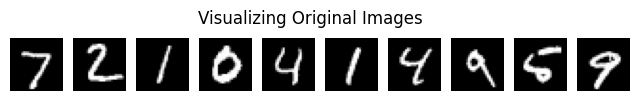

Visualizing reconstructions for fold 1


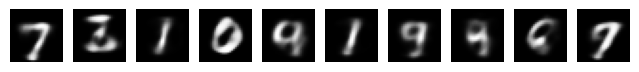

Visualizing reconstructions for fold 2


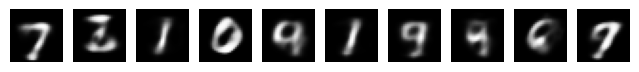

Visualizing reconstructions for fold 3


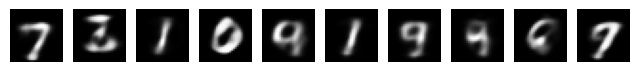

Visualizing reconstructions for fold 4


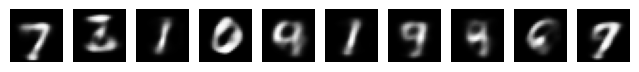

Visualizing reconstructions for fold 5


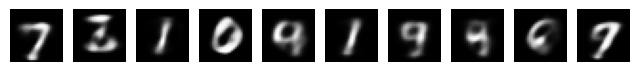

Visualizing reconstructions for fold 6


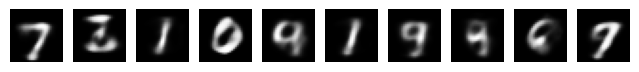

Visualizing reconstructions for fold 7


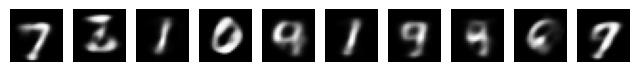

Visualizing reconstructions for fold 8


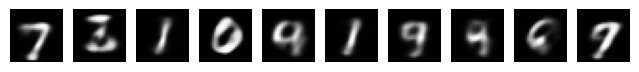

Visualizing reconstructions for fold 9


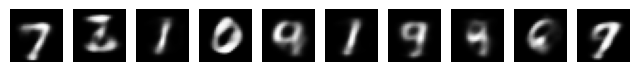

Visualizing reconstructions for fold 10


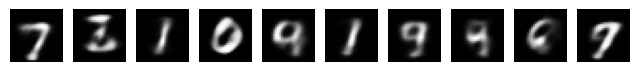

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_2_2):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

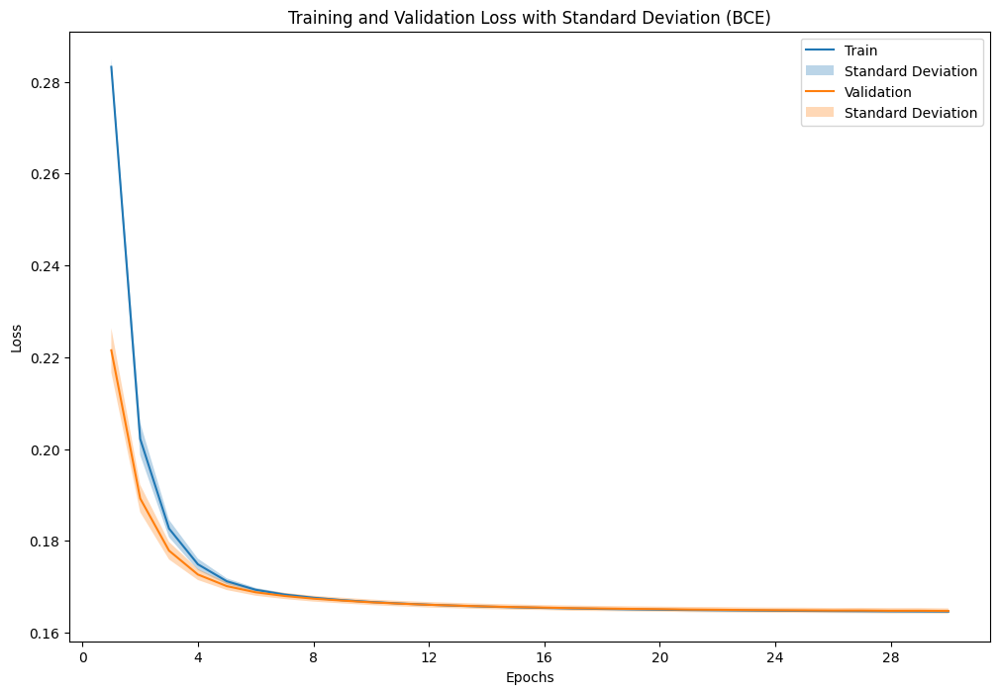

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_2_2_1 = AE_plot_results(fold_results_2_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_2_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_2_1['epochs'])
plot_mean_std(result_data_2_2_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_2_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_2_1['valid_result'], result_data_2_2_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.164717   0.163044
1  Standard Deviation         0.000559   0.000060

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.164929,0.163161
1,2,0.164428,0.163125
2,3,0.165239,0.163013
3,4,0.164425,0.162960
4,5,0.164922,0.163024
5,6,0.165155,0.162981
6,7,0.164841,0.163046
7,8,0.165567,0.162997
8,9,0.164047,0.163076
9,10,0.163614,0.163054


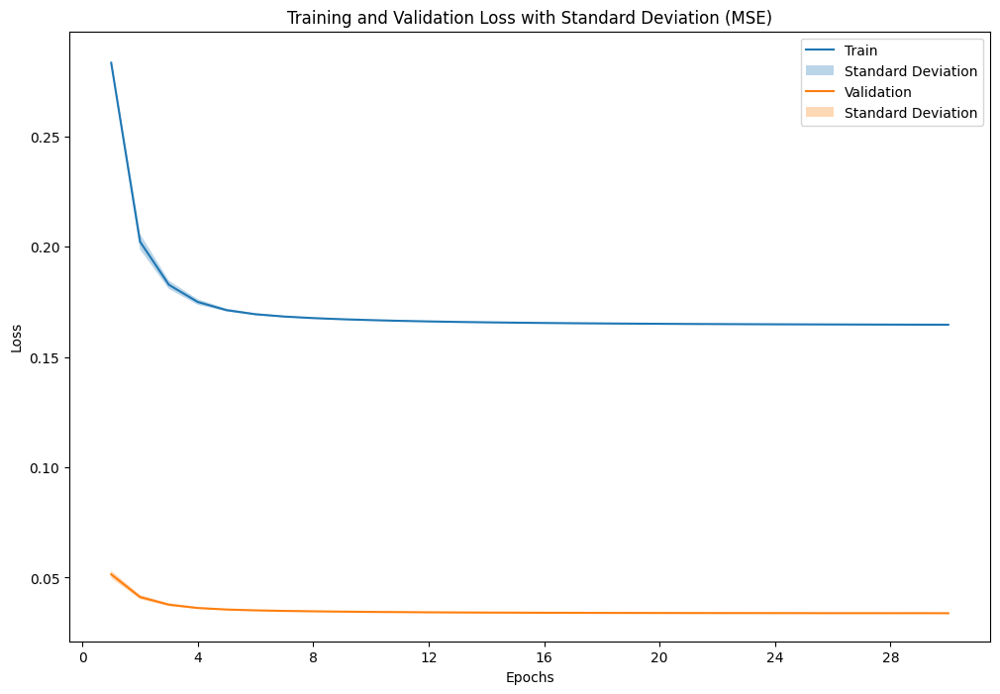

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_2_2_2 = AE_plot_results(fold_results_2_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_2_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_2_2['epochs'])
plot_mean_std(result_data_2_2_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_2_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_2_2['valid_result'], result_data_2_2_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.033876   0.033372
1  Standard Deviation         0.000143   0.000016

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.033871,0.033380
1,2,0.033789,0.033392
2,3,0.034035,0.033343
3,4,0.033826,0.033368
4,5,0.033981,0.033366
5,6,0.033934,0.033360
6,7,0.033948,0.033384
7,8,0.034059,0.033353
8,9,0.033766,0.033382
9,10,0.033554,0.033394


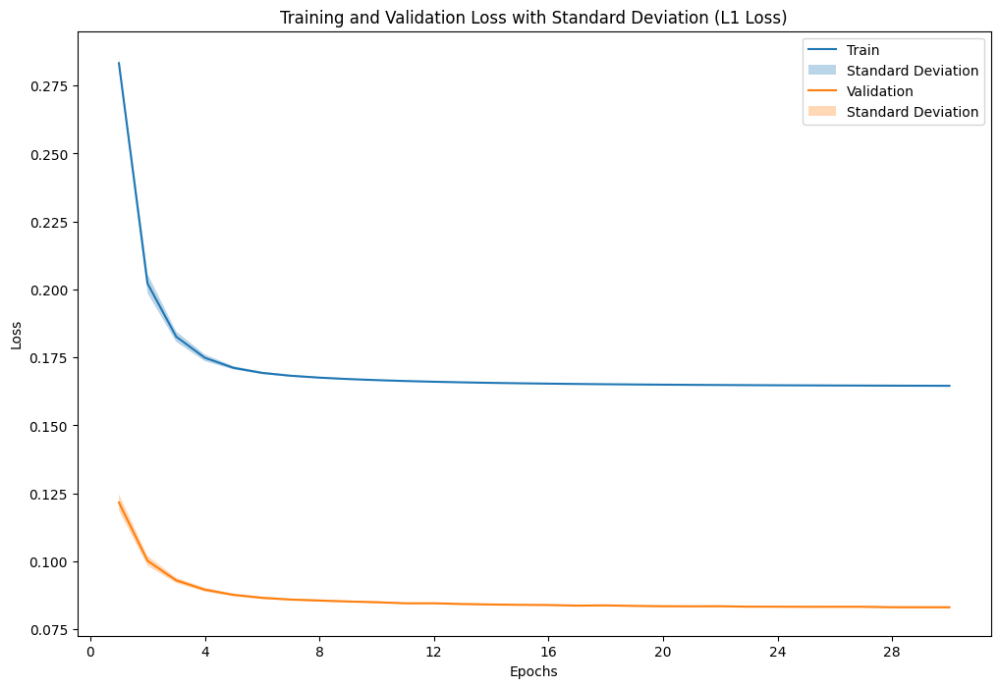

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_2_2_3 = AE_plot_results(fold_results_2_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_2_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_2_3['epochs'])
plot_mean_std(result_data_2_2_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_2_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_2_3['valid_result'], result_data_2_2_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.083123   0.082306
1  Standard Deviation         0.000346   0.000187

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.083316,0.082497
1,2,0.082879,0.082258
2,3,0.083366,0.082332
3,4,0.083003,0.082273
4,5,0.083628,0.082566
5,6,0.083088,0.082142
6,7,0.083514,0.082566
7,8,0.083276,0.082148
8,9,0.082549,0.081955
9,10,0.082612,0.082320


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_2_2 = sum(p.numel() for p in models_2_2[0].parameters())
print(f"Number of parameters in the model: {total_params_2_2}")

Number of parameters in the model: 13336


### Experiment 2.3: AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=16, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_2_3 = 'AE'
model_config_2_3 = {'D_x': 784, 'n_layers': 1, 'D_z': 16, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_2_3, fold_results_2_3 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_2_3),
                                                model_config=model_config_2_3,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=16, bias=True)]
[Linear(in_features=16, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.234963
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.03550998711998158, 'L1 Loss': 0.08960225433111191, 'BCE': 0.17424962542792585}
Train Fold/Epoch: 1/2, Training Loss: 0.158227
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.026727382509790835, 'L1 Loss': 0.07129982343696534, 'BCE': 0.1466903141204347}
Train Fold/Epoch: 1/3, Training Loss: 0.140225
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.02356288374025137, 'L1 Loss': 0.06440408393106561, 'BCE': 0.1360691505226683}
Train Fold/Epoch: 1/4, Training Loss: 0.133274
Validation Fold/Epoch: 1/4, Validation AE Loss: {'MSE': 0.02248497759091093, 'L1 Loss': 0.060916773420065004, 'BCE': 0.13195276728

### Visualizing reconstructions for all fold

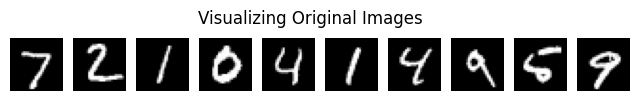

Visualizing reconstructions for fold 1


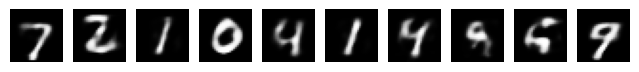

Visualizing reconstructions for fold 2


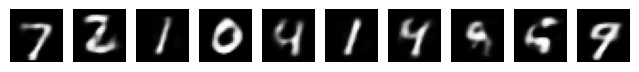

Visualizing reconstructions for fold 3


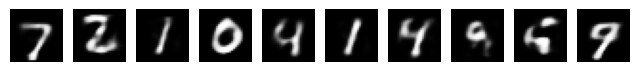

Visualizing reconstructions for fold 4


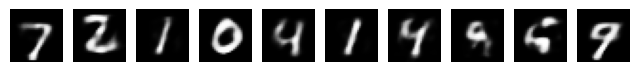

Visualizing reconstructions for fold 5


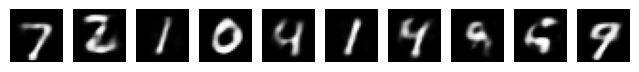

Visualizing reconstructions for fold 6


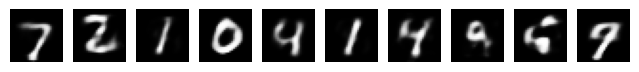

Visualizing reconstructions for fold 7


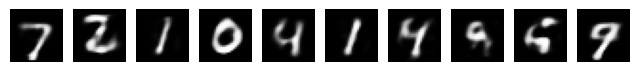

Visualizing reconstructions for fold 8


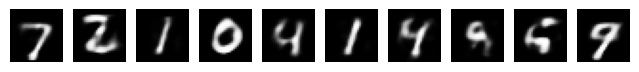

Visualizing reconstructions for fold 9


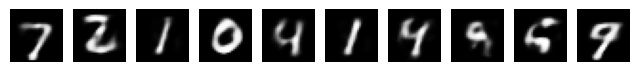

Visualizing reconstructions for fold 10


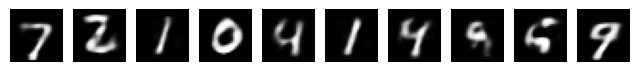

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_2_3):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

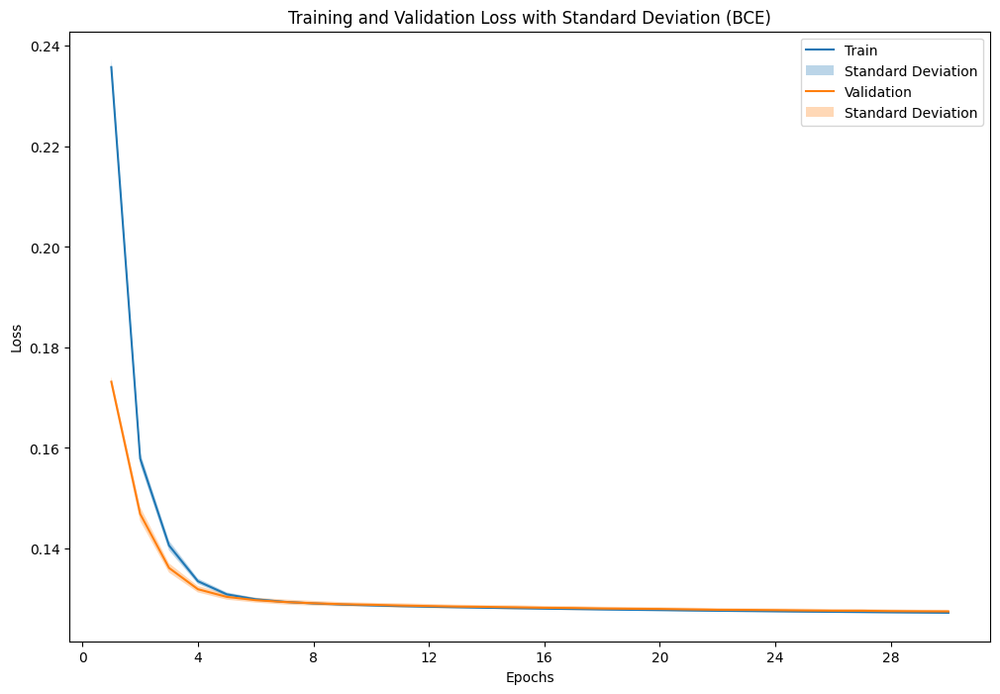

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_2_3_1 = AE_plot_results(fold_results_2_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_3_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_3_1['epochs'])
plot_mean_std(result_data_2_3_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_3_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_3_1['valid_result'], result_data_2_3_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.127461   0.125537
1  Standard Deviation         0.000322   0.000154

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.127760,0.125715
1,2,0.127447,0.125708
2,3,0.127467,0.125315
3,4,0.127383,0.125605
4,5,0.127880,0.125580
5,6,0.127435,0.125216
6,7,0.127428,0.125476
7,8,0.127928,0.125531
8,9,0.127000,0.125642
9,10,0.126881,0.125580


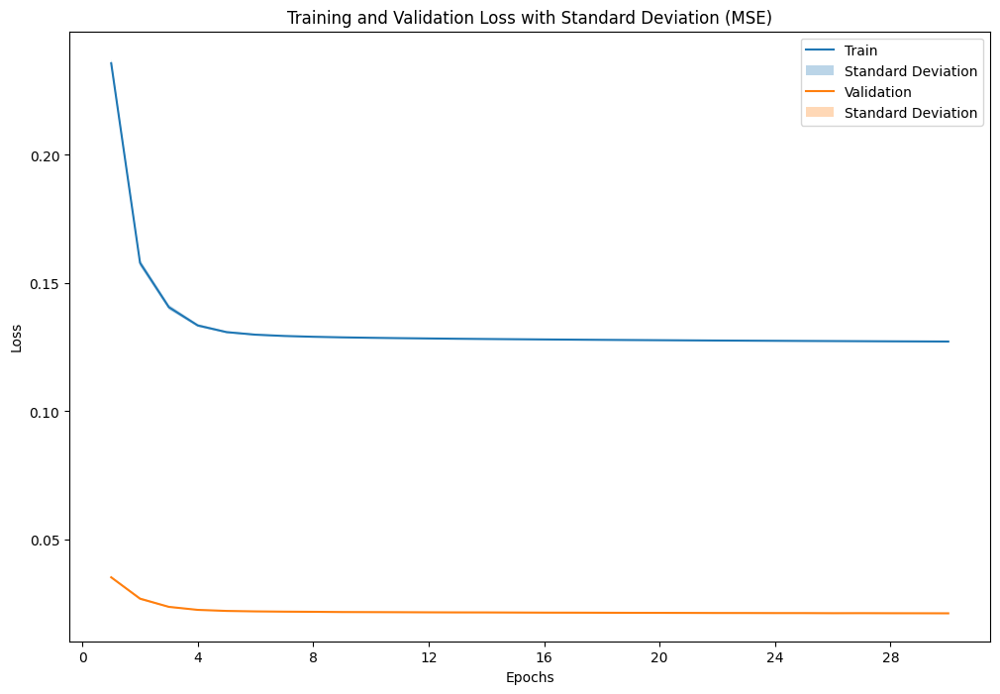

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_2_3_2 = AE_plot_results(fold_results_2_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_3_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_3_2['epochs'])
plot_mean_std(result_data_2_3_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_3_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_3_2['valid_result'], result_data_2_3_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.021168   0.020582
1  Standard Deviation         0.000086   0.000049

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.021225,0.020632
1,2,0.021215,0.020635
2,3,0.021181,0.020513
3,4,0.021135,0.020601
4,5,0.021351,0.020617
5,6,0.021047,0.020482
6,7,0.021185,0.020572
7,8,0.021190,0.020554
8,9,0.021102,0.020604
9,10,0.021050,0.020606


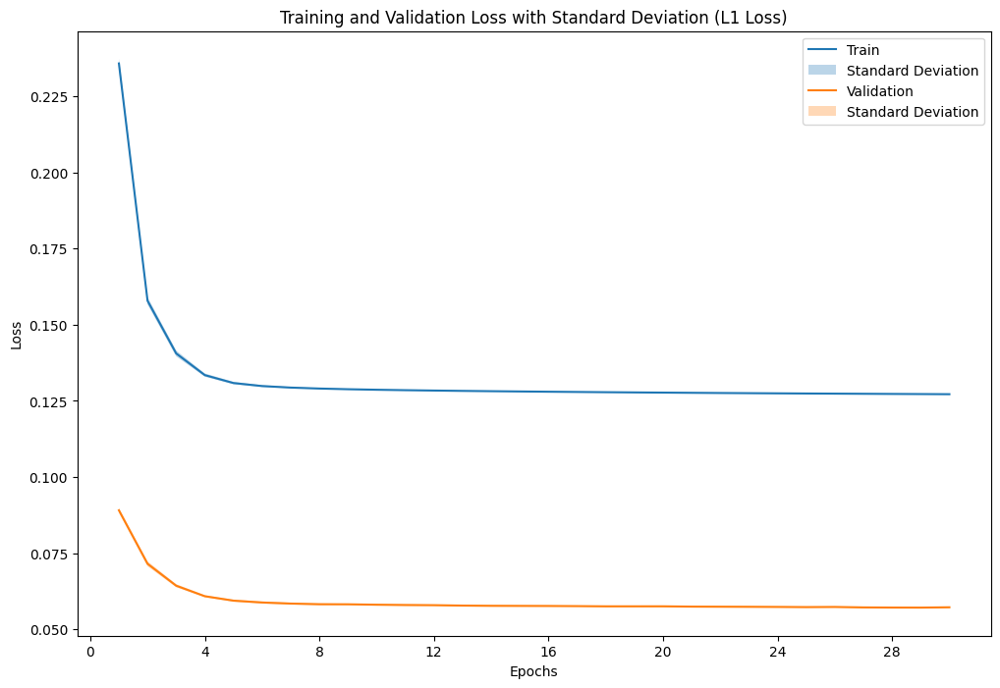

In [ ]:
loss_type_to_plot = 'L1 Loss'  # We can change this to our desired loss type
result_data_2_3_3 = AE_plot_results(fold_results_2_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_3_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_3_3['epochs'])
plot_mean_std(result_data_2_3_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_3_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_3_3['valid_result'], result_data_2_3_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.057238   0.056193
1  Standard Deviation         0.000143   0.000150

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.057470,0.056429
1,2,0.057196,0.056258
2,3,0.057269,0.056076
3,4,0.057284,0.056302
4,5,0.057293,0.055970
5,6,0.057106,0.056048
6,7,0.057127,0.056037
7,8,0.057394,0.056255
8,9,0.057295,0.056395
9,10,0.056945,0.056165


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_2_3 = sum(p.numel() for p in models_2_3[0].parameters())
print(f"Number of parameters in the model: {total_params_2_3}")

Number of parameters in the model: 25888


### Experiment 2.4: AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=32, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_2_4 = 'AE'
model_config_2_4 = {'D_x': 784, 'n_layers': 1, 'D_z': 32, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_2_4, fold_results_2_4 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_2_4),
                                                model_config=model_config_2_4,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=32, bias=True)]
[Linear(in_features=32, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.198060
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.02364907122435088, 'L1 Loss': 0.06719254801406506, 'BCE': 0.13822838489679581}
Train Fold/Epoch: 1/2, Training Loss: 0.121981
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.01496160644641582, 'L1 Loss': 0.047758803762336995, 'BCE': 0.1104499490020123}
Train Fold/Epoch: 1/3, Training Loss: 0.103236
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.01170900863337707, 'L1 Loss': 0.0386814442562296, 'BCE': 0.099103977230001}
Train Fold/Epoch: 1/4, Training Loss: 0.096872
Validation Fold/Epoch: 1/4, Validation AE Loss: {'MSE': 0.010871134391252665, 'L1 Loss': 0.0358109425436309, 'BCE': 0.09609663898640

### Visualizing reconstructions for all fold

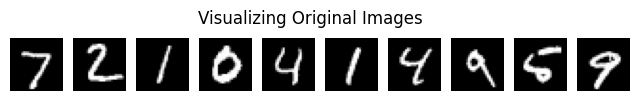

Visualizing reconstructions for fold 1


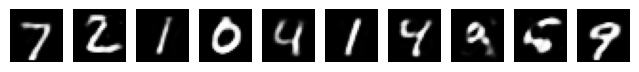

Visualizing reconstructions for fold 2


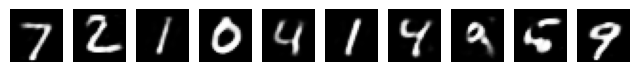

Visualizing reconstructions for fold 3


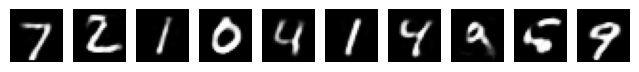

Visualizing reconstructions for fold 4


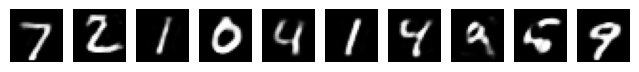

Visualizing reconstructions for fold 5


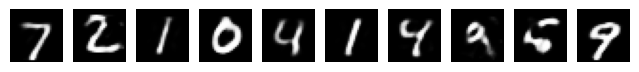

Visualizing reconstructions for fold 6


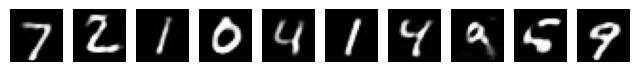

Visualizing reconstructions for fold 7


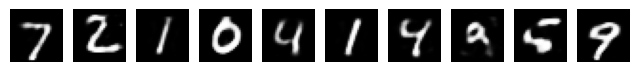

Visualizing reconstructions for fold 8


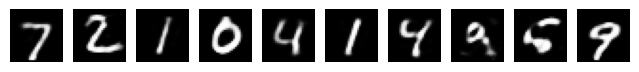

Visualizing reconstructions for fold 9


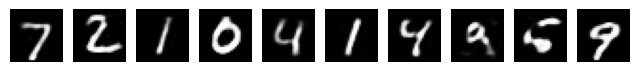

Visualizing reconstructions for fold 10


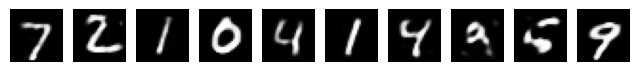

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_2_4):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

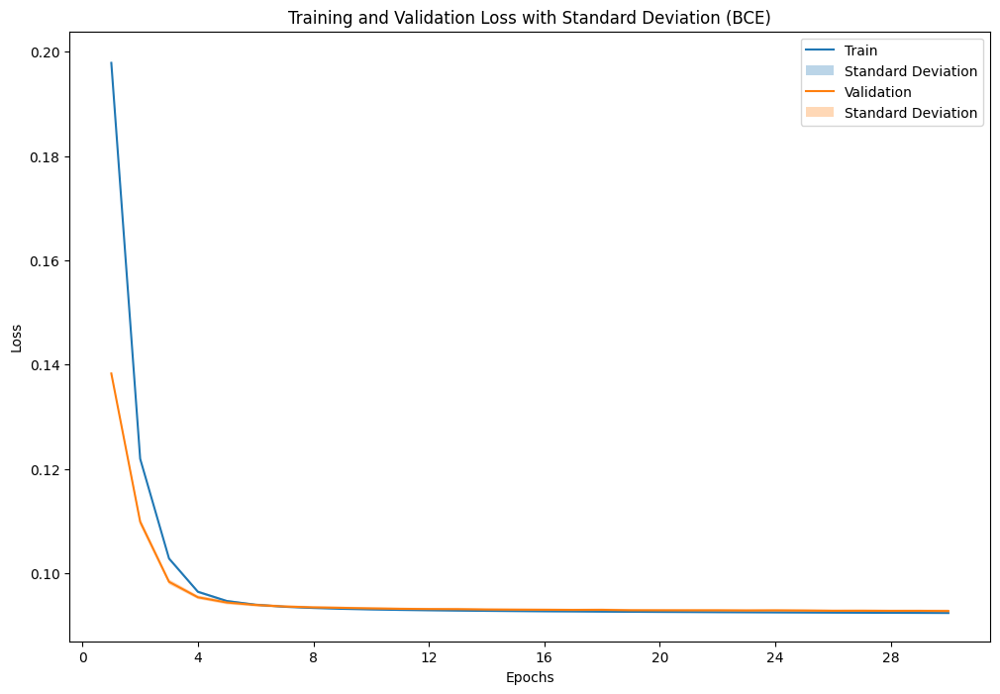

In [ ]:
loss_type_to_plot = 'BCE'  # We can change this to our desired loss type
result_data_2_4_1 = AE_plot_results(fold_results_2_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_4_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_4_1['epochs'])
plot_mean_std(result_data_2_4_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_4_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_4_1['valid_result'], result_data_2_4_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.092783   0.091194
1  Standard Deviation         0.000279   0.000111

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.092980,0.091204
1,2,0.092536,0.091014
2,3,0.092824,0.091205
3,4,0.092690,0.091198
4,5,0.092882,0.091172
5,6,0.093089,0.091189
6,7,0.092934,0.091473
7,8,0.093189,0.091194
8,9,0.092424,0.091204
9,10,0.092286,0.091089


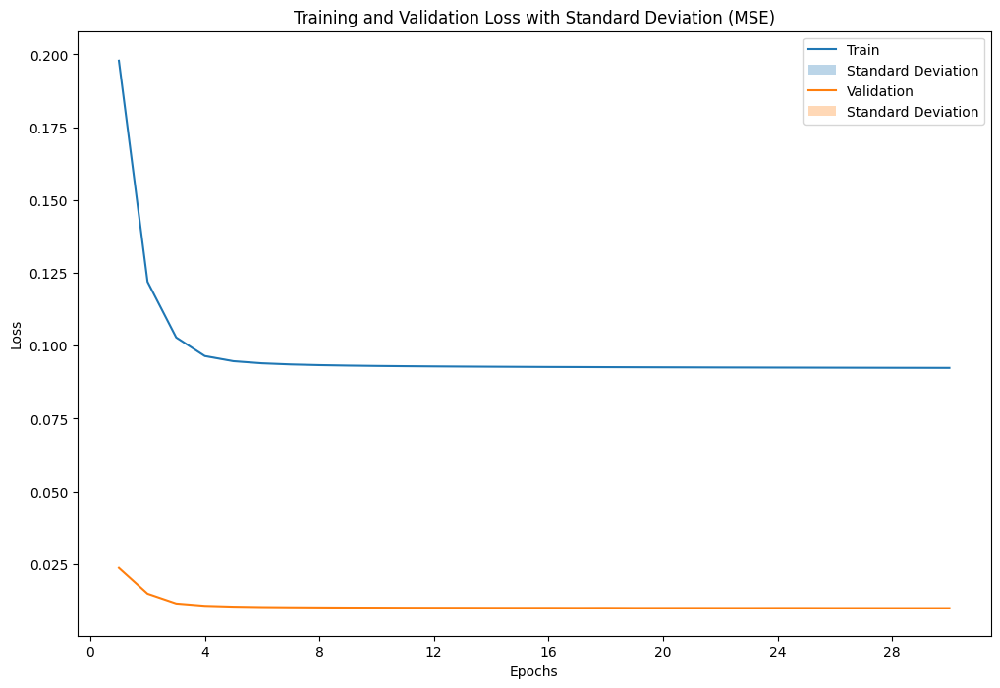

In [ ]:
loss_type_to_plot = 'MSE'  # We can change this to our desired loss type
result_data_2_4_2 = AE_plot_results(fold_results_2_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_4_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_4_2['epochs'])
plot_mean_std(result_data_2_4_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_4_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_4_2['valid_result'], result_data_2_4_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.009935   0.009508
1  Standard Deviation         0.000054   0.000047

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.009988,0.009520
1,2,0.009866,0.009432
2,3,0.009970,0.009542
3,4,0.009877,0.009472
4,5,0.009966,0.009488
5,6,0.009942,0.009520
6,7,0.010001,0.009609
7,8,0.009968,0.009513
8,9,0.009943,0.009528
9,10,0.009832,0.009460


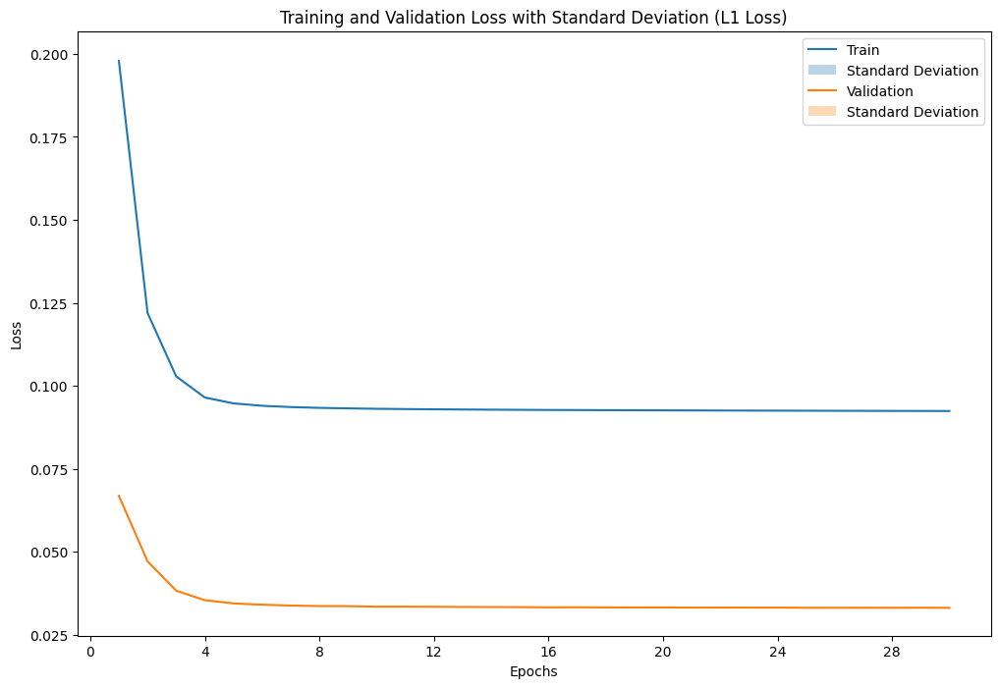

In [ ]:
loss_type_to_plot = 'L1 Loss'  # We can change this to our desired loss type
result_data_2_4_3 = AE_plot_results(fold_results_2_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_4_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_4_3['epochs'])
plot_mean_std(result_data_2_4_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_4_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_4_3['valid_result'], result_data_2_4_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.033112   0.032252
1  Standard Deviation         0.000107   0.000079

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.033256,0.032308
1,2,0.033026,0.032207
2,3,0.032988,0.032110
3,4,0.033201,0.032375
4,5,0.033223,0.032240
5,6,0.033081,0.032171
6,7,0.033128,0.032339
7,8,0.033227,0.032311
8,9,0.033052,0.032268
9,10,0.032933,0.032194


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_2_4 = sum(p.numel() for p in models_2_4[0].parameters())
print(f"Number of parameters in the model: {total_params_2_4}")

Number of parameters in the model: 50992


### Experiment 2.5: AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=64, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_2_5 = 'AE'
model_config_2_5 = {'D_x': 784, 'n_layers': 1, 'D_z': 64, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_2_5, fold_results_2_5 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_2_5),
                                                model_config=model_config_2_5,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=64, bias=True)]
[Linear(in_features=64, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.171372
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.016023539819140384, 'L1 Loss': 0.05159549565708384, 'BCE': 0.11464685066900354}
Train Fold/Epoch: 1/2, Training Loss: 0.097677
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.007557690549800371, 'L1 Loss': 0.030379400073372302, 'BCE': 0.0864217813186189}
Train Fold/Epoch: 1/3, Training Loss: 0.081408
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.0054407908898243245, 'L1 Loss': 0.023665622966562178, 'BCE': 0.07885888004873662}
Train Fold/Epoch: 1/4, Training Loss: 0.077014
Validation Fold/Epoch: 1/4, Validation AE Loss: {'MSE': 0.004732820661144054, 'L1 Loss': 0.02126103330482828, 'BCE': 0.07627

### Visualizing reconstructions for all fold

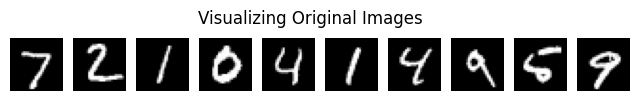

Visualizing reconstructions for fold 1


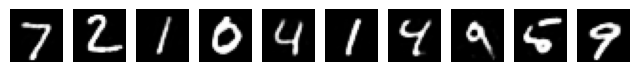

Visualizing reconstructions for fold 2


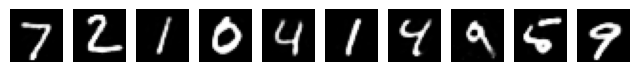

Visualizing reconstructions for fold 3


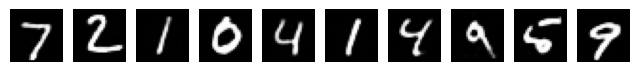

Visualizing reconstructions for fold 4


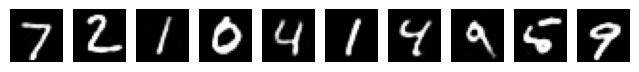

Visualizing reconstructions for fold 5


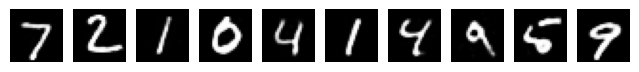

Visualizing reconstructions for fold 6


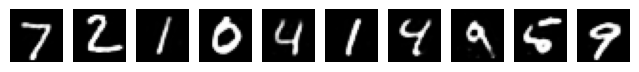

Visualizing reconstructions for fold 7


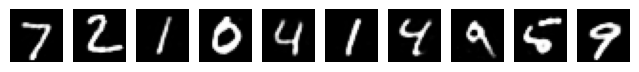

Visualizing reconstructions for fold 8


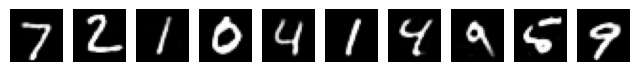

Visualizing reconstructions for fold 9


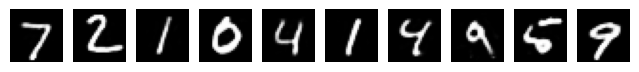

Visualizing reconstructions for fold 10


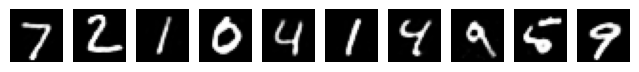

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_2_5):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

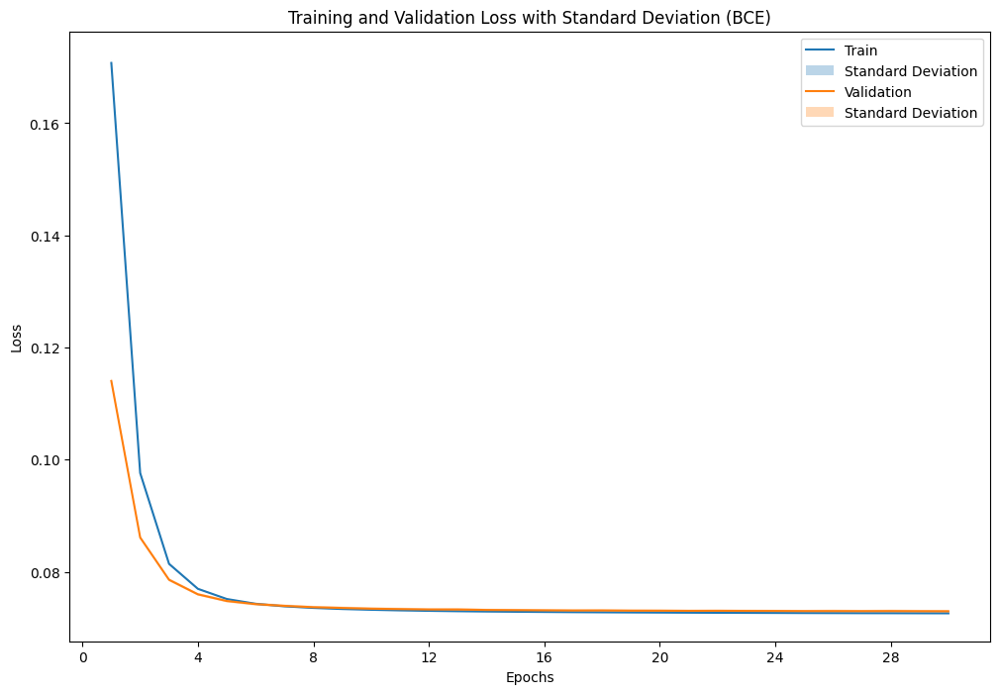

In [ ]:
loss_type_to_plot = 'BCE'  # We can change this to our desired loss type
result_data_2_5_1 = AE_plot_results(fold_results_2_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_5_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_5_1['epochs'])
plot_mean_std(result_data_2_5_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_5_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_5_1['valid_result'], result_data_2_5_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.072957   0.072091
1  Standard Deviation         0.000222   0.000031

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.073162,0.072090
1,2,0.072826,0.072086
2,3,0.072956,0.072076
3,4,0.072837,0.072025
4,5,0.073038,0.072085
5,6,0.073211,0.072075
6,7,0.072855,0.072121
7,8,0.073362,0.072114
8,9,0.072665,0.072147
9,10,0.072659,0.072087


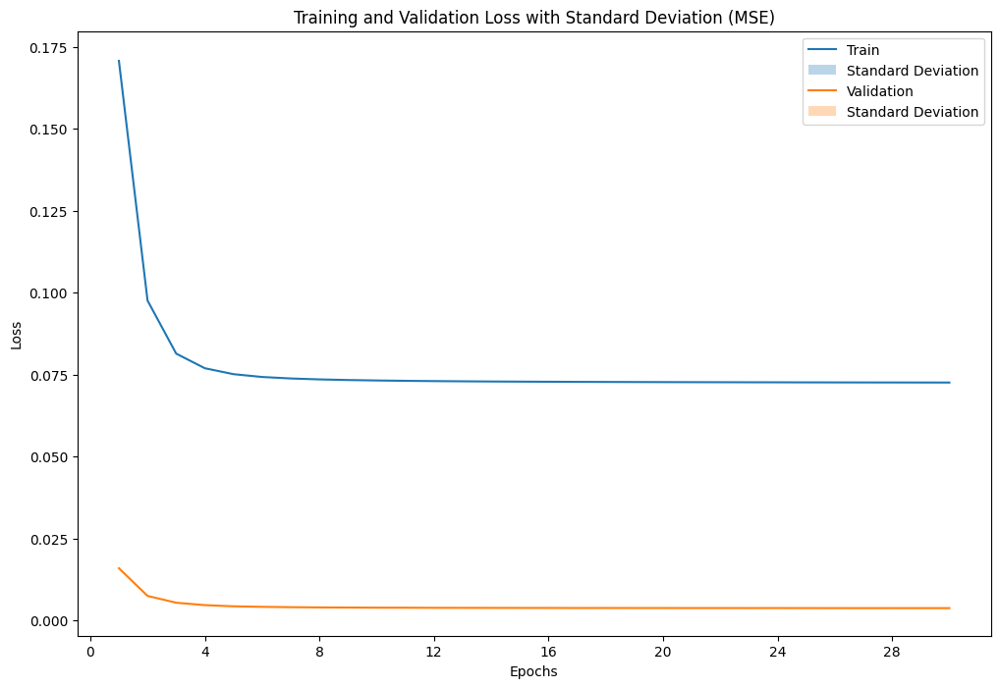

In [ ]:
loss_type_to_plot = 'MSE'  # We can change this to our desired loss type
result_data_2_5_2 = AE_plot_results(fold_results_2_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_5_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_5_2['epochs'])
plot_mean_std(result_data_2_5_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_5_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_5_2['valid_result'], result_data_2_5_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.003747   0.003581
1  Standard Deviation         0.000026   0.000011

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.003770,0.003581
1,2,0.003726,0.003569
2,3,0.003751,0.003584
3,4,0.003716,0.003559
4,5,0.003787,0.003587
5,6,0.003731,0.003571
6,7,0.003730,0.003588
7,8,0.003782,0.003587
8,9,0.003763,0.003599
9,10,0.003711,0.003583


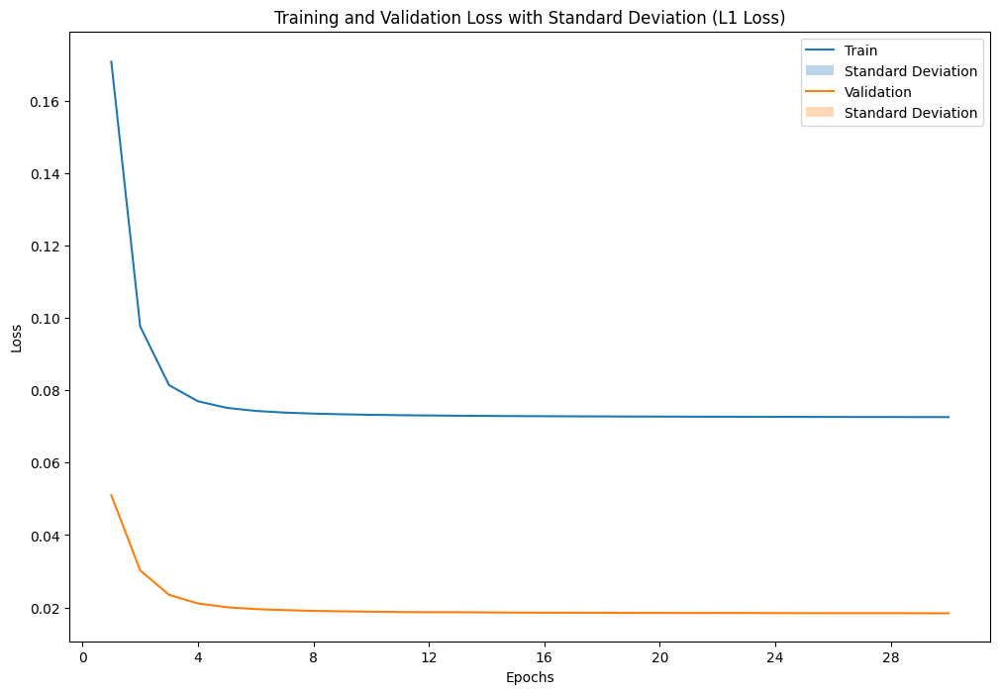

In [ ]:
loss_type_to_plot = 'L1 Loss'  # We can change this to our desired loss type
result_data_2_5_3 = AE_plot_results(fold_results_2_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_5_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_5_3['epochs'])
plot_mean_std(result_data_2_5_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_5_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_5_3['valid_result'], result_data_2_5_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.018405   0.017943
1  Standard Deviation         0.000068   0.000040

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.018510,0.017962
1,2,0.018378,0.017961
2,3,0.018362,0.017887
3,4,0.018301,0.017872
4,5,0.018465,0.017937
5,6,0.018379,0.017909
6,7,0.018417,0.017997
7,8,0.018511,0.017945
8,9,0.018408,0.017992
9,10,0.018323,0.017970


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_2_5 = sum(p.numel() for p in models_2_5[0].parameters())
print(f"Number of parameters in the model: {total_params_2_5}")

Number of parameters in the model: 101200


### Experiments with MNIST: Autoencoder

### Experiments 2 : AE with n_layers =2

- We evaluate the performance of both the autoencoder and the variational autoencoder by systematically varying the latent space dimensionality (Dz) across different values, specifically {2,16, 32}. Additionally, for this assessment, we set the number of layers (n_layer) to be equal to 2, considering likelihoods modeled as Gaussian and Bernoulli.

## Test 1 AE: MSE

### Experiment 2.1 : AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=2, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_1_6 = 'AE'
model_config_1_6 = {'D_x': 784, 'n_layers': 2, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_1_6, fold_results_1_6 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_1_6),
                                                model_config=model_config_1_6,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=393, bias=True), ReLU(), Linear(in_features=393, out_features=2, bias=True)]
[Linear(in_features=2, out_features=393, bias=True), ReLU(), Linear(in_features=393, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.054295
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.048942026266075196, 'L1 Loss': 0.1147148829508335, 'BCE': 0.21510586935154935}
Train Fold/Epoch: 1/2, Training Loss: 0.047399
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.04701699677141423, 'L1 Loss': 0.10872726570418541, 'BCE': 0.2118487169450902}
Train Fold/Epoch: 1/3, Training Loss: 0.045512
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.04530761275995285, 'L1 Loss': 0.10565399735214863, 'BCE': 0.20774537166382404}
Train Fold/Epoch: 1/4, Training Loss: 0.044484
Validati

### Visualizing reconstructions for all fold

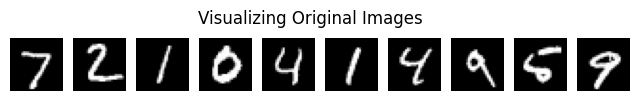

Visualizing reconstructions for fold 1


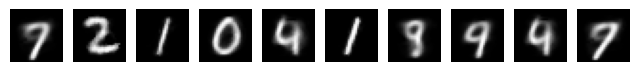

Visualizing reconstructions for fold 2


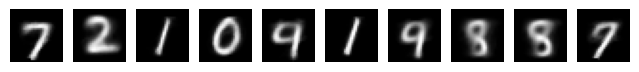

Visualizing reconstructions for fold 3


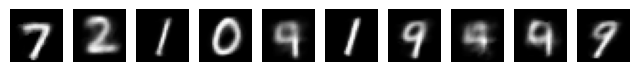

Visualizing reconstructions for fold 4


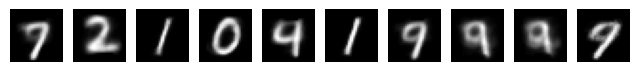

Visualizing reconstructions for fold 5


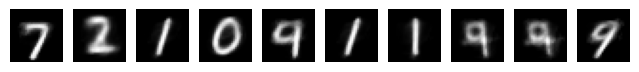

Visualizing reconstructions for fold 6


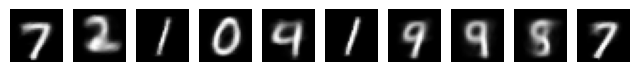

Visualizing reconstructions for fold 7


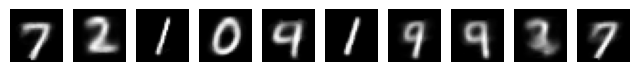

Visualizing reconstructions for fold 8


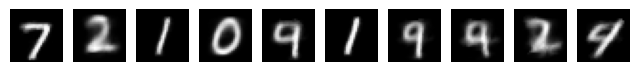

Visualizing reconstructions for fold 9


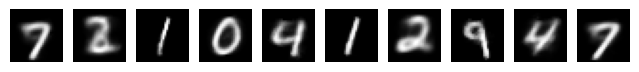

Visualizing reconstructions for fold 10


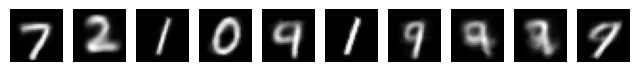

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_1_6):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

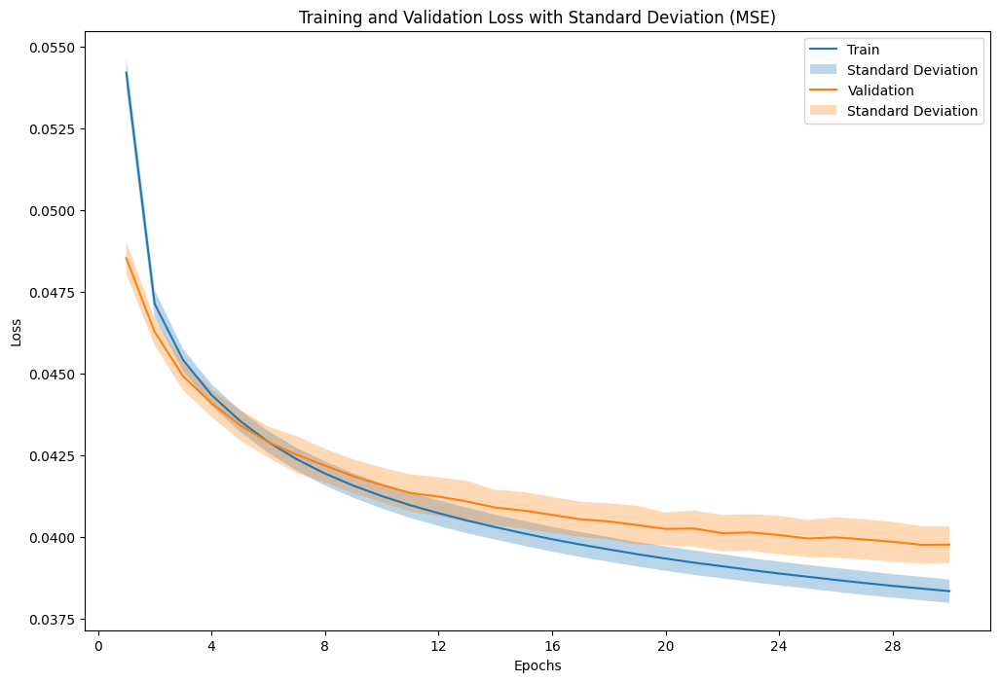

In [ ]:
loss_type_to_plot = 'MSE'  # We can change this to our desired loss type
result_data_1_6_1 = AE_plot_results(fold_results_1_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_6_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_6_1['epochs'])
plot_mean_std(result_data_1_6_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_6_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_6_1['valid_result'], result_data_1_6_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.039761   0.039597
1  Standard Deviation         0.000556   0.000405

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.040503,0.040351
1,2,0.040037,0.039703
2,3,0.040573,0.039945
3,4,0.039425,0.039449
4,5,0.039941,0.039884
5,6,0.039557,0.039571
6,7,0.038960,0.038927
7,8,0.040056,0.039336
8,9,0.039746,0.039751
9,10,0.038816,0.039053


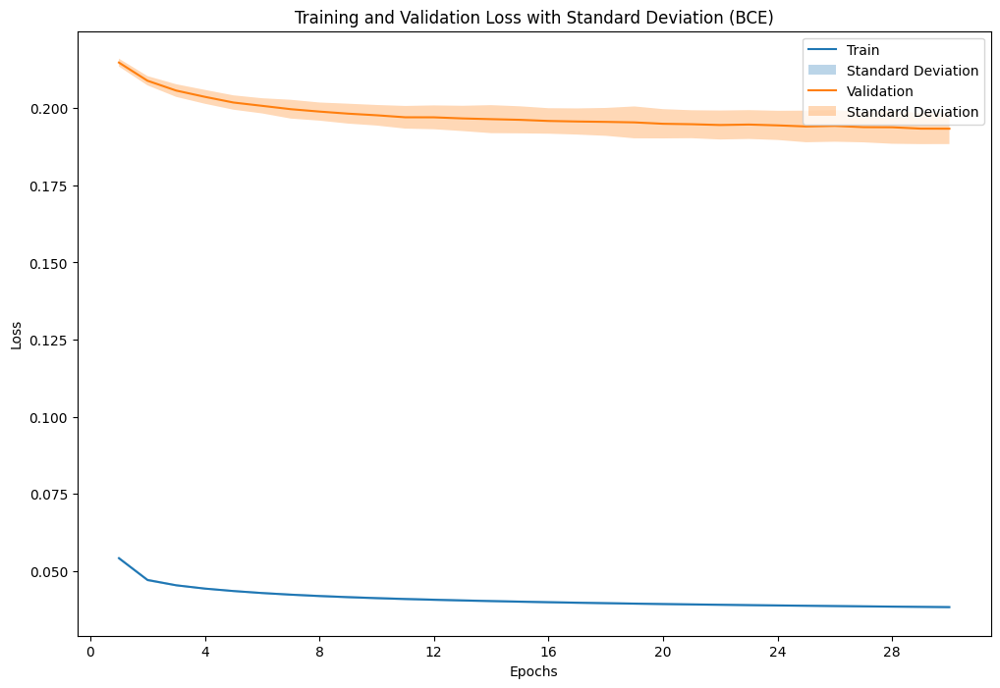

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_1_6_2 = AE_plot_results(fold_results_1_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_6_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_6_2['epochs'])
plot_mean_std(result_data_1_6_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_6_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_6_2['valid_result'], result_data_1_6_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.193359   0.191210
1  Standard Deviation         0.004977   0.004122

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.206783,0.202739
1,2,0.192945,0.189981
2,3,0.196078,0.193323
3,4,0.190484,0.189090
4,5,0.193048,0.191324
5,6,0.191523,0.189241
6,7,0.189878,0.188016
7,8,0.194318,0.189919
8,9,0.188340,0.188016
9,10,0.190194,0.190447


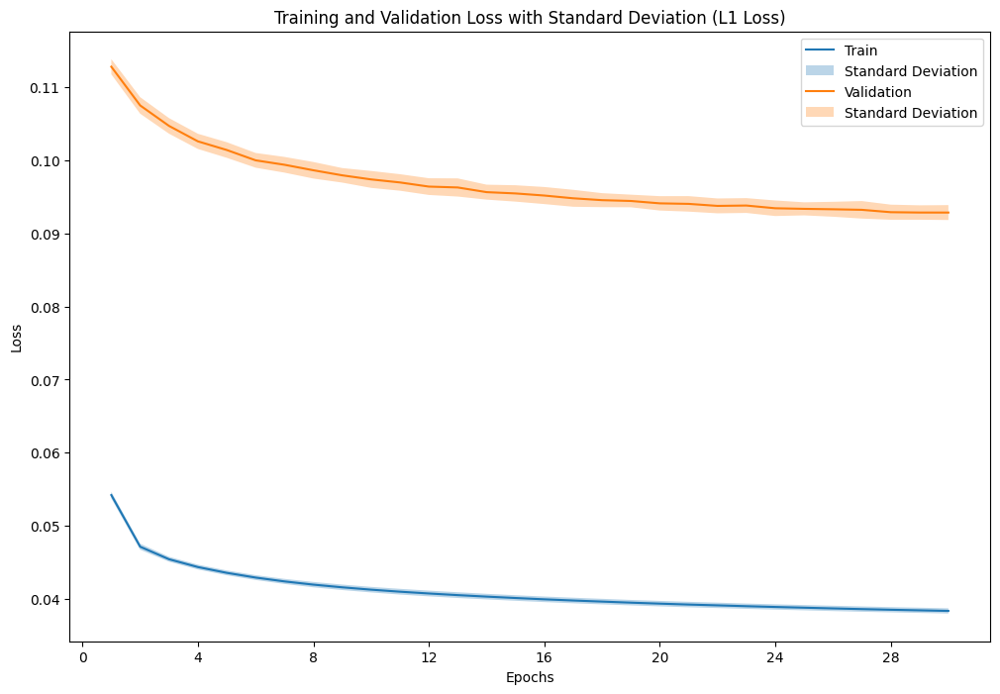

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_1_6_3 = AE_plot_results(fold_results_1_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_6_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_6_3['epochs'])
plot_mean_std(result_data_1_6_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_6_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_6_3['valid_result'], result_data_1_6_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.092869   0.092813
1  Standard Deviation         0.001021   0.000862

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.094236,0.094121
1,2,0.093913,0.093653
2,3,0.094039,0.093548
3,4,0.092253,0.092437
4,5,0.093153,0.093270
5,6,0.092638,0.092906
6,7,0.091740,0.091671
7,8,0.093074,0.092065
8,9,0.092840,0.093121
9,10,0.090805,0.091342


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_1_6 = sum(p.numel() for p in models_1_6[0].parameters())
print(f"Number of parameters in the model: {total_params_1_6}")

Number of parameters in the model: 619368


### Latente Space for each fold

<ipython-input-12-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


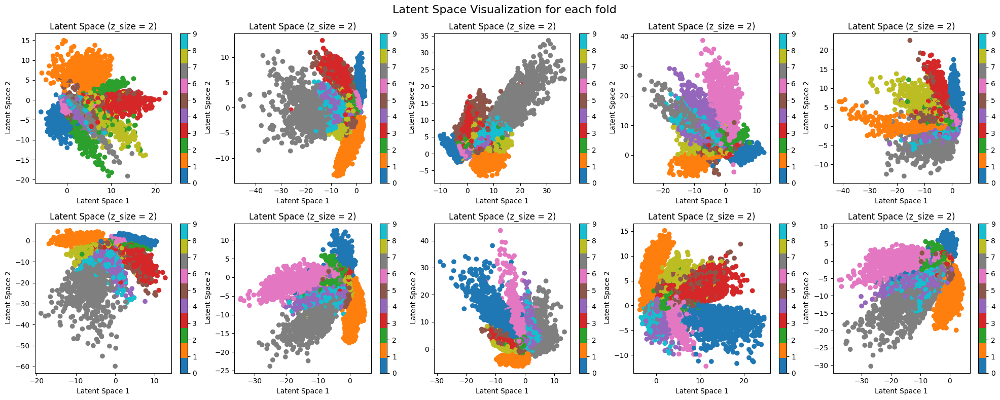

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))
fig.suptitle('Latent Space Visualization for each fold', fontsize=16)

# Flatten the 2D array of subplots
axes = axes.flatten()

for i, model in enumerate(models_1_6):
    latent_space_AE_model(model, test_loader, device, ax=axes[i])

# plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


<ipython-input-12-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


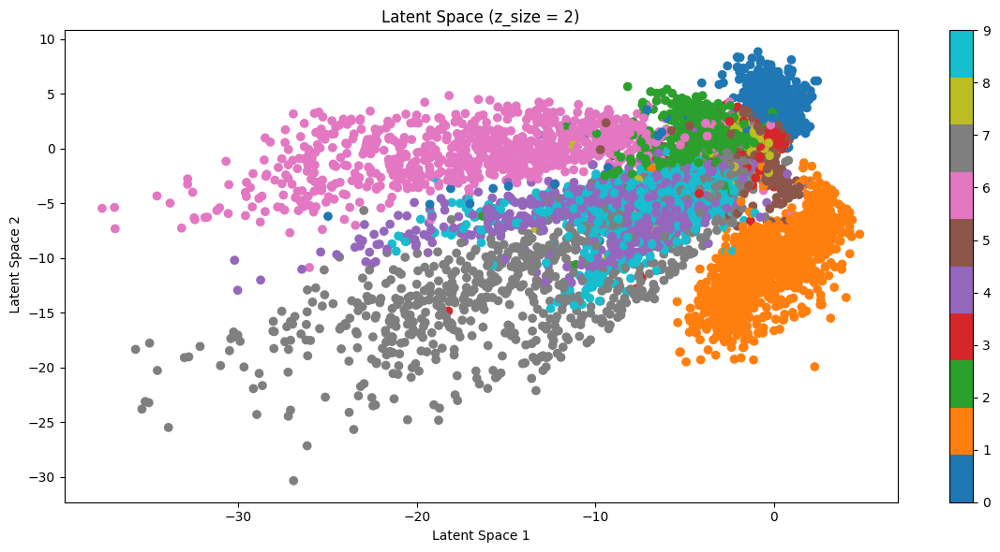

In [ ]:
latent_space_AE_model(models_1_6[9], test_loader, device)
# print(type(models_1_4[9]))

### Experiment 2.1 : AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=2, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_8_6 = 'AE'
model_config_8_6 = {'D_x': 784, 'n_layers': 2, 'D_z': 8, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_8_6, fold_results_8_6 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_8_6),
                                                model_config=model_config_8_6,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=396, bias=True), ReLU(), Linear(in_features=396, out_features=8, bias=True)]
[Linear(in_features=8, out_features=396, bias=True), ReLU(), Linear(in_features=396, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.034014
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.024503148715705313, 'L1 Loss': 0.06483840668930653, 'BCE': 0.13927605494539788}
Train Fold/Epoch: 1/2, Training Loss: 0.022872
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.021781100812269017, 'L1 Loss': 0.058718500341823764, 'BCE': 0.13116666278306474}
Train Fold/Epoch: 1/3, Training Loss: 0.021013
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.020617294660274017, 'L1 Loss': 0.05584992805218443, 'BCE': 0.12763297684649202}
Train Fold/Epoch: 1/4, Training Loss: 0.019949
Val

### Visualizing reconstructions for all fold

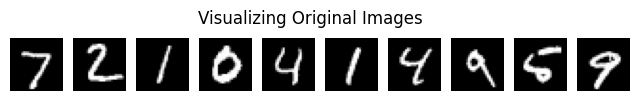

Visualizing reconstructions for fold 1


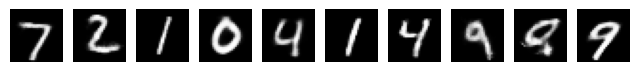

Visualizing reconstructions for fold 2


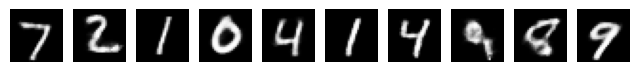

Visualizing reconstructions for fold 3


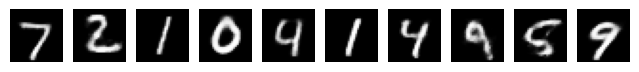

Visualizing reconstructions for fold 4


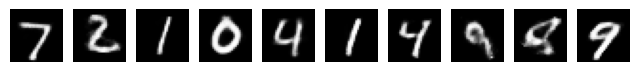

Visualizing reconstructions for fold 5


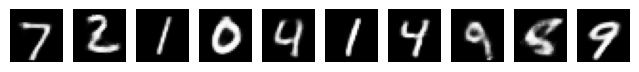

Visualizing reconstructions for fold 6


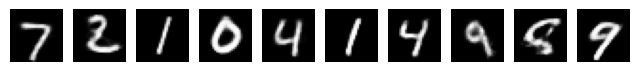

Visualizing reconstructions for fold 7


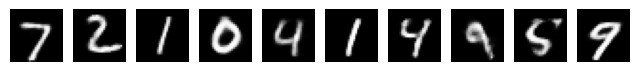

Visualizing reconstructions for fold 8


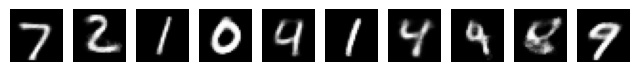

Visualizing reconstructions for fold 9


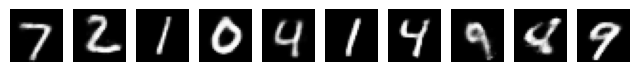

Visualizing reconstructions for fold 10


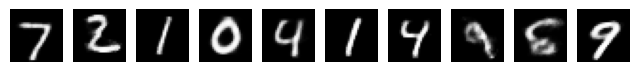

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_8_6):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

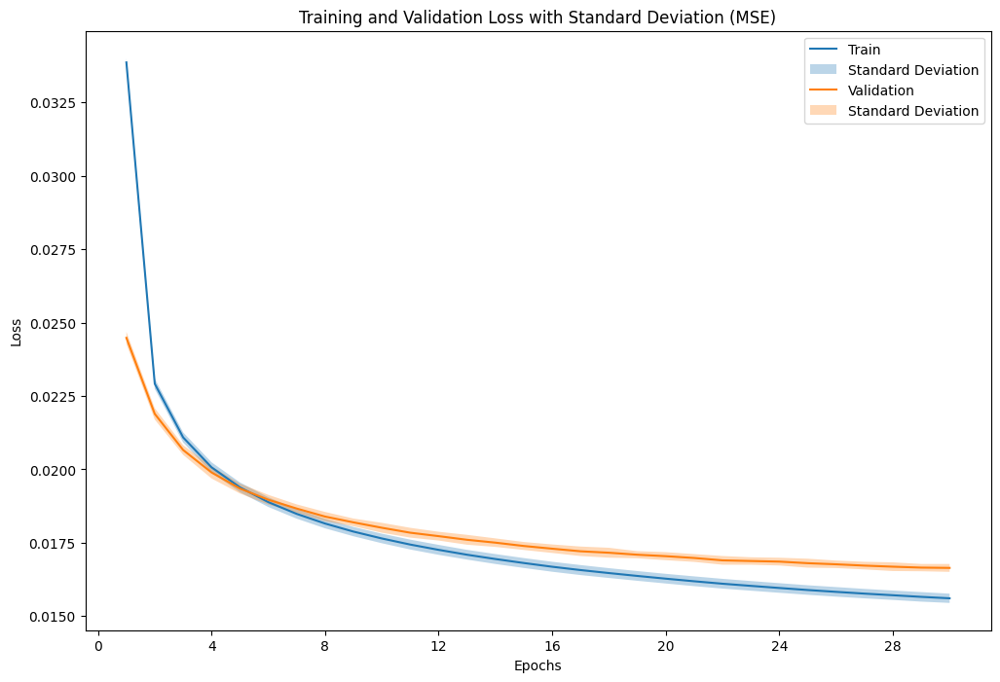

In [ ]:
loss_type_to_plot = 'MSE'  # We can change this to our desired loss type
result_data_8_6_1 = AE_plot_results(fold_results_8_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_8_6_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_8_6_1['epochs'])
plot_mean_std(result_data_8_6_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_8_6_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_8_6_1['valid_result'], result_data_8_6_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.016645   0.016380
1  Standard Deviation         0.000134   0.000164

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.016468,0.016199
1,2,0.016643,0.016347
2,3,0.016714,0.016372
3,4,0.016506,0.016306
4,5,0.016574,0.016348
5,6,0.016704,0.016478
6,7,0.016955,0.016720
7,8,0.016673,0.016164
8,9,0.016519,0.016277
9,10,0.016692,0.016594


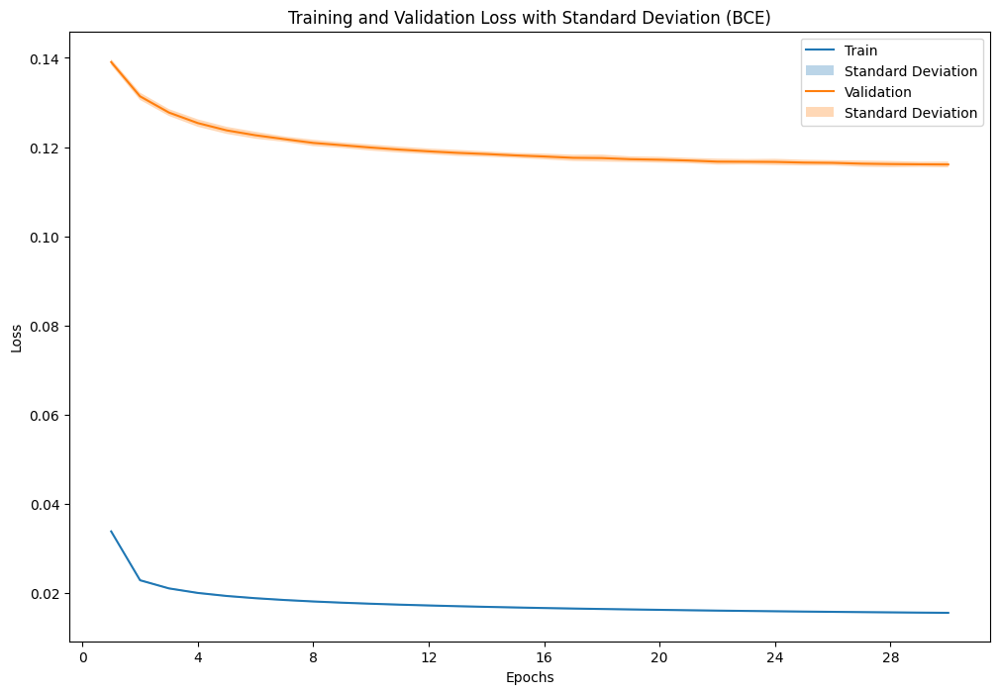

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_8_6_2 = AE_plot_results(fold_results_8_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_8_6_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_8_6_2['epochs'])
plot_mean_std(result_data_8_6_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_8_6_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_8_6_2['valid_result'], result_data_8_6_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.116104   0.114704
1  Standard Deviation         0.000652   0.000549

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.115620,0.114103
1,2,0.115548,0.114485
2,3,0.116314,0.114395
3,4,0.115661,0.114587
4,5,0.115706,0.114477
5,6,0.116786,0.115210
6,7,0.117060,0.115952
7,8,0.117189,0.114135
8,9,0.115267,0.114486
9,10,0.115884,0.115213


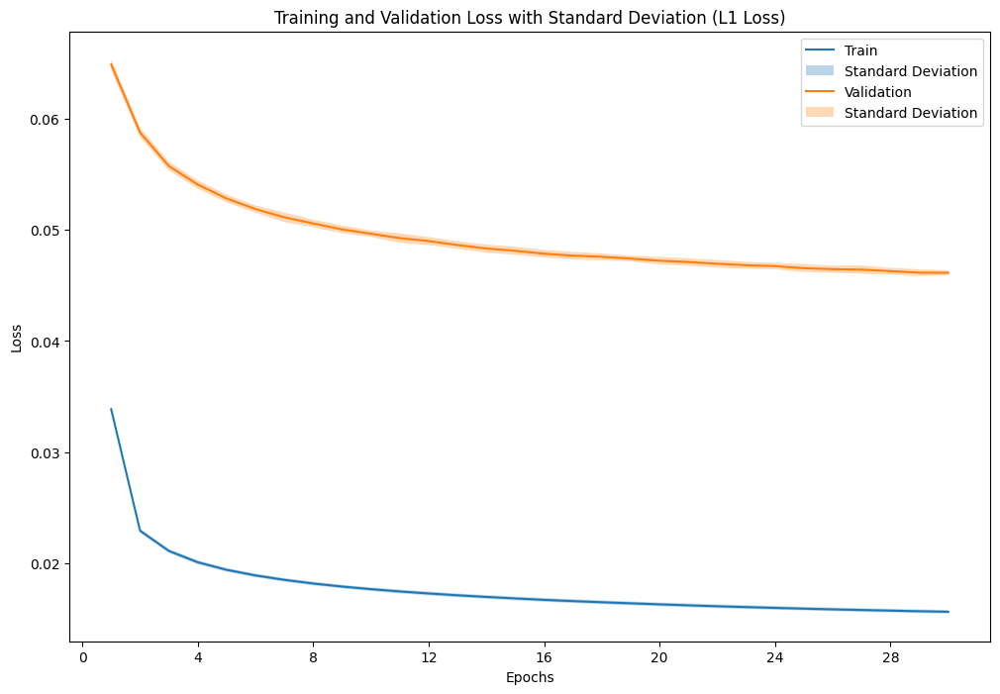

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_8_6_3 = AE_plot_results(fold_results_8_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_8_6_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_8_6_3['epochs'])
plot_mean_std(result_data_8_6_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_8_6_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_8_6_3['valid_result'], result_data_8_6_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.046148   0.045572
1  Standard Deviation         0.000224   0.000307

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.045738,0.045111
1,2,0.046140,0.045538
2,3,0.046119,0.045417
3,4,0.046060,0.045579
4,5,0.046228,0.045632
5,6,0.046235,0.045636
6,7,0.046595,0.046097
7,8,0.046062,0.045220
8,9,0.045926,0.045400
9,10,0.046378,0.046090


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_8_6 = sum(p.numel() for p in models_8_6[0].parameters())
print(f"Number of parameters in the model: {total_params_8_6}")

Number of parameters in the model: 628848


### Experiment 1.2: AE with 2 layer

- Model: AE of 2 layer, D_x=784, D_z=16, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_1_7 = 'AE'
model_config_1_7 = {'D_x': 784, 'n_layers': 2, 'D_z': 16, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_1_7, fold_results_1_7 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_1_7),
                                                model_config=model_config_1_7,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=400, bias=True), ReLU(), Linear(in_features=400, out_features=16, bias=True)]
[Linear(in_features=16, out_features=400, bias=True), ReLU(), Linear(in_features=400, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.028775
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.016666688262782198, 'L1 Loss': 0.0486132663060376, 'BCE': 0.11550479215827394}
Train Fold/Epoch: 1/2, Training Loss: 0.015038
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.01399169230159927, 'L1 Loss': 0.042846681034945426, 'BCE': 0.10645909615336581}
Train Fold/Epoch: 1/3, Training Loss: 0.013165
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.012806825874809255, 'L1 Loss': 0.039922368692907884, 'BCE': 0.10257689852980857}
Train Fold/Epoch: 1/4, Training Loss: 0.012139
Va

### Visualizing reconstructions for all fold

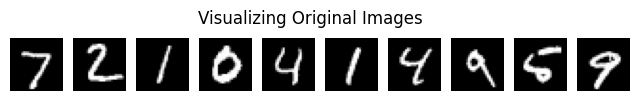

Visualizing reconstructions for fold 1


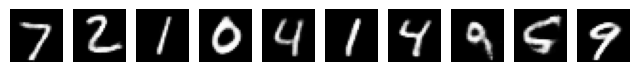

Visualizing reconstructions for fold 2


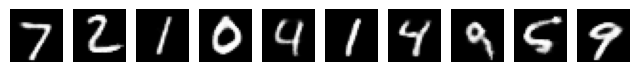

Visualizing reconstructions for fold 3


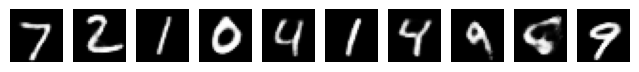

Visualizing reconstructions for fold 4


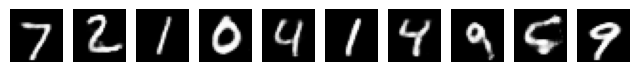

Visualizing reconstructions for fold 5


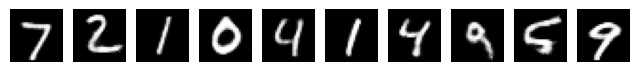

Visualizing reconstructions for fold 6


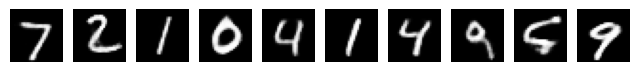

Visualizing reconstructions for fold 7


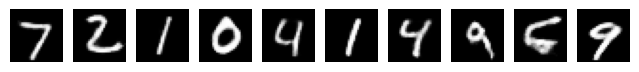

Visualizing reconstructions for fold 8


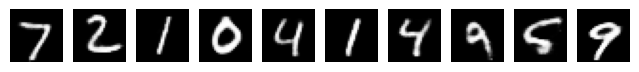

Visualizing reconstructions for fold 9


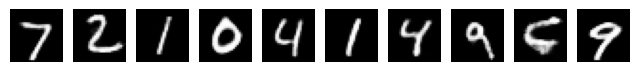

Visualizing reconstructions for fold 10


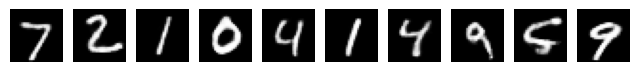

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_1_7):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

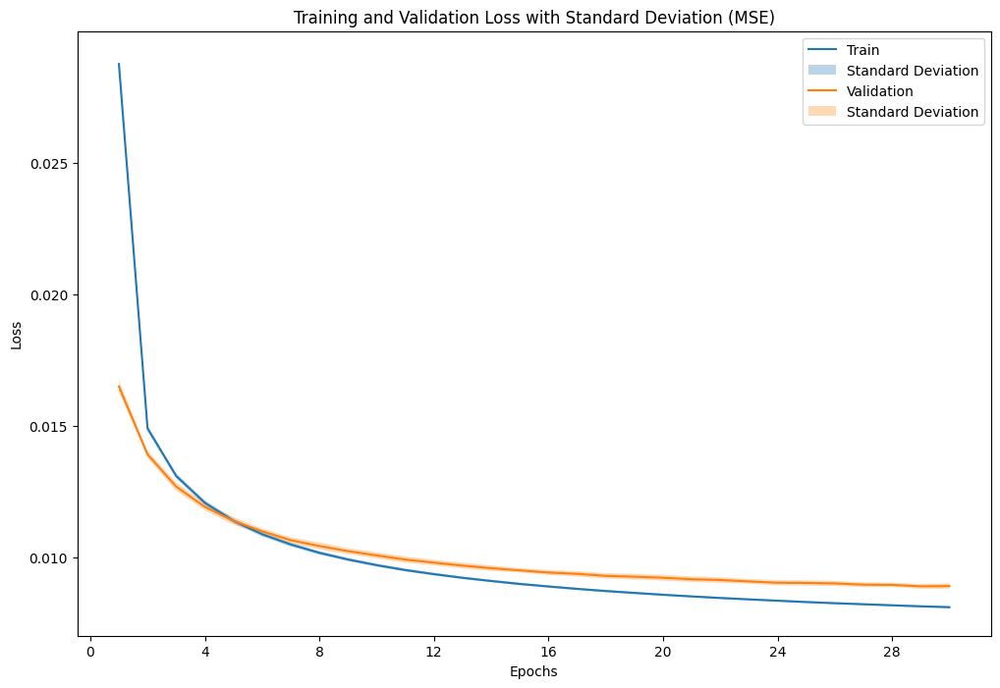

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_1_7_1 = AE_plot_results(fold_results_1_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_7_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_7_1['epochs'])
plot_mean_std(result_data_1_7_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_7_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_7_1['valid_result'], result_data_1_7_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.008909   0.008692
1  Standard Deviation         0.000103   0.000069

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.008929,0.008676
1,2,0.008986,0.008722
2,3,0.008848,0.008596
3,4,0.008936,0.008731
4,5,0.008883,0.008675
5,6,0.008791,0.008621
6,7,0.008929,0.008683
7,8,0.009153,0.008864
8,9,0.008871,0.008677
9,10,0.008767,0.008672


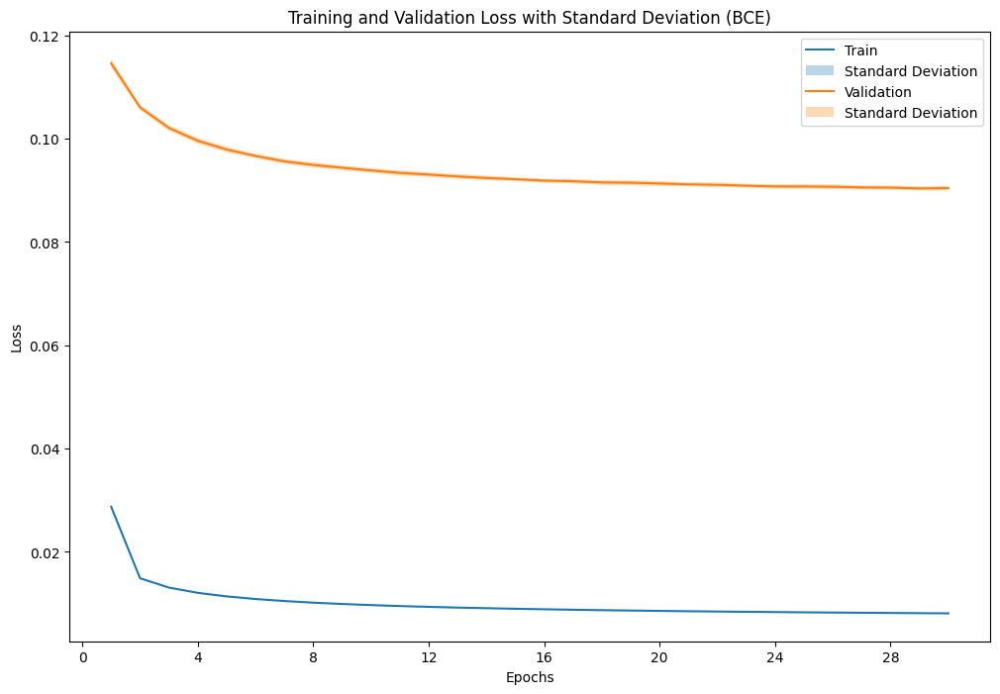

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_1_7_2 = AE_plot_results(fold_results_1_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_7_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_7_2['epochs'])
plot_mean_std(result_data_1_7_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_7_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_7_2['valid_result'], result_data_1_7_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.090431   0.089391
1  Standard Deviation         0.000459   0.000258

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.090764,0.089431
1,2,0.090411,0.089411
2,3,0.090303,0.089114
3,4,0.090581,0.089581
4,5,0.090138,0.089114
5,6,0.090231,0.089026
6,7,0.090491,0.089416
7,8,0.091560,0.089973
8,9,0.089994,0.089437
9,10,0.089831,0.089404


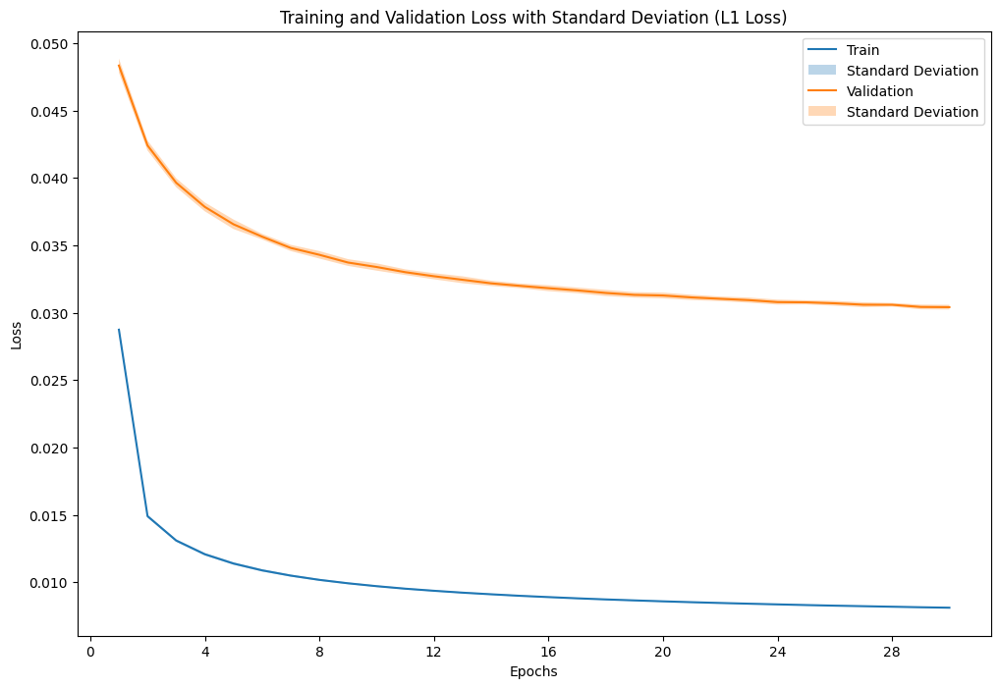

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_1_7_3 = AE_plot_results(fold_results_1_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_7_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_7_3['epochs'])
plot_mean_std(result_data_1_7_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_7_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_7_3['valid_result'], result_data_1_7_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.030411   0.029887
1  Standard Deviation         0.000175   0.000136

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.030404,0.029793
1,2,0.030437,0.029865
2,3,0.030325,0.029741
3,4,0.030332,0.029855
4,5,0.030469,0.029966
5,6,0.030375,0.029864
6,7,0.030357,0.029768
7,8,0.030897,0.030251
8,9,0.030283,0.029856
9,10,0.030235,0.029908


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_1_7 = sum(p.numel() for p in models_1_7[0].parameters())
print(f"Number of parameters in the model: {total_params_1_7}")

Number of parameters in the model: 641600


### Experiment 1.2: AE with 2 layer

- Model: AE of 2 layer, D_x=784, D_z=16, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_1_8 = 'AE'
model_config_1_8 = {'D_x': 784, 'n_layers': 2, 'D_z': 32, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_1_8, fold_results_1_8 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_1_8),
                                                model_config=model_config_1_8,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=408, bias=True), ReLU(), Linear(in_features=408, out_features=32, bias=True)]
[Linear(in_features=32, out_features=408, bias=True), ReLU(), Linear(in_features=408, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.026406
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.011974827208100482, 'L1 Loss': 0.03931572395277784, 'BCE': 0.10062303092885524}
Train Fold/Epoch: 1/2, Training Loss: 0.009920
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.00883676255854996, 'L1 Loss': 0.0318211454581073, 'BCE': 0.09021346778311629}
Train Fold/Epoch: 1/3, Training Loss: 0.007914
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.007498935563489795, 'L1 Loss': 0.028445547506054665, 'BCE': 0.0856836385866429}
Train Fold/Epoch: 1/4, Training Loss: 0.006991
Vali

### Visualizing reconstructions for all fold

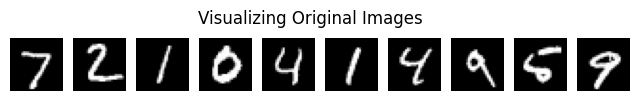

Visualizing reconstructions for fold 1


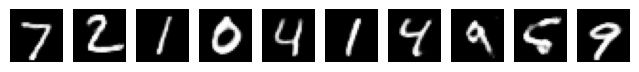

Visualizing reconstructions for fold 2


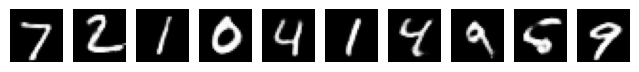

Visualizing reconstructions for fold 3


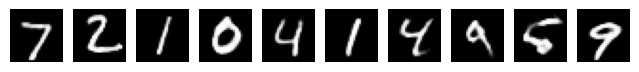

Visualizing reconstructions for fold 4


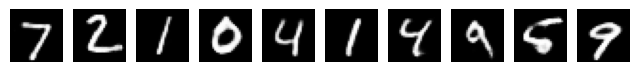

Visualizing reconstructions for fold 5


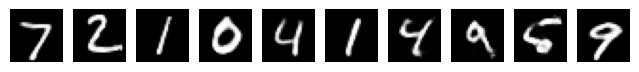

Visualizing reconstructions for fold 6


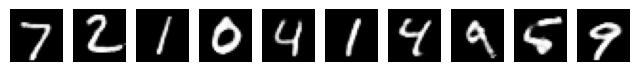

Visualizing reconstructions for fold 7


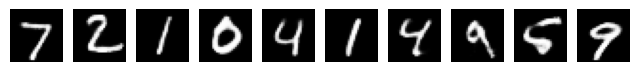

Visualizing reconstructions for fold 8


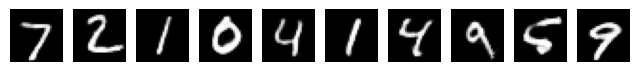

Visualizing reconstructions for fold 9


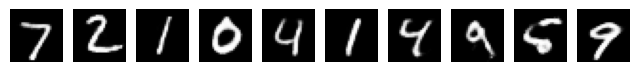

Visualizing reconstructions for fold 10


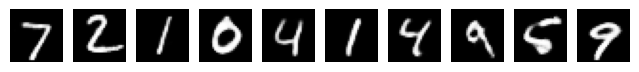

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_1_8):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

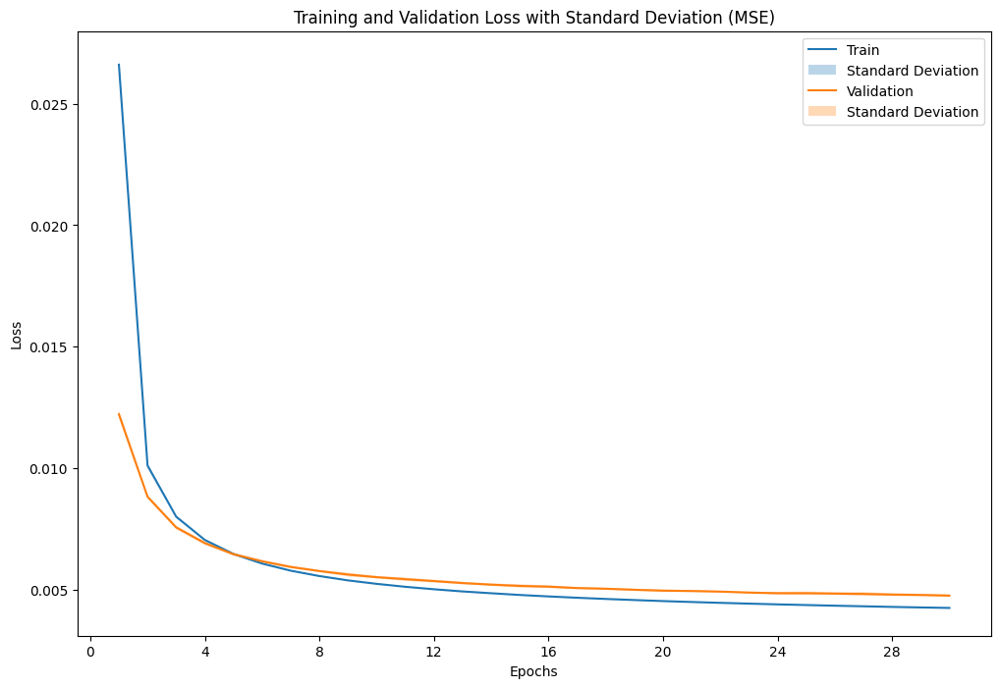

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_1_8_1 = AE_plot_results(fold_results_1_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_8_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_8_1['epochs'])
plot_mean_std(result_data_1_8_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_8_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_8_1['valid_result'], result_data_1_8_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.004746   0.004616
1  Standard Deviation         0.000049   0.000030

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.004785,0.004615
1,2,0.004751,0.004628
2,3,0.004728,0.004579
3,4,0.004688,0.004587
4,5,0.004715,0.004606
5,6,0.004706,0.004584
6,7,0.004804,0.004668
7,8,0.004821,0.004627
8,9,0.004787,0.004666
9,10,0.004671,0.004600


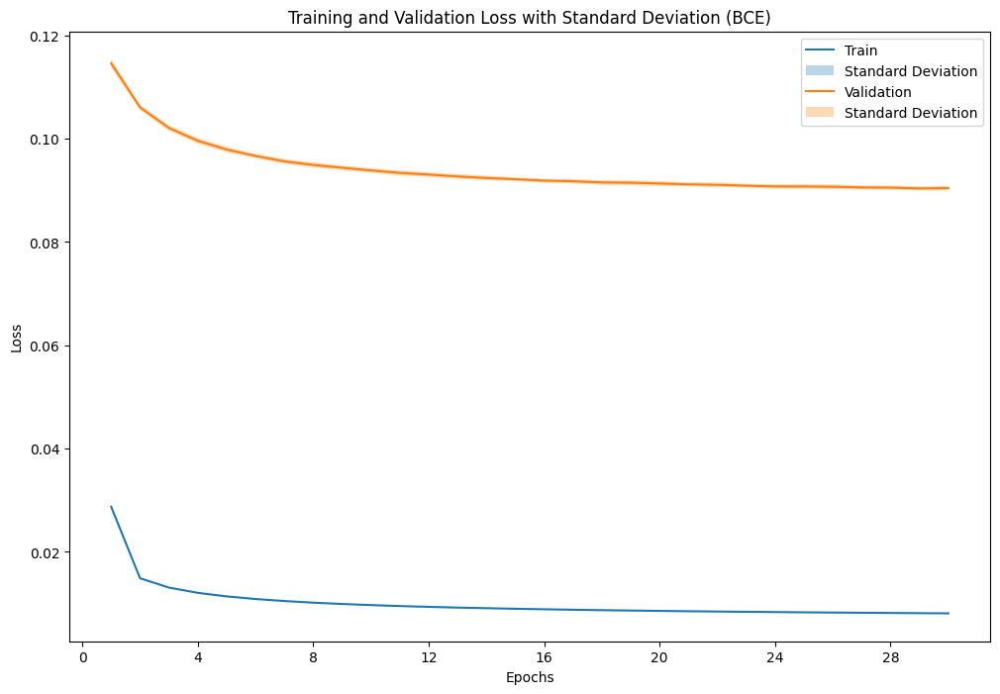

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_1_8_2 = AE_plot_results(fold_results_1_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_8_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_8_2['epochs'])
plot_mean_std(result_data_1_8_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_8_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_8_2['valid_result'], result_data_1_8_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.090431   0.089391
1  Standard Deviation         0.000459   0.000258

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.090764,0.089431
1,2,0.090411,0.089411
2,3,0.090303,0.089114
3,4,0.090581,0.089581
4,5,0.090138,0.089114
5,6,0.090231,0.089026
6,7,0.090491,0.089416
7,8,0.091560,0.089973
8,9,0.089994,0.089437
9,10,0.089831,0.089404


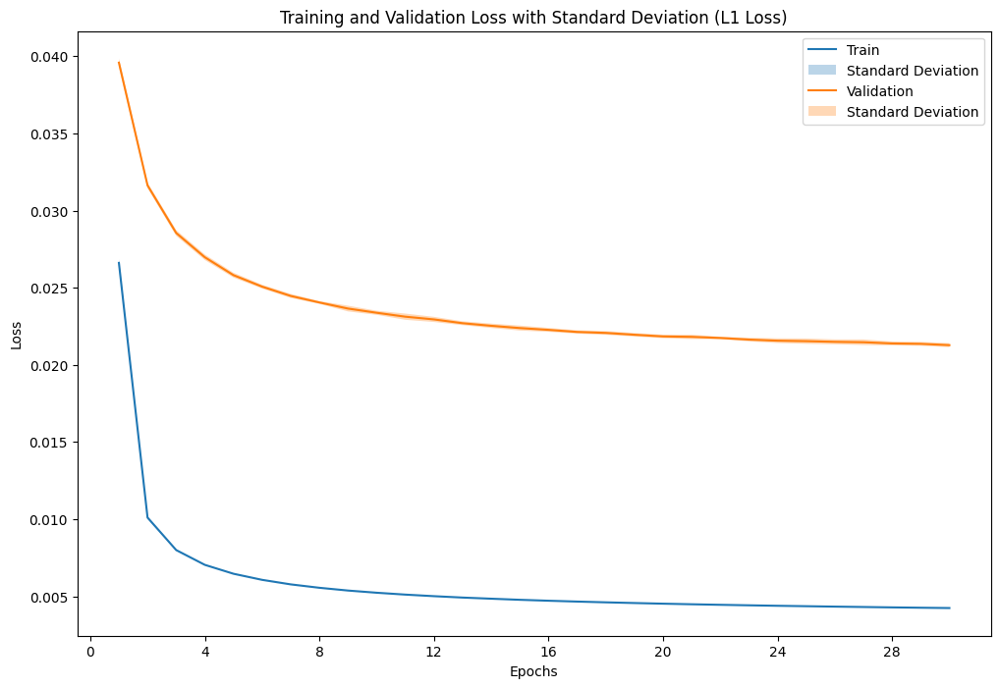

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_1_8_3 = AE_plot_results(fold_results_1_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_1_8_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_1_8_3['epochs'])
plot_mean_std(result_data_1_8_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_1_8_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_1_8_3['valid_result'], result_data_1_8_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.021276   0.020909
1  Standard Deviation         0.000131   0.000093

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.021434,0.020973
1,2,0.021241,0.020913
2,3,0.021194,0.020795
3,4,0.021196,0.020900
4,5,0.021159,0.020844
5,6,0.021195,0.020788
6,7,0.021483,0.021095
7,8,0.021471,0.020915
8,9,0.021288,0.021022
9,10,0.021100,0.020850


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_1_8 = sum(p.numel() for p in models_1_8[0].parameters())
print(f"Number of parameters in the model: {total_params_1_8}")

Number of parameters in the model: 667488


### Experiment 1.2: AE with 2 layer

- Model: AE of 2 layer, D_x=784, D_z=16, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_5_8 = 'AE'
model_config_5_8 = {'D_x': 784, 'n_layers': 2, 'D_z': 64, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_5_8, fold_results_5_8 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_5_8),
                                                model_config=model_config_5_8,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=424, bias=True), ReLU(), Linear(in_features=424, out_features=64, bias=True)]
[Linear(in_features=64, out_features=424, bias=True), ReLU(), Linear(in_features=424, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.025848
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.010912899393588305, 'L1 Loss': 0.03703535950564323, 'BCE': 0.0975588820082076}
Train Fold/Epoch: 1/2, Training Loss: 0.008727
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.0073419846941102694, 'L1 Loss': 0.028416614563382687, 'BCE': 0.08567425537299603}
Train Fold/Epoch: 1/3, Training Loss: 0.006364
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.005815431133824143, 'L1 Loss': 0.02481180841618396, 'BCE': 0.08063702150545221}
Train Fold/Epoch: 1/4, Training Loss: 0.005198
V

### Visualizing reconstructions for all fold

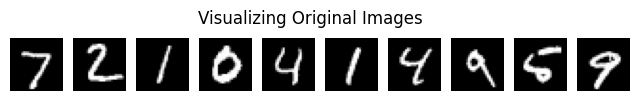

Visualizing reconstructions for fold 1


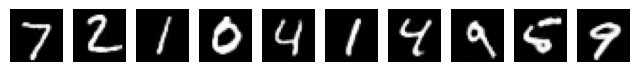

Visualizing reconstructions for fold 2


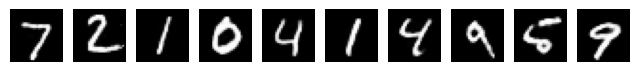

Visualizing reconstructions for fold 3


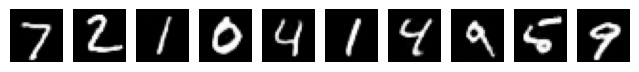

Visualizing reconstructions for fold 4


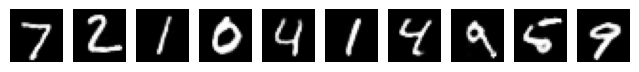

Visualizing reconstructions for fold 5


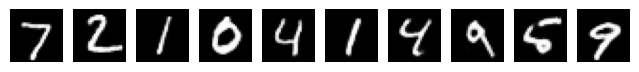

Visualizing reconstructions for fold 6


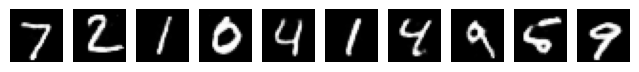

Visualizing reconstructions for fold 7


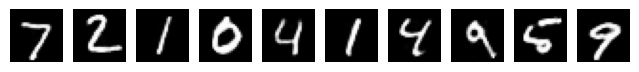

Visualizing reconstructions for fold 8


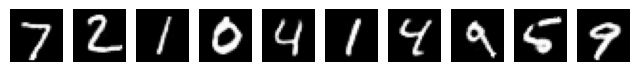

Visualizing reconstructions for fold 9


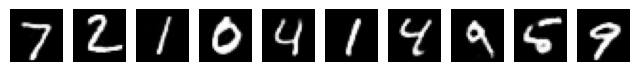

Visualizing reconstructions for fold 10


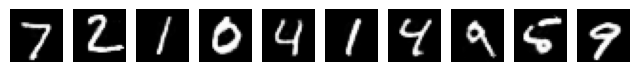

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_5_8):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

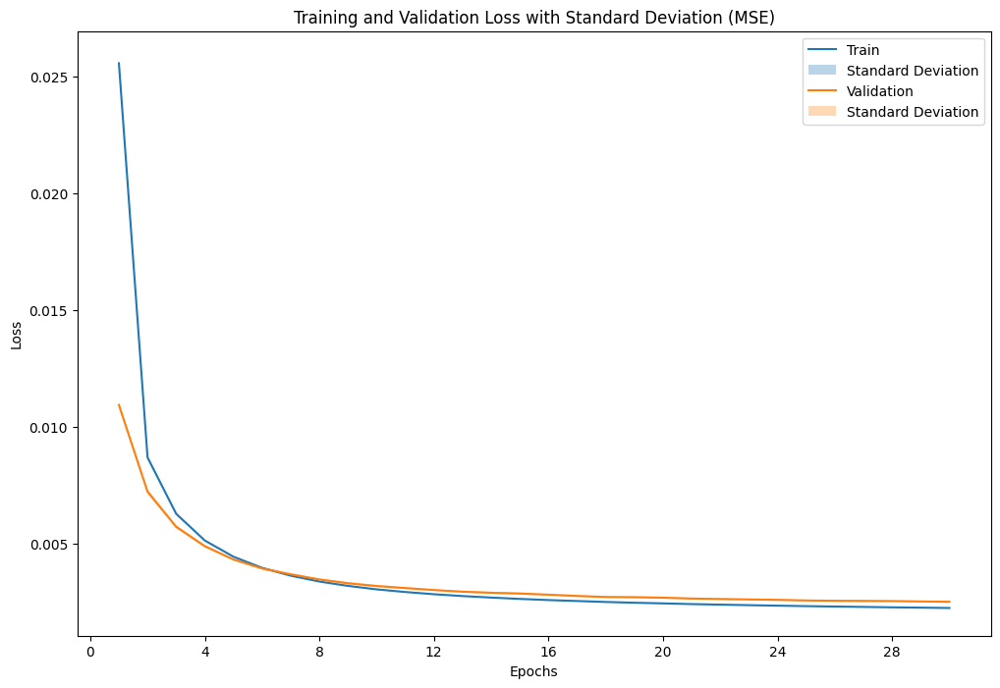

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_5_8_1 = AE_plot_results(fold_results_5_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_5_8_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_5_8_1['epochs'])
plot_mean_std(result_data_5_8_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_5_8_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_5_8_1['valid_result'], result_data_5_8_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.002518   0.002450
1  Standard Deviation         0.000044   0.000034

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.002452,0.002386
1,2,0.002539,0.002489
2,3,0.002535,0.002468
3,4,0.002485,0.002417
4,5,0.002517,0.002455
5,6,0.002498,0.002421
6,7,0.002515,0.002453
7,8,0.002627,0.002508
8,9,0.002525,0.002461
9,10,0.002486,0.002444


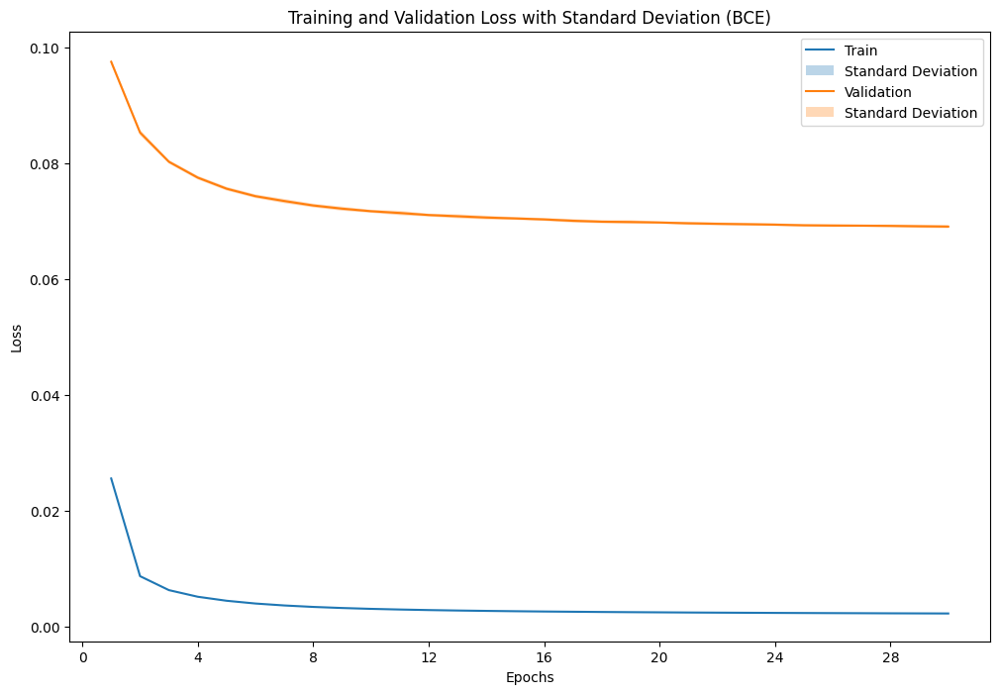

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_5_8_2 = AE_plot_results(fold_results_5_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_5_8_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_5_8_2['epochs'])
plot_mean_std(result_data_5_8_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_5_8_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_5_8_2['valid_result'], result_data_5_8_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.069020   0.068477
1  Standard Deviation         0.000268   0.000121

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.068934,0.068259
1,2,0.069015,0.068616
2,3,0.069071,0.068550
3,4,0.068830,0.068301
4,5,0.068965,0.068490
5,6,0.069311,0.068410
6,7,0.068961,0.068470
7,8,0.069662,0.068662
8,9,0.068744,0.068552
9,10,0.068713,0.068464


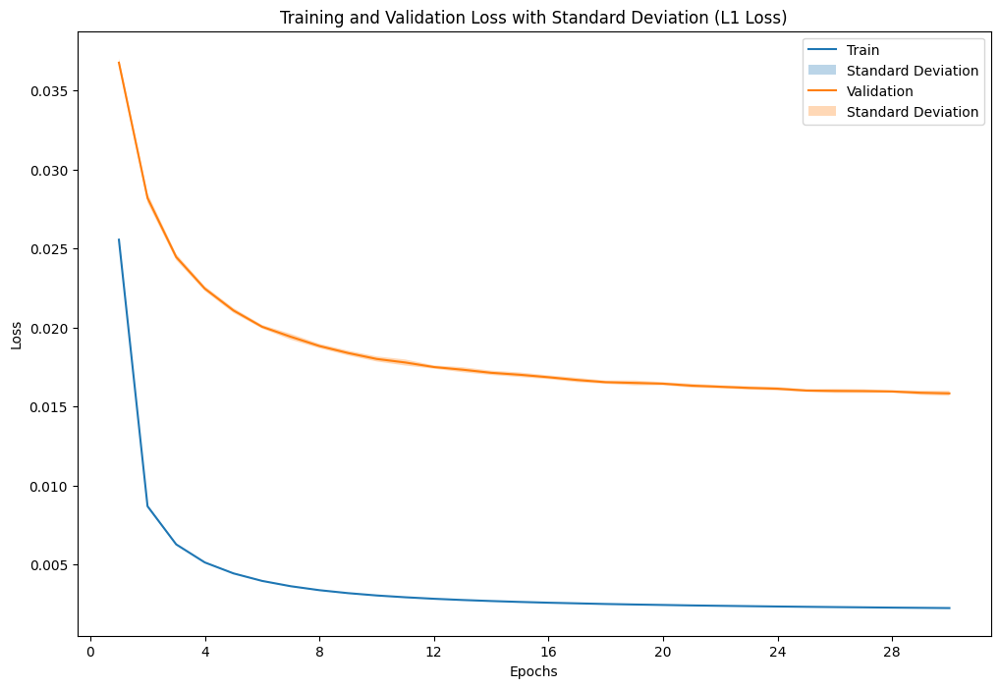

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_5_8_3 = AE_plot_results(fold_results_5_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_5_8_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_5_8_3['epochs'])
plot_mean_std(result_data_5_8_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_5_8_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_5_8_3['valid_result'], result_data_5_8_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.015832   0.015600
1  Standard Deviation         0.000153   0.000126

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.015634,0.015378
1,2,0.015909,0.015754
2,3,0.015905,0.015674
3,4,0.015654,0.015426
4,5,0.015804,0.015590
5,6,0.015826,0.015542
6,7,0.015804,0.015579
7,8,0.016205,0.015798
8,9,0.015855,0.015678
9,10,0.015728,0.015578


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_5_8 = sum(p.numel() for p in models_5_8[0].parameters())
print(f"Number of parameters in the model: {total_params_5_8}")

Number of parameters in the model: 720800


## Test 2 AE: BCE

### Experiment 2.1 : AE with 2 layer

- Model: AE of 1 layer, D_x=784, D_z=2, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_2_6 = 'AE'
model_config_2_6 = {'D_x': 784, 'n_layers': 2, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_2_6, fold_results_2_6 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_2_6),
                                                model_config=model_config_2_6,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=393, bias=True), ReLU(), Linear(in_features=393, out_features=2, bias=True)]
[Linear(in_features=2, out_features=393, bias=True), ReLU(), Linear(in_features=393, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.222523
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.048713976755104166, 'L1 Loss': 0.11260278293109954, 'BCE': 0.2057116481852024}
Train Fold/Epoch: 1/2, Training Loss: 0.202009
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.04662270538825938, 'L1 Loss': 0.10810816755637209, 'BCE': 0.19931512801571094}
Train Fold/Epoch: 1/3, Training Loss: 0.196577
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.04503773584803368, 'L1 Loss': 0.10550116628725478, 'BCE': 0.1947845425060455}
Train Fold/Epoch: 1/4, Training Loss: 0.193379
Validati

### Visualizing reconstructions for all fold

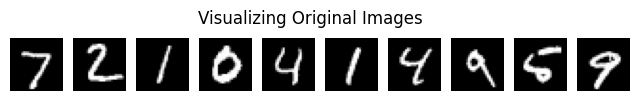

Visualizing reconstructions for fold 1


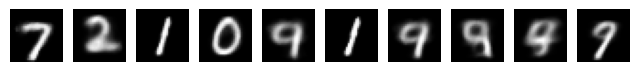

Visualizing reconstructions for fold 2


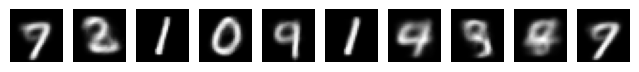

Visualizing reconstructions for fold 3


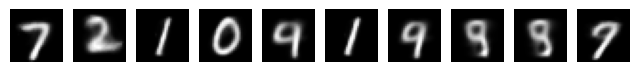

Visualizing reconstructions for fold 4


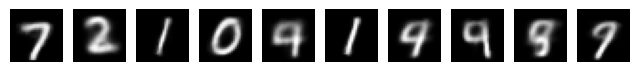

Visualizing reconstructions for fold 5


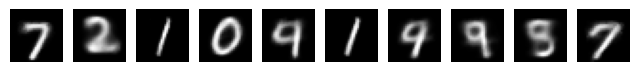

Visualizing reconstructions for fold 6


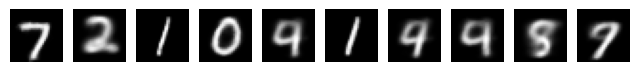

Visualizing reconstructions for fold 7


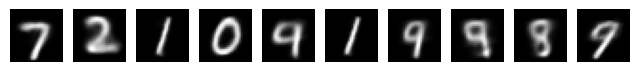

Visualizing reconstructions for fold 8


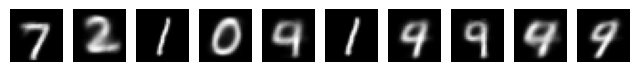

Visualizing reconstructions for fold 9


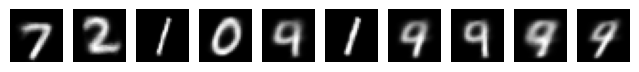

Visualizing reconstructions for fold 10


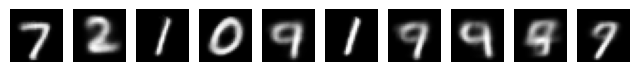

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_2_6):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

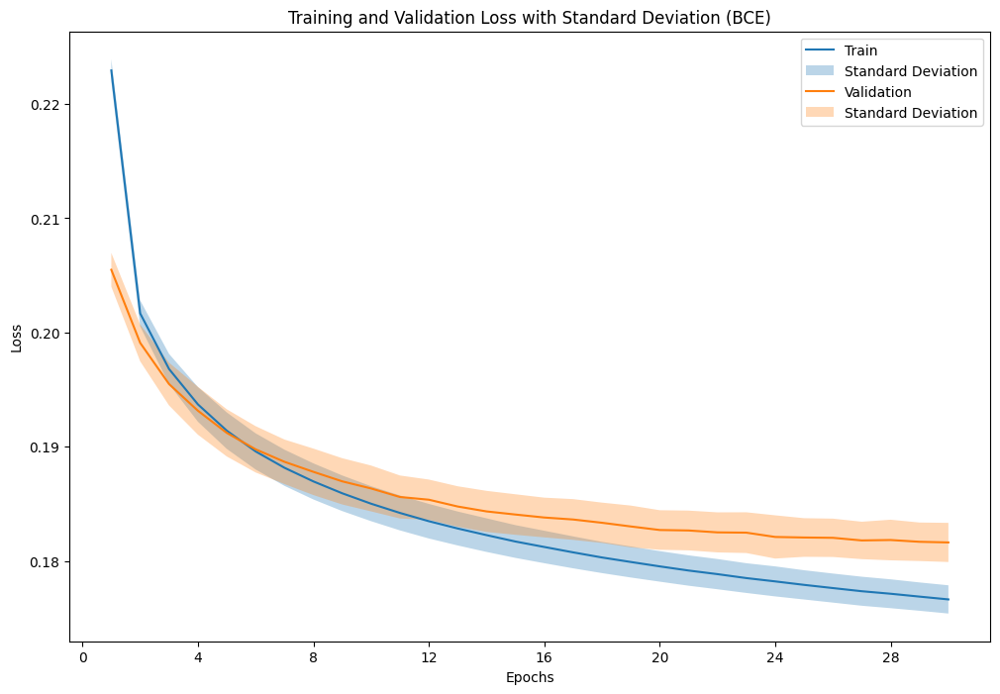

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_2_6_1 = AE_plot_results(fold_results_2_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_6_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_6_1['epochs'])
plot_mean_std(result_data_2_6_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_6_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_6_1['valid_result'], result_data_2_6_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.181634   0.181347
1  Standard Deviation         0.001712   0.001797

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.181347,0.181143
1,2,0.181283,0.181128
2,3,0.182182,0.180909
3,4,0.183240,0.183785
4,5,0.179604,0.179406
5,6,0.181032,0.180556
6,7,0.181451,0.180827
7,8,0.184689,0.183413
8,9,0.178427,0.178232
9,10,0.183084,0.184072


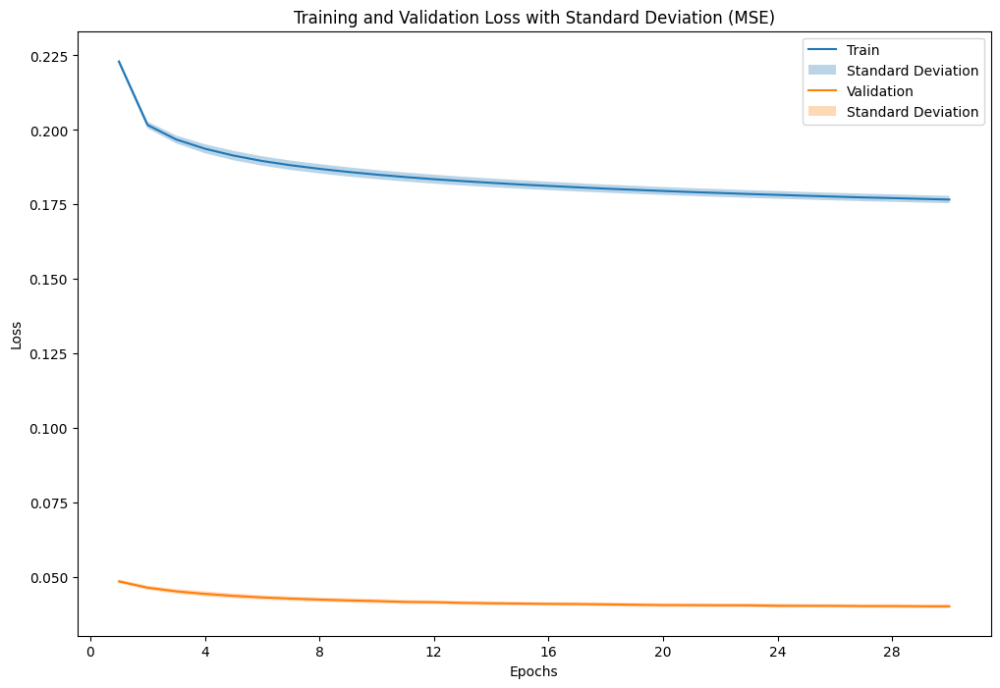

In [ ]:
loss_type_to_plot = 'MSE'  # You can change this to our desired loss type
result_data_2_6_2 = AE_plot_results(fold_results_2_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_6_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_6_2['epochs'])
plot_mean_std(result_data_2_6_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_6_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_6_2['valid_result'], result_data_2_6_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.040248   0.040239
1  Standard Deviation         0.000630   0.000665

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.040183,0.040291
1,2,0.040244,0.040274
2,3,0.040277,0.039928
3,4,0.040784,0.041062
4,5,0.039500,0.039571
5,6,0.040008,0.040021
6,7,0.040067,0.039919
7,8,0.041459,0.041124
8,9,0.039136,0.039044
9,10,0.040817,0.041153


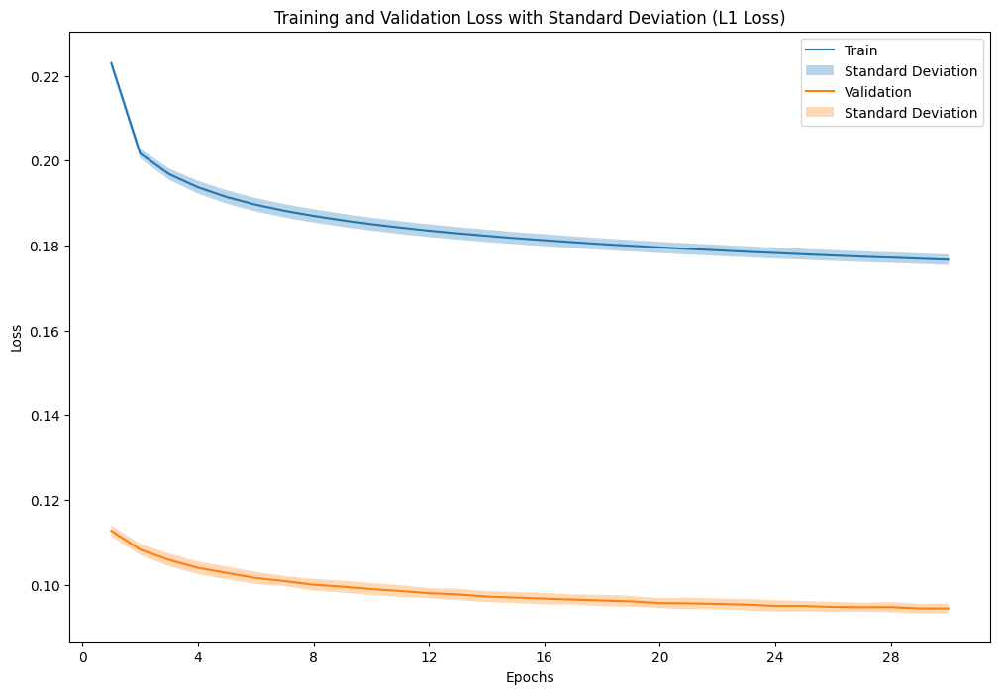

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_2_6_3 = AE_plot_results(fold_results_2_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_6_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_6_3['epochs'])
plot_mean_std(result_data_2_6_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_6_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_6_3['valid_result'], result_data_2_6_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.094408   0.094574
1  Standard Deviation         0.001184   0.001213

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.094380,0.094702
1,2,0.094482,0.094601
2,3,0.094023,0.093629
3,4,0.095474,0.096091
4,5,0.093308,0.093675
5,6,0.094304,0.094379
6,7,0.094308,0.094400
7,8,0.096585,0.096156
8,9,0.091953,0.092108
9,10,0.095265,0.096002


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_2_6 = sum(p.numel() for p in models_2_6[0].parameters())
print(f"Number of parameters in the model: {total_params_2_6}")

Number of parameters in the model: 619368


### Latente Space for each fold

<ipython-input-10-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


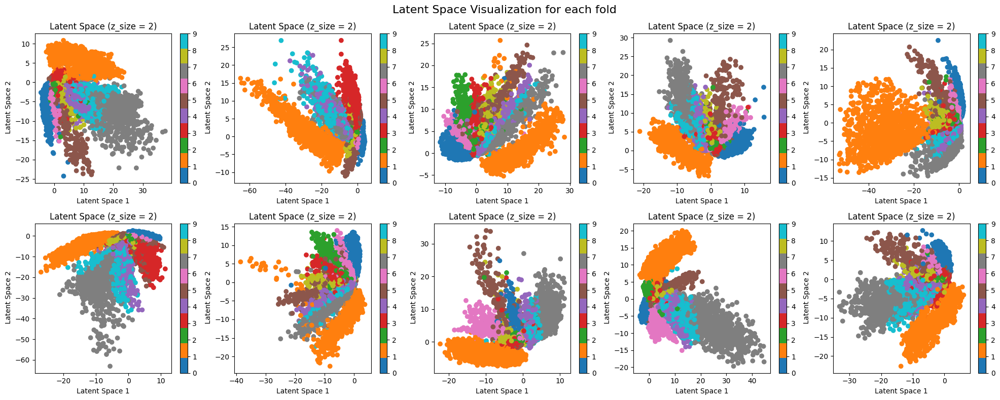

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))
fig.suptitle('Latent Space Visualization for each fold', fontsize=16)

# Flatten the 2D array of subplots
axes = axes.flatten()

for i, model in enumerate(models_2_6):
    latent_space_AE_model(model, test_loader, device, ax=axes[i])

# plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


<ipython-input-10-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


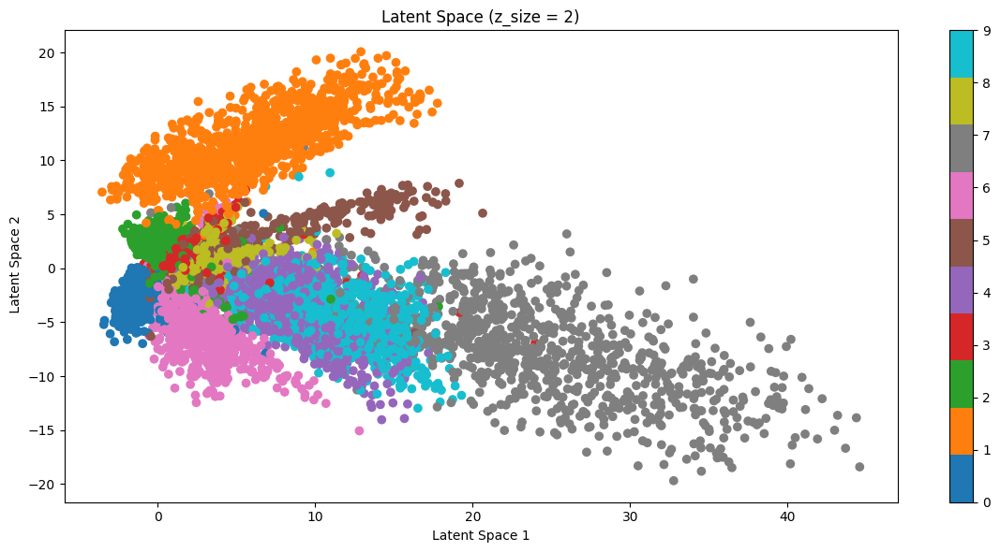

In [ ]:
latent_space_AE_model(models_2_6[8], test_loader, device)
# print(type(models_1_4[9]))

### Experiment 2.1 : AE with 1 layer

- Model: AE of 1 layer, D_x=784, D_z=2, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_9_6 = 'AE'
model_config_9_6 = {'D_x': 784, 'n_layers': 2, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_9_6, fold_results_9_6 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_9_6),
                                                model_config=model_config_9_6,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=393, bias=True), ReLU(), Linear(in_features=393, out_features=2, bias=True)]
[Linear(in_features=2, out_features=393, bias=True), ReLU(), Linear(in_features=393, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.220487
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.04781697127730288, 'L1 Loss': 0.11048118254922806, 'BCE': 0.2029127006201034}
Train Fold/Epoch: 1/2, Training Loss: 0.199168
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.04580111904664243, 'L1 Loss': 0.10733664083354016, 'BCE': 0.19711699733074675}
Train Fold/Epoch: 1/3, Training Loss: 0.195134
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.04505228750566219, 'L1 Loss': 0.10493953177269469, 'BCE': 0.1948276070204187}
Train Fold/Epoch: 1/4, Training Loss: 0.192548
Validatio

### Visualizing reconstructions for all fold

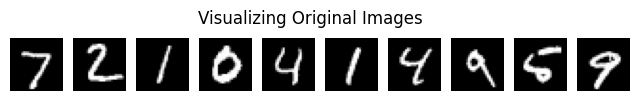

Visualizing reconstructions for fold 1


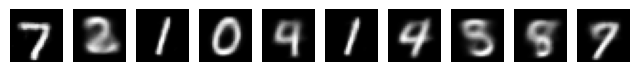

Visualizing reconstructions for fold 2


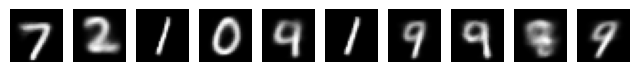

Visualizing reconstructions for fold 3


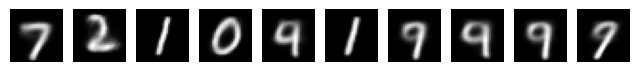

Visualizing reconstructions for fold 4


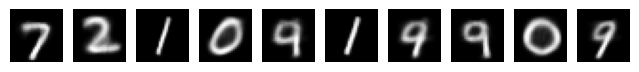

Visualizing reconstructions for fold 5


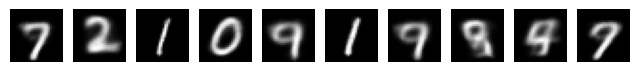

Visualizing reconstructions for fold 6


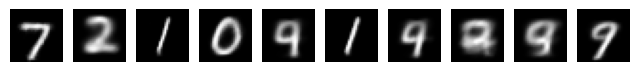

Visualizing reconstructions for fold 7


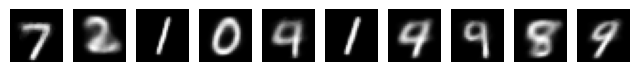

Visualizing reconstructions for fold 8


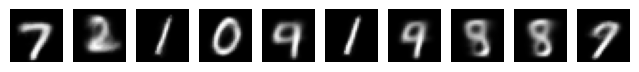

Visualizing reconstructions for fold 9


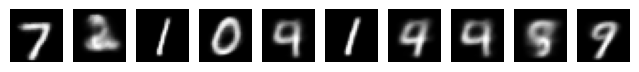

Visualizing reconstructions for fold 10


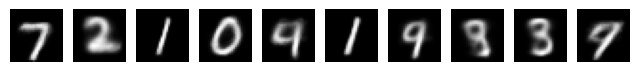

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_9_6):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

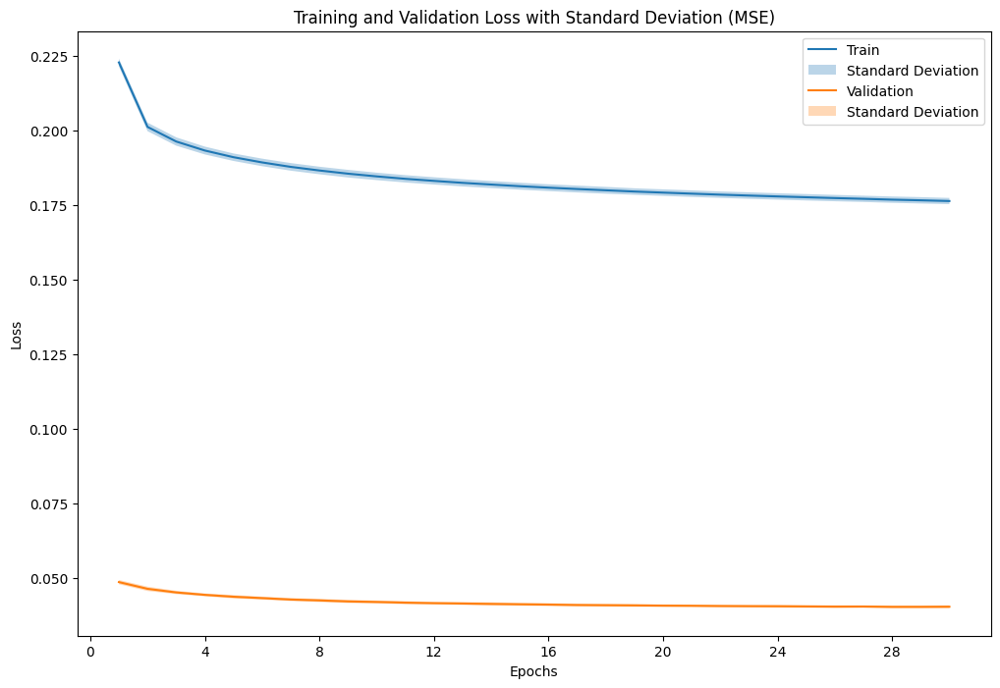

In [ ]:
loss_type_to_plot = 'MSE'  # We can change this to our desired loss type
result_data_9_6_1 = AE_plot_results(fold_results_9_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_9_6_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_9_6_1['epochs'])
plot_mean_std(result_data_9_6_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_9_6_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_9_6_1['valid_result'], result_data_9_6_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean          0.04026   0.040282
1  Standard Deviation          0.00049   0.000473

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.040115,0.040254
1,2,0.039910,0.039650
2,3,0.040664,0.040296
3,4,0.040575,0.040991
4,5,0.040870,0.041037
5,6,0.040438,0.040565
6,7,0.039357,0.039495
7,8,0.040898,0.040332
8,9,0.040099,0.040102
9,10,0.039672,0.040100


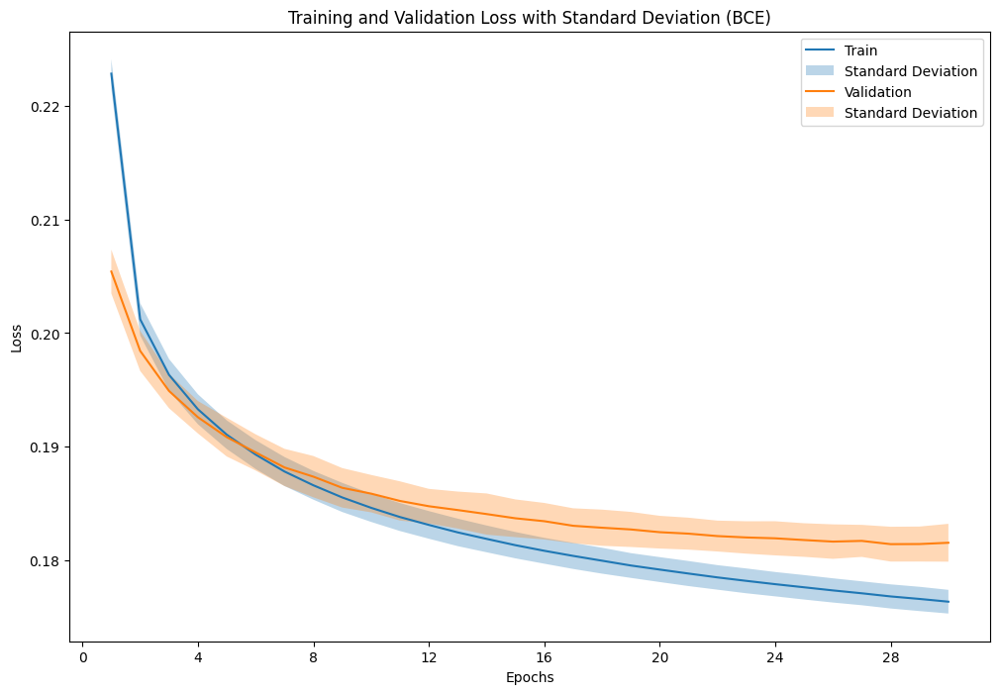

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_9_6_2 = AE_plot_results(fold_results_9_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_9_6_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_9_6_2['epochs'])
plot_mean_std(result_data_9_6_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_9_6_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_9_6_2['valid_result'], result_data_9_6_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.181535   0.181307
1  Standard Deviation         0.001666   0.001343

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.181276,0.181090
1,2,0.180178,0.179430
2,3,0.182886,0.181540
3,4,0.181791,0.182664
4,5,0.183461,0.183601
5,6,0.182482,0.182196
6,7,0.178568,0.178881
7,8,0.184169,0.181859
8,9,0.180721,0.180849
9,10,0.179814,0.180959


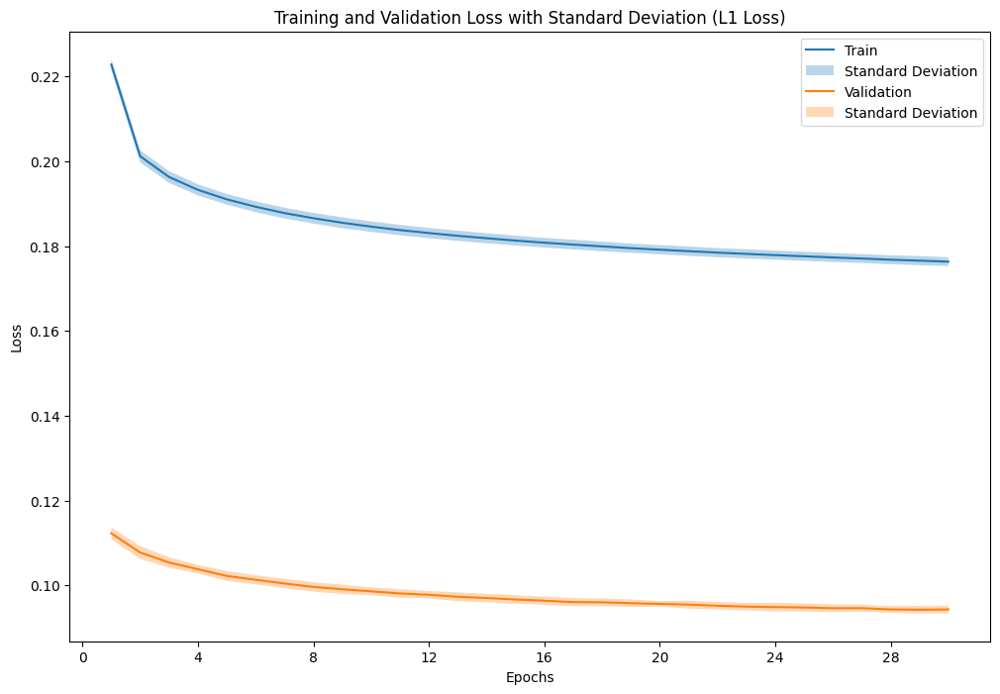

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_9_6_3 = AE_plot_results(fold_results_9_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_9_6_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_9_6_3['epochs'])
plot_mean_std(result_data_9_6_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_9_6_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_9_6_3['valid_result'], result_data_9_6_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.094329   0.094577
1  Standard Deviation         0.000907   0.000919

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.094423,0.094944
1,2,0.092890,0.092796
2,3,0.094515,0.094241
3,4,0.094950,0.095692
4,5,0.095539,0.095884
5,6,0.094980,0.095270
6,7,0.092891,0.093314
7,8,0.095380,0.094547
8,9,0.094197,0.094531
9,10,0.093523,0.094555


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_9_6 = sum(p.numel() for p in models_9_6[0].parameters())
print(f"Number of parameters in the model: {total_params_9_6}")

Number of parameters in the model: 619368


### Experiment 2.2: AE with 2 layer

- Model: AE of 2 layer, D_x=784, D_z=16, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_2_7 = 'AE'
model_config_2_7 = {'D_x': 784, 'n_layers': 2, 'D_z': 16, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_2_7, fold_results_2_7 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_2_7),
                                                model_config=model_config_2_7,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=400, bias=True), ReLU(), Linear(in_features=400, out_features=16, bias=True)]
[Linear(in_features=16, out_features=400, bias=True), ReLU(), Linear(in_features=400, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.146700
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.016162395566464104, 'L1 Loss': 0.04733007940206122, 'BCE': 0.11165982262885317}
Train Fold/Epoch: 1/2, Training Loss: 0.106389
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.013468432359080365, 'L1 Loss': 0.04135322527206959, 'BCE': 0.10316551722427632}
Train Fold/Epoch: 1/3, Training Loss: 0.100732
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.012355413188801167, 'L1 Loss': 0.03882335712935062, 'BCE': 0.09970248839322557}
Train Fold/Epoch: 1/4, Training Loss: 0.097703
Va

### Visualizing reconstructions for all fold

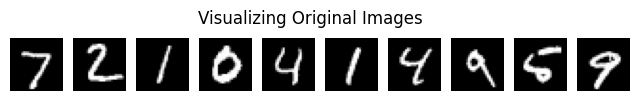

Visualizing reconstructions for fold 1


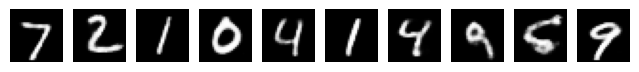

Visualizing reconstructions for fold 2


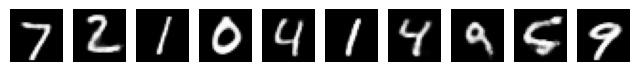

Visualizing reconstructions for fold 3


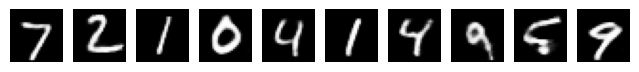

Visualizing reconstructions for fold 4


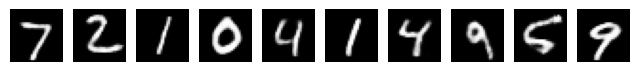

Visualizing reconstructions for fold 5


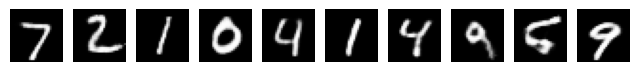

Visualizing reconstructions for fold 6


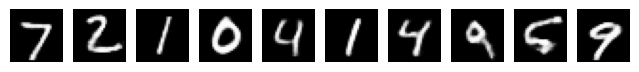

Visualizing reconstructions for fold 7


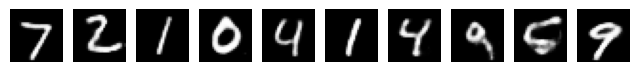

Visualizing reconstructions for fold 8


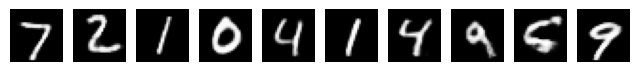

Visualizing reconstructions for fold 9


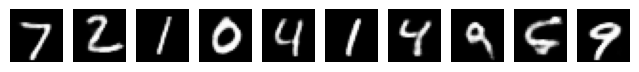

Visualizing reconstructions for fold 10


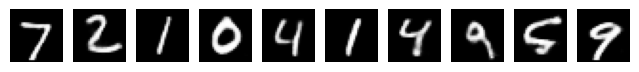

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_2_7):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

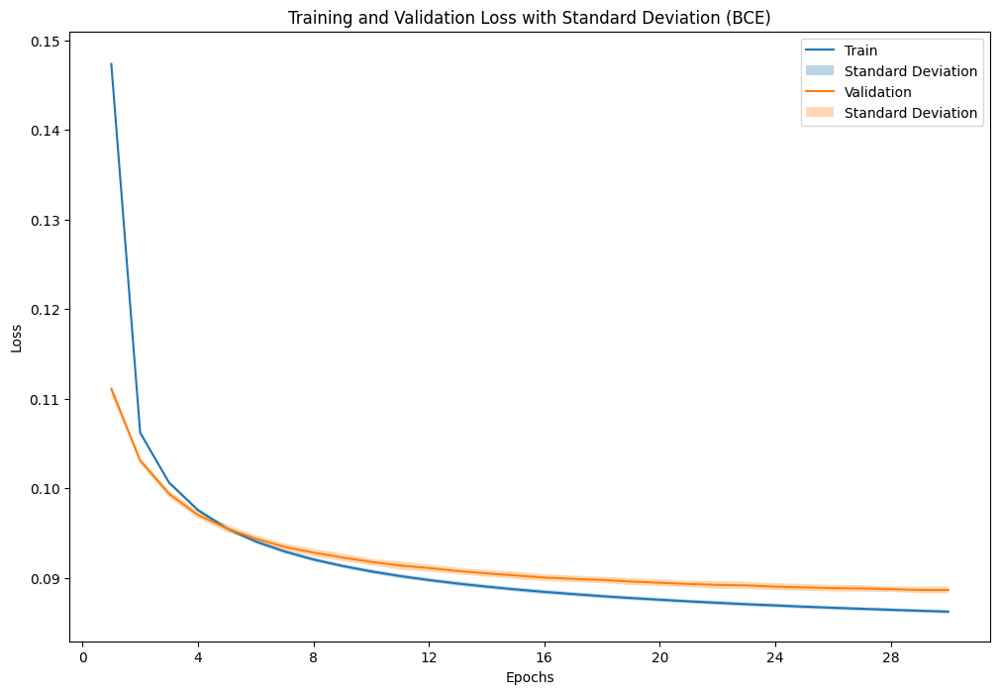

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_2_7_1 = AE_plot_results(fold_results_2_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_7_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_7_1['epochs'])
plot_mean_std(result_data_2_7_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_7_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_7_1['valid_result'], result_data_2_7_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.088638   0.087703
1  Standard Deviation         0.000399   0.000298

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.089133,0.088007
1,2,0.088244,0.087492
2,3,0.088848,0.087751
3,4,0.088290,0.087535
4,5,0.089354,0.088300
5,6,0.088441,0.087360
6,7,0.088844,0.087926
7,8,0.088816,0.087276
8,9,0.088091,0.087609
9,10,0.088323,0.087777


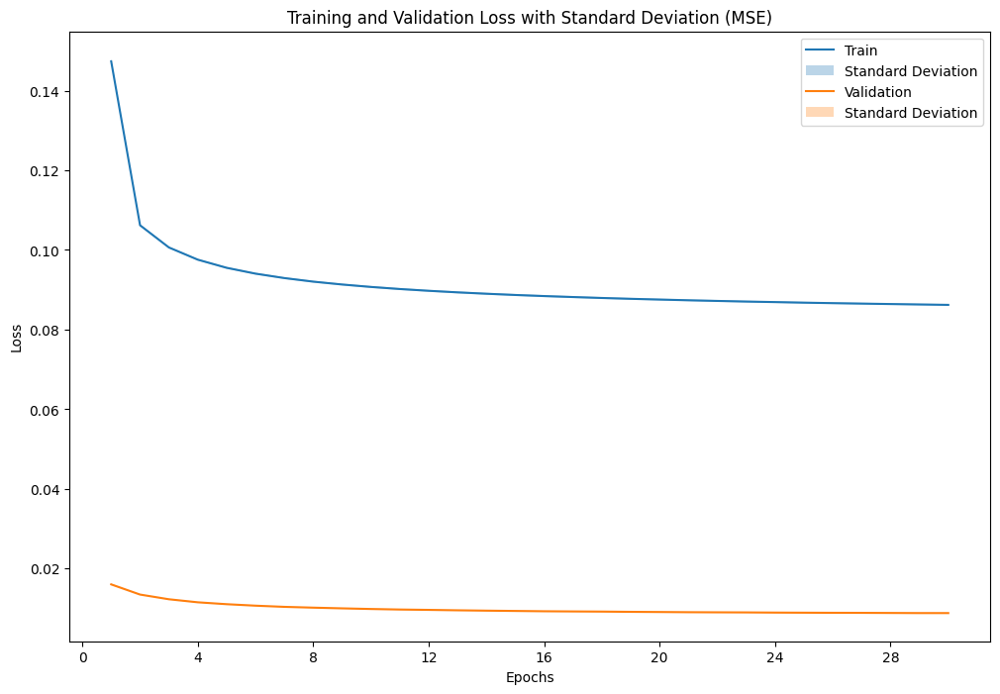

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_2_7_2 = AE_plot_results(fold_results_2_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_7_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_7_2['epochs'])
plot_mean_std(result_data_2_7_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_7_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_7_2['valid_result'], result_data_2_7_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.008825   0.008616
1  Standard Deviation         0.000112   0.000097

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.008937,0.008706
1,2,0.008753,0.008548
2,3,0.008907,0.008637
3,4,0.008717,0.008556
4,5,0.009045,0.008812
5,6,0.008653,0.008508
6,7,0.008891,0.008676
7,8,0.008796,0.008477
8,9,0.008756,0.008572
9,10,0.008794,0.008663


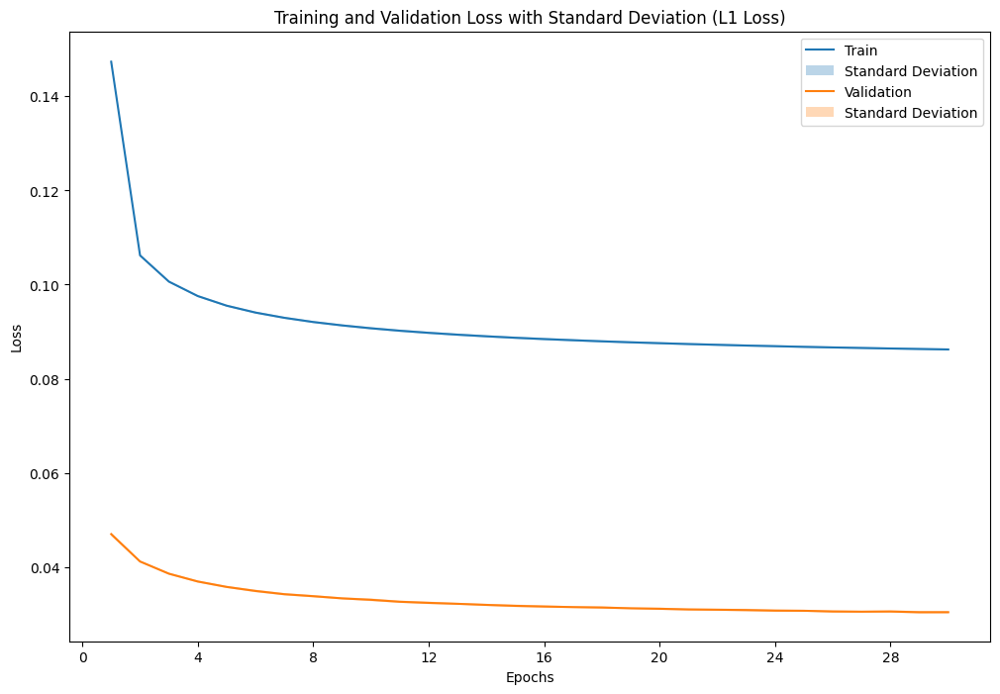

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_2_7_3 = AE_plot_results(fold_results_2_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_7_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_7_3['epochs'])
plot_mean_std(result_data_2_7_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_7_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_7_3['valid_result'], result_data_2_7_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.030377   0.029856
1  Standard Deviation         0.000241   0.000198

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.030487,0.029900
1,2,0.030263,0.029755
2,3,0.030569,0.029941
3,4,0.030043,0.029613
4,5,0.030832,0.030273
5,6,0.030153,0.029675
6,7,0.030567,0.030079
7,8,0.030500,0.029756
8,9,0.030082,0.029651
9,10,0.030270,0.029913


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_2_7 = sum(p.numel() for p in models_2_7[0].parameters())
print(f"Number of parameters in the model: {total_params_2_7}")

Number of parameters in the model: 641600


### Experiment 2.3: AE with 2 layer

- Model: AE of 1 layer, D_x=784, D_z=32, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_2_8 = 'AE'
model_config_2_8 = {'D_x': 784, 'n_layers': 2, 'D_z': 32, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_2_8, fold_results_2_8 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_2_8),
                                                model_config=model_config_2_8,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=408, bias=True), ReLU(), Linear(in_features=408, out_features=32, bias=True)]
[Linear(in_features=32, out_features=408, bias=True), ReLU(), Linear(in_features=408, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.141216
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.012258894721719813, 'L1 Loss': 0.039107136943555894, 'BCE': 0.09976233304180998}
Train Fold/Epoch: 1/2, Training Loss: 0.092810
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.008766735908872586, 'L1 Loss': 0.03086310418996405, 'BCE': 0.08870235069635067}
Train Fold/Epoch: 1/3, Training Loss: 0.085736
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.007439571437723142, 'L1 Loss': 0.027786213508311737, 'BCE': 0.08447524667420286}
Train Fold/Epoch: 1/4, Training Loss: 0.082467


### Visualizing reconstructions for all fold

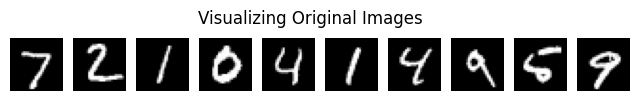

Visualizing reconstructions for fold 1


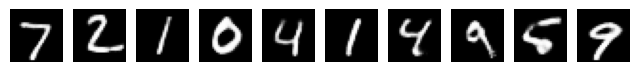

Visualizing reconstructions for fold 2


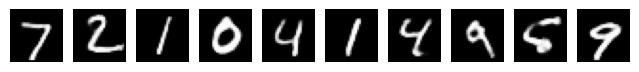

Visualizing reconstructions for fold 3


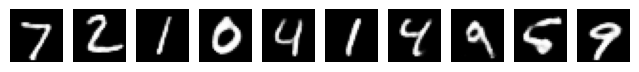

Visualizing reconstructions for fold 4


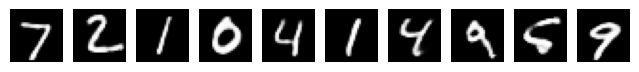

Visualizing reconstructions for fold 5


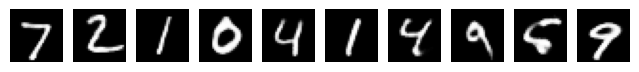

Visualizing reconstructions for fold 6


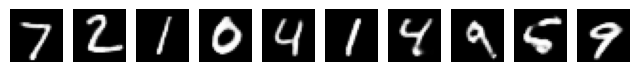

Visualizing reconstructions for fold 7


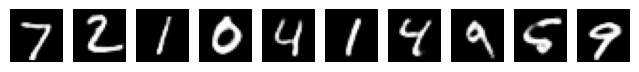

Visualizing reconstructions for fold 8


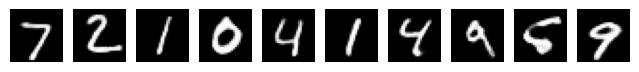

Visualizing reconstructions for fold 9


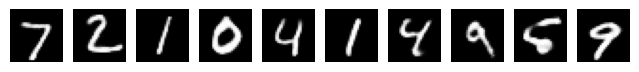

Visualizing reconstructions for fold 10


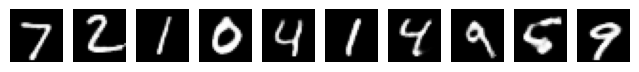

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_2_8):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))

### Plot Training Loss and Validation Loss functions with Standard Deviation

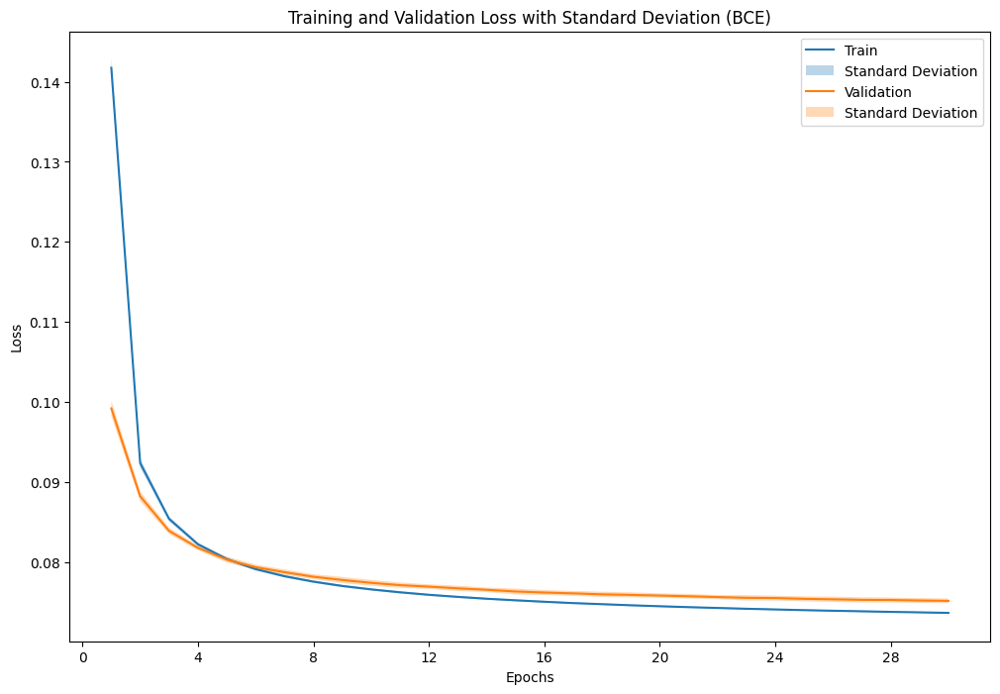

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_2_8_1 = AE_plot_results(fold_results_2_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_8_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_8_1['epochs'])
plot_mean_std(result_data_2_8_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_8_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_8_1['valid_result'], result_data_2_8_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.075168   0.074414
1  Standard Deviation         0.000292   0.000088

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.075392,0.074394
1,2,0.075142,0.074476
2,3,0.074973,0.074250
3,4,0.075222,0.074571
4,5,0.075098,0.074387
5,6,0.075459,0.074429
6,7,0.075083,0.074389
7,8,0.075757,0.074489
8,9,0.074830,0.074459
9,10,0.074719,0.074302


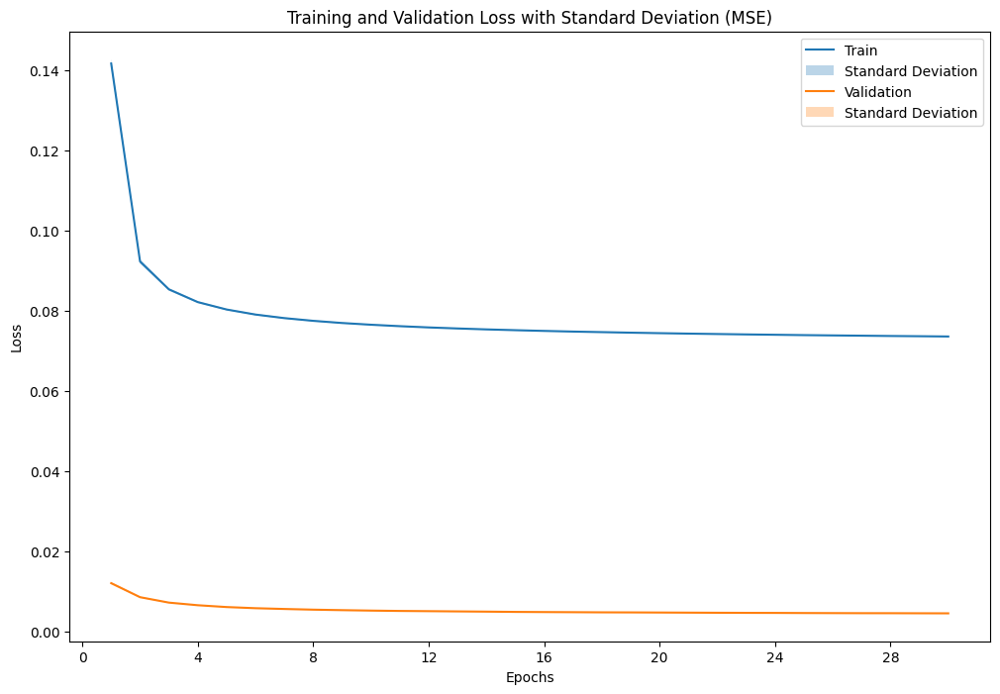

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_2_8_2 = AE_plot_results(fold_results_2_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_8_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_8_2['epochs'])
plot_mean_std(result_data_2_8_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_8_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_8_2['valid_result'], result_data_2_8_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.004631   0.004492
1  Standard Deviation         0.000049   0.000026

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.004658,0.004480
1,2,0.004655,0.004510
2,3,0.004576,0.004447
3,4,0.004660,0.004537
4,5,0.004616,0.004483
5,6,0.004623,0.004498
6,7,0.004613,0.004482
7,8,0.004733,0.004520
8,9,0.004632,0.004506
9,10,0.004542,0.004459


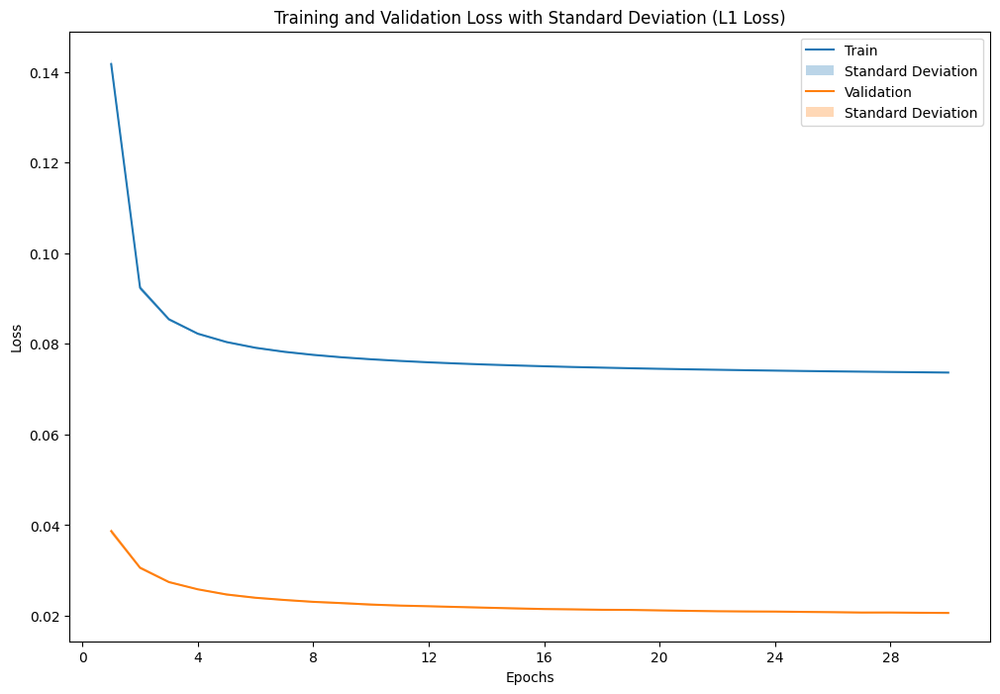

In [ ]:
loss_type_to_plot = 'L1 Loss'  # We can change this to our desired loss type
result_data_2_8_3 = AE_plot_results(fold_results_2_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_8_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_8_3['epochs'])
plot_mean_std(result_data_2_8_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_8_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_8_3['valid_result'], result_data_2_8_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.020620   0.020226
1  Standard Deviation         0.000128   0.000060

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.020769,0.020276
1,2,0.020669,0.020259
2,3,0.020507,0.020126
3,4,0.020651,0.020287
4,5,0.020573,0.020211
5,6,0.020648,0.020251
6,7,0.020560,0.020180
7,8,0.020864,0.020275
8,9,0.020574,0.020276
9,10,0.020382,0.020120


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_2_8 = sum(p.numel() for p in models_2_8[0].parameters())
print(f"Number of parameters in the model: {total_params_2_8}")

Number of parameters in the model: 667488


### Experiment 1.2: AE with 2 layer

- Model: AE of 2 layer, D_x=784, D_z=16, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_6_8 = 'AE'
model_config_6_8 = {'D_x': 784, 'n_layers': 2, 'D_z': 64, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_6_8, fold_results_6_8 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_6_8),
                                                model_config=model_config_6_8,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=424, bias=True), ReLU(), Linear(in_features=424, out_features=64, bias=True)]
[Linear(in_features=64, out_features=424, bias=True), ReLU(), Linear(in_features=424, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.140068
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.011194080302610676, 'L1 Loss': 0.03635006718971628, 'BCE': 0.09634817954390607}
Train Fold/Epoch: 1/2, Training Loss: 0.088500
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.007256244012015931, 'L1 Loss': 0.027418277087680836, 'BCE': 0.08394071824373082}
Train Fold/Epoch: 1/3, Training Loss: 0.080735
Validation Fold/Epoch: 1/3, Validation AE Loss: {'MSE': 0.005798380386005057, 'L1 Loss': 0.02390092060445471, 'BCE': 0.07924078856693938}
Train Fold/Epoch: 1/4, Training Loss: 0.077153
V

### Visualizing reconstructions for all fold

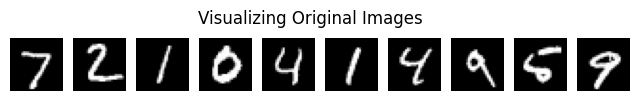

Visualizing reconstructions for fold 1


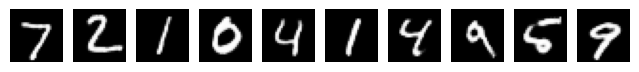

Visualizing reconstructions for fold 2


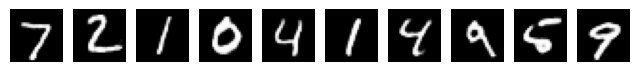

Visualizing reconstructions for fold 3


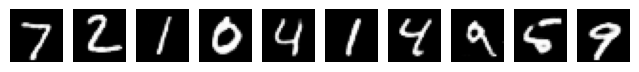

Visualizing reconstructions for fold 4


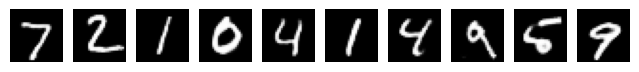

Visualizing reconstructions for fold 5


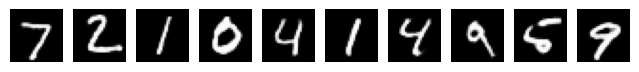

Visualizing reconstructions for fold 6


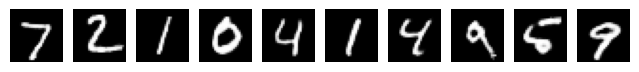

Visualizing reconstructions for fold 7


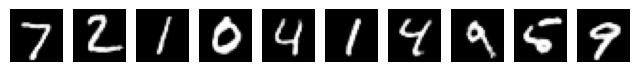

Visualizing reconstructions for fold 8


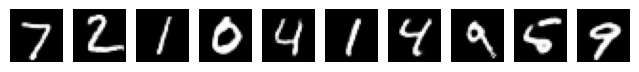

Visualizing reconstructions for fold 9


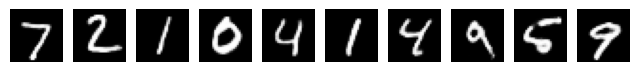

Visualizing reconstructions for fold 10


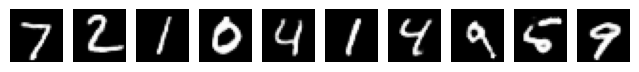

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_6_8):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

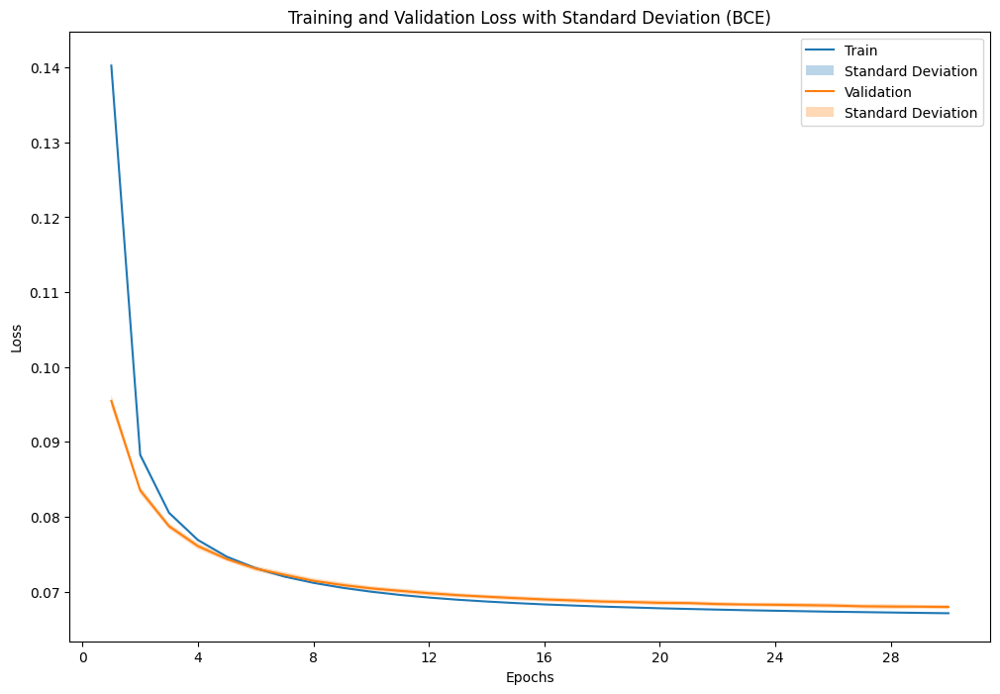

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_6_8_1 = AE_plot_results(fold_results_6_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_6_8_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_6_8_1['epochs'])
plot_mean_std(result_data_6_8_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_6_8_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_6_8_1['valid_result'], result_data_6_8_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.067964   0.067433
1  Standard Deviation         0.000280   0.000094

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.068147,0.067432
1,2,0.067693,0.067297
2,3,0.068030,0.067486
3,4,0.067717,0.067235
4,5,0.067972,0.067501
5,6,0.068372,0.067510
6,7,0.067950,0.067505
7,8,0.068460,0.067495
8,9,0.067645,0.067497
9,10,0.067654,0.067368


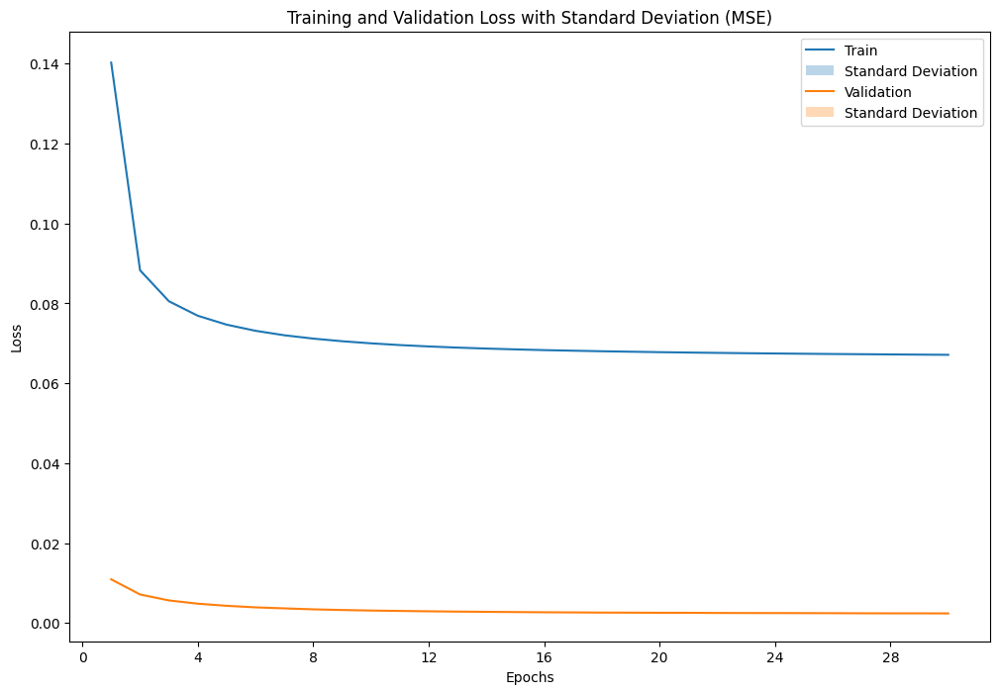

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_6_8_2 = AE_plot_results(fold_results_6_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_6_8_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_6_8_2['epochs'])
plot_mean_std(result_data_6_8_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_6_8_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_6_8_2['valid_result'], result_data_6_8_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.002428   0.002363
1  Standard Deviation         0.000035   0.000026

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.002442,0.002363
1,2,0.002384,0.002330
2,3,0.002445,0.002376
3,4,0.002370,0.002307
4,5,0.002439,0.002382
5,6,0.002451,0.002380
6,7,0.002435,0.002383
7,8,0.002490,0.002382
8,9,0.002441,0.002380
9,10,0.002387,0.002343


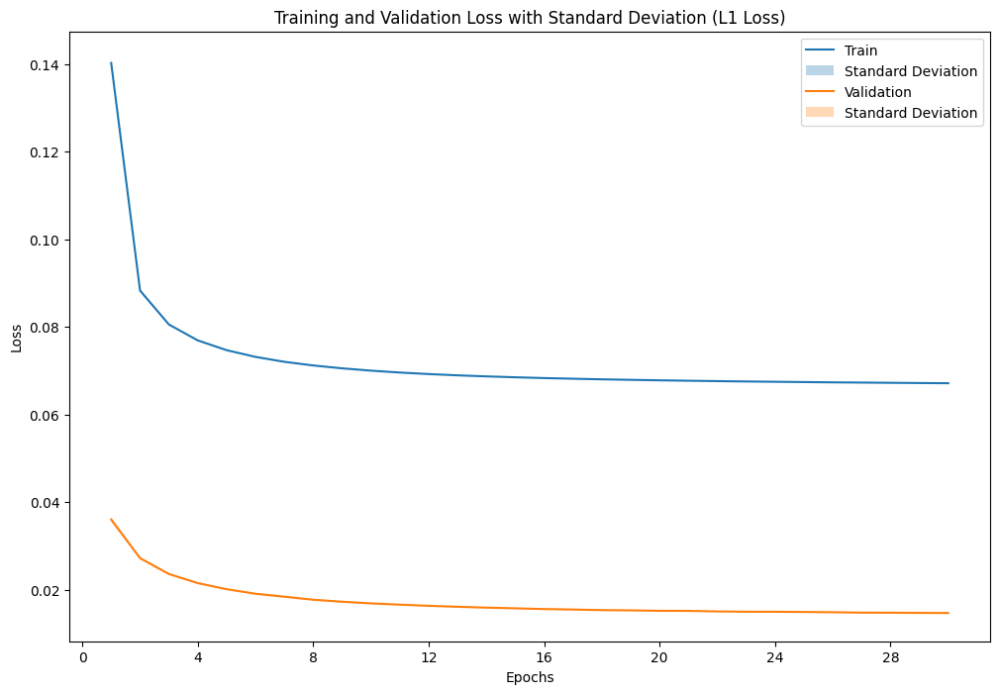

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_6_8_3 = AE_plot_results(fold_results_6_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_6_8_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_6_8_3['epochs'])
plot_mean_std(result_data_6_8_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_6_8_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_6_8_3['valid_result'], result_data_6_8_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.014678   0.014446
1  Standard Deviation         0.000119   0.000078

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.014722,0.014440
1,2,0.014516,0.014341
2,3,0.014750,0.014499
3,4,0.014499,0.014279
4,5,0.014725,0.014533
5,6,0.014765,0.014482
6,7,0.014689,0.014491
7,8,0.014908,0.014518
8,9,0.014651,0.014476
9,10,0.014559,0.014402


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_6_8 = sum(p.numel() for p in models_6_8[0].parameters())
print(f"Number of parameters in the model: {total_params_6_8}")

Number of parameters in the model: 720800


### Experiments 3 : AE with n_layers =4

- We evaluate the performance of both the autoencoder and the variational autoencoder by systematically varying the latent space dimensionality (Dz =2). Additionally, for this assessment, we set the number of layers (n_layer) to be equal to 4, considering likelihoods modeled as Bernoulli.

### Experiments with MNIST: Autoencoder

## Test 2 AE: BCE

### Experiment 2.1 : AE with 4 layer

- Model: AE of 4 layer, D_x=784, D_z=2, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_2_9 = 'AE'
model_config_2_9 = {'D_x': 784, 'n_layers': 4, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_2_9, fold_results_2_9 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_2_9),
                                                model_config=model_config_2_9,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=589, bias=True), ReLU(), Linear(in_features=589, out_features=393, bias=True), ReLU(), Linear(in_features=393, out_features=198, bias=True), ReLU(), Linear(in_features=198, out_features=2, bias=True)]
[Linear(in_features=2, out_features=198, bias=True), ReLU(), Linear(in_features=198, out_features=393, bias=True), ReLU(), Linear(in_features=393, out_features=589, bias=True), ReLU(), Linear(in_features=589, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.210852
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.04269295907083978, 'L1 Loss': 0.1020083191229942, 'BCE': 0.1890429104579256}
Train Fold/Epoch: 1/2, Training Loss: 0.182464
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.03912100885459717, 'L1 Loss': 0.09377947394201096, 'BCE': 0.17849201962

### Visualizing reconstructions for all fold

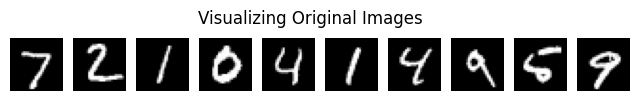

Visualizing reconstructions for fold 1


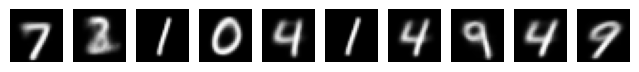

Visualizing reconstructions for fold 2


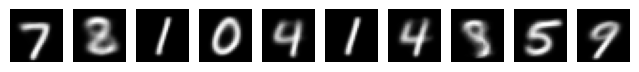

Visualizing reconstructions for fold 3


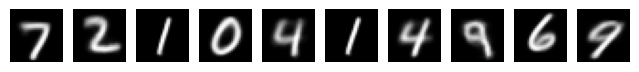

Visualizing reconstructions for fold 4


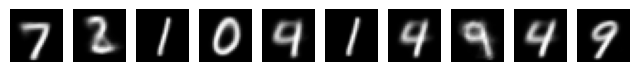

Visualizing reconstructions for fold 5


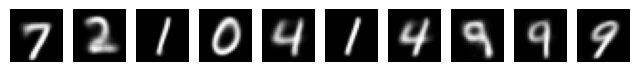

Visualizing reconstructions for fold 6


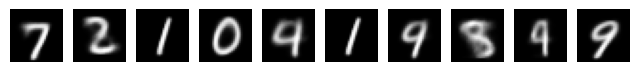

Visualizing reconstructions for fold 7


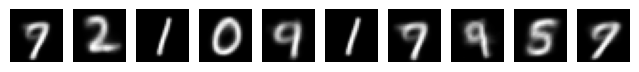

Visualizing reconstructions for fold 8


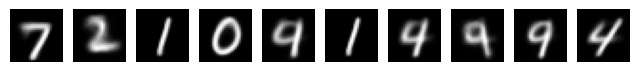

Visualizing reconstructions for fold 9


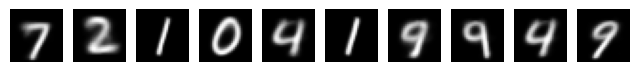

Visualizing reconstructions for fold 10


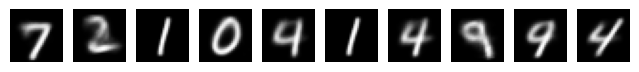

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_2_9):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

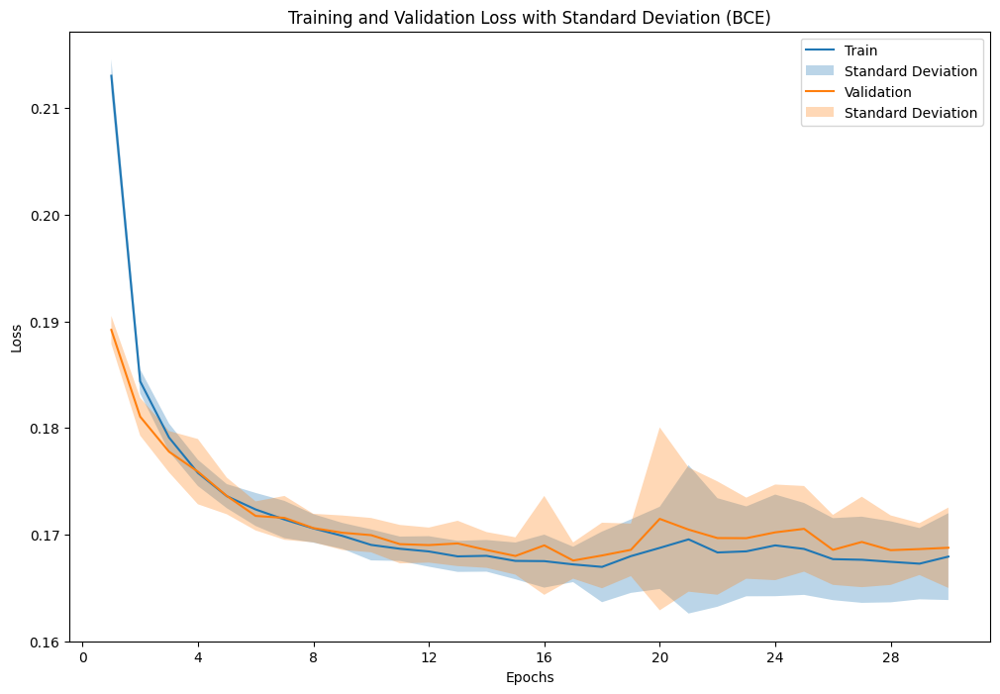

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_2_9_1 = AE_plot_results(fold_results_2_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_9_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_9_1['epochs'])
plot_mean_std(result_data_2_9_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_9_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_9_1['valid_result'], result_data_2_9_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.168765   0.168674
1  Standard Deviation         0.003771   0.003685

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.170837,0.170348
1,2,0.175689,0.175075
2,3,0.165668,0.165540
3,4,0.165691,0.166723
4,5,0.165431,0.165721
5,6,0.165902,0.165829
6,7,0.174723,0.174863
7,8,0.166955,0.165280
8,9,0.170878,0.171105
9,10,0.165873,0.166255


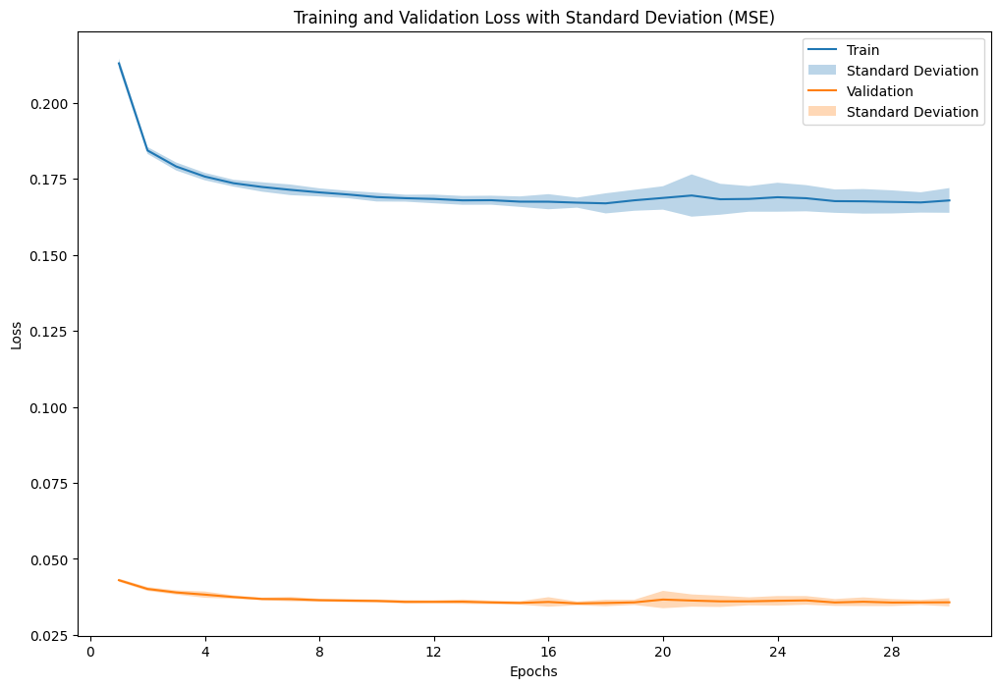

In [ ]:
loss_type_to_plot = 'MSE'  # You can change this to our desired loss type
result_data_2_9_2 = AE_plot_results(fold_results_2_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_9_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_9_2['epochs'])
plot_mean_std(result_data_2_9_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_9_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_9_2['valid_result'], result_data_2_9_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.035721   0.035780
1  Standard Deviation         0.001338   0.001283

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.036348,0.036310
1,2,0.038153,0.038011
2,3,0.034653,0.034713
3,4,0.034653,0.035081
4,5,0.034564,0.034755
5,6,0.034617,0.034779
6,7,0.037796,0.037917
7,8,0.035032,0.034613
8,9,0.036691,0.036700
9,10,0.034705,0.034920


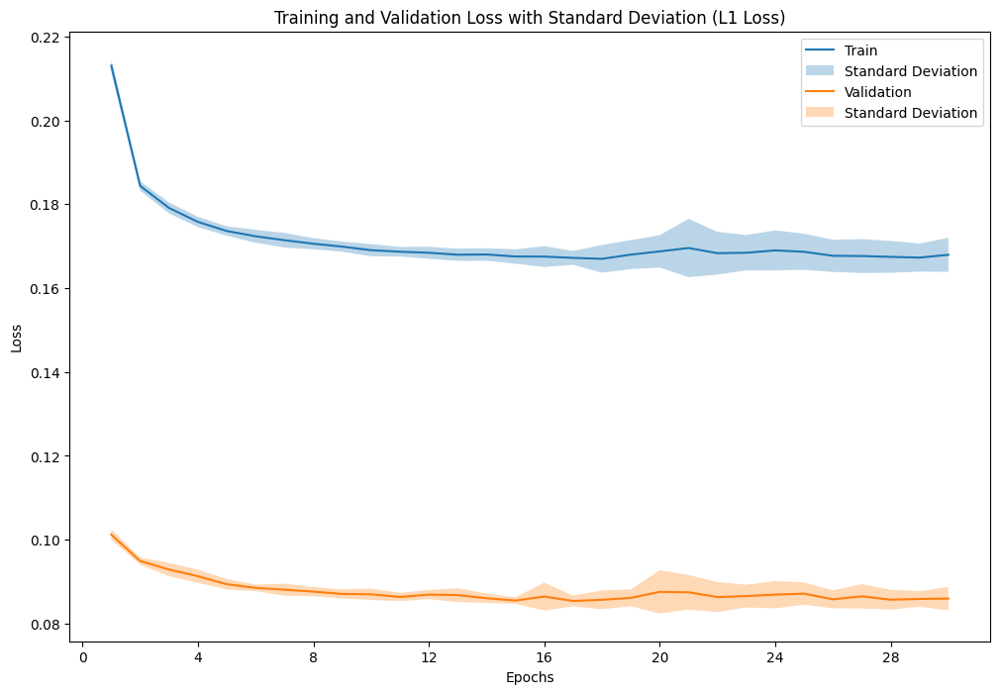

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_2_9_3 = AE_plot_results(fold_results_2_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_9_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_9_3['epochs'])
plot_mean_std(result_data_2_9_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_9_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_9_3['valid_result'], result_data_2_9_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.085981   0.086062
1  Standard Deviation         0.002809   0.002769

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.085904,0.086106
1,2,0.090503,0.090244
2,3,0.083234,0.083335
3,4,0.084597,0.084991
4,5,0.083905,0.084278
5,6,0.083455,0.083608
6,7,0.091062,0.091162
7,8,0.084476,0.083705
8,9,0.088571,0.088745
9,10,0.084101,0.084443


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_2_9 = sum(p.numel() for p in models_2_9[0].parameters())
print(f"Number of parameters in the model: {total_params_2_9}")

Number of parameters in the model: 1546072


### Latente Space for each fold

<ipython-input-10-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


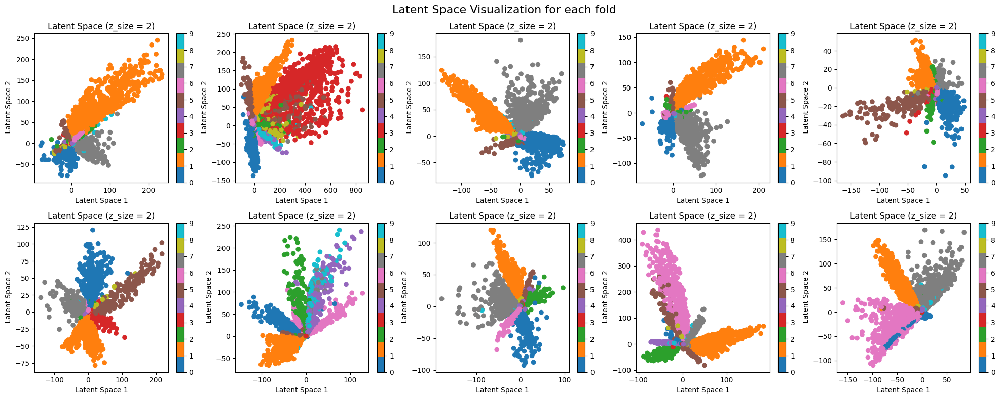

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))
fig.suptitle('Latent Space Visualization for each fold', fontsize=16)

# Flatten the 2D array of subplots
axes = axes.flatten()

for i, model in enumerate(models_2_9):
    latent_space_AE_model(model, test_loader, device, ax=axes[i])

# plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


<ipython-input-10-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


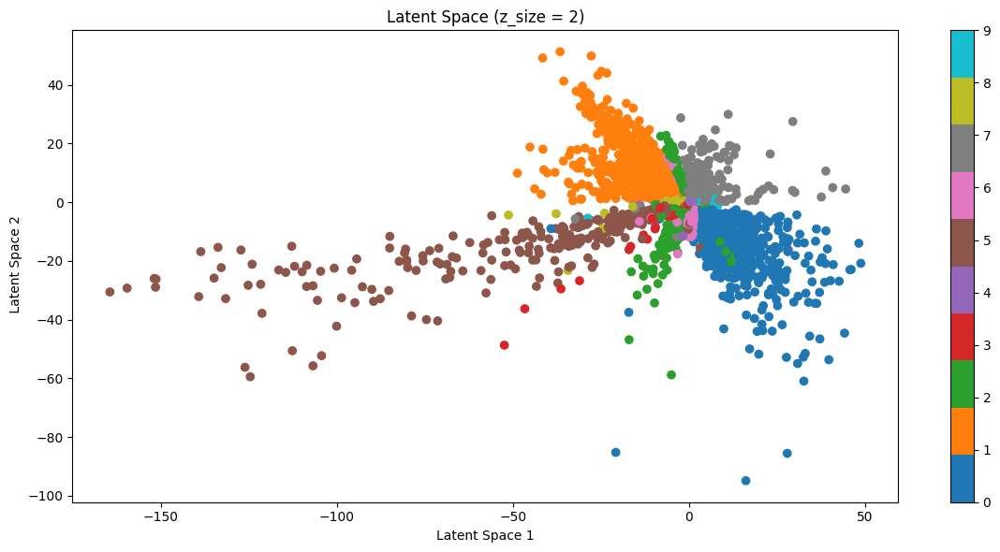

In [ ]:
latent_space_AE_model(models_2_9[4], test_loader, device)
# print(type(models_1_4[9]))

### Experiment 2.1 : AE with 4 layer

- Model: AE of 4 layer, D_x=784, D_z=32, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_9_9 = 'AE'
model_config_9_9 = {'D_x': 784, 'n_layers': 4, 'D_z': 8, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_9_9, fold_results_9_9 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_9_9),
                                                model_config=model_config_9_9,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=590, bias=True), ReLU(), Linear(in_features=590, out_features=396, bias=True), ReLU(), Linear(in_features=396, out_features=202, bias=True), ReLU(), Linear(in_features=202, out_features=8, bias=True)]
[Linear(in_features=8, out_features=202, bias=True), ReLU(), Linear(in_features=202, out_features=396, bias=True), ReLU(), Linear(in_features=396, out_features=590, bias=True), ReLU(), Linear(in_features=590, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.185451
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.026952149504993823, 'L1 Loss': 0.06887729002281706, 'BCE': 0.14253357322292126}
Train Fold/Epoch: 1/2, Training Loss: 0.132440
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.021893538950764117, 'L1 Loss': 0.0587823018035356, 'BCE': 0.12779354

### Visualizing reconstructions for all fold

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_9_9):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_9_9_1 = AE_plot_results(fold_results_9_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_9_9_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_9_9_1['epochs'])
plot_mean_std(result_data_9_9_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_9_9_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_9_9_1['valid_result'], result_data_9_9_1['test_result'])

In [ ]:
loss_type_to_plot = 'MSE'  # You can change this to our desired loss type
result_data_9_9_2 = AE_plot_results(fold_results_9_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_9_9_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_9_9_2['epochs'])
plot_mean_std(result_data_9_9_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_9_9_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_9_9_2['valid_result'], result_data_9_9_2['test_result'])

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_9_9_3 = AE_plot_results(fold_results_9_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_9_9_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_9_9_3['epochs'])
plot_mean_std(result_data_9_9_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_9_9_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_9_9_3['valid_result'], result_data_9_9_3['test_result'])

### Number of parameters

In [ ]:
# Count the number of parameters
total_params_9_9 = sum(p.numel() for p in models_9_9[0].parameters())
print(f"Number of parameters in the model: {total_params_9_9}")

### Experiment 2.1 : AE with 4 layer

- Model: AE of 4 layer, D_x=784, D_z=32, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_4_9 = 'AE'
model_config_4_9 = {'D_x': 784, 'n_layers': 4, 'D_z': 32, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_4_9, fold_results_4_9 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_4_9),
                                                model_config=model_config_4_9,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=596, bias=True), ReLU(), Linear(in_features=596, out_features=408, bias=True), ReLU(), Linear(in_features=408, out_features=220, bias=True), ReLU(), Linear(in_features=220, out_features=32, bias=True)]
[Linear(in_features=32, out_features=220, bias=True), ReLU(), Linear(in_features=220, out_features=408, bias=True), ReLU(), Linear(in_features=408, out_features=596, bias=True), ReLU(), Linear(in_features=596, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.191035
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.02685500766606407, 'L1 Loss': 0.0693557137980106, 'BCE': 0.14239463352776588}
Train Fold/Epoch: 1/2, Training Loss: 0.131704
Validation Fold/Epoch: 1/2, Validation AE Loss: {'MSE': 0.020399259977993814, 'L1 Loss': 0.05581224238143322, 'BCE': 0.1233768

### Visualizing reconstructions for all fold

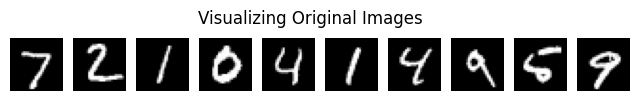

Visualizing reconstructions for fold 1


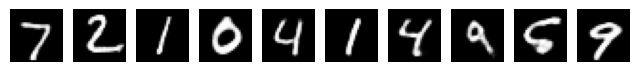

Visualizing reconstructions for fold 2


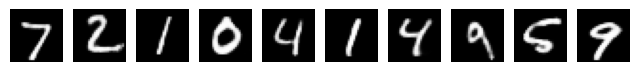

Visualizing reconstructions for fold 3


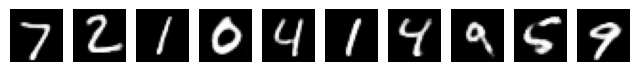

Visualizing reconstructions for fold 4


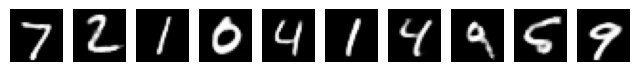

Visualizing reconstructions for fold 5


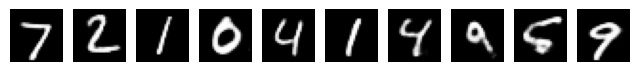

Visualizing reconstructions for fold 6


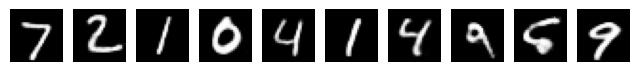

Visualizing reconstructions for fold 7


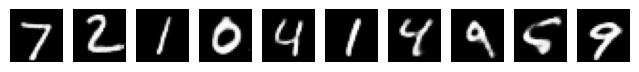

Visualizing reconstructions for fold 8


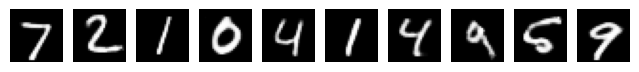

Visualizing reconstructions for fold 9


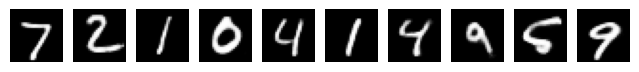

Visualizing reconstructions for fold 10


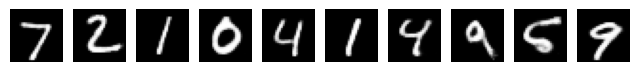

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_4_9):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

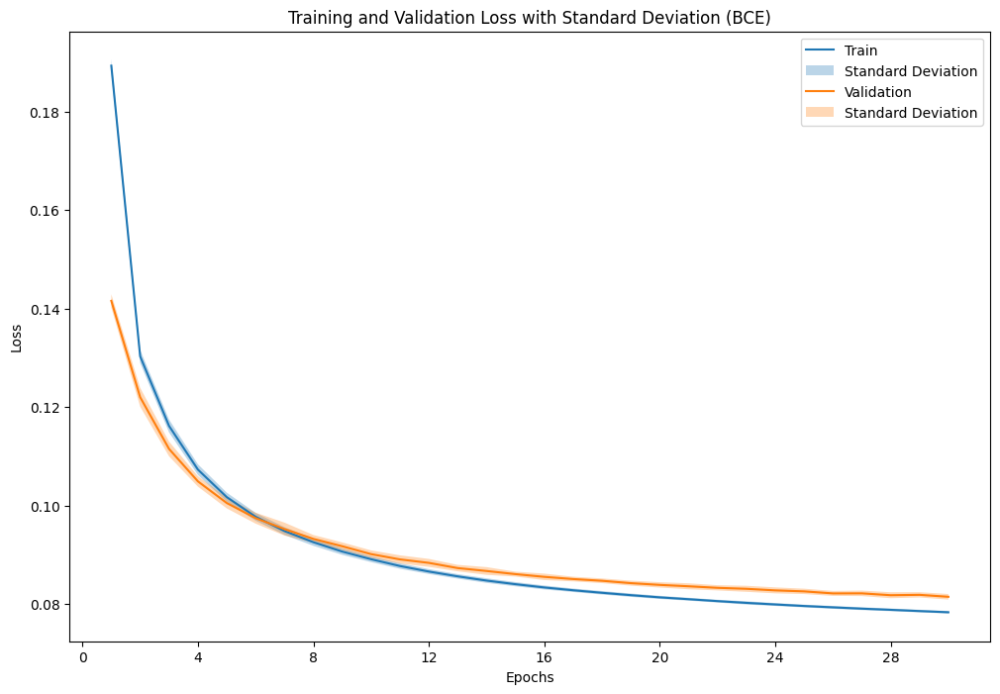

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_4_9_1 = AE_plot_results(fold_results_4_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_4_9_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_4_9_1['epochs'])
plot_mean_std(result_data_4_9_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_4_9_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_4_9_1['valid_result'], result_data_4_9_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.081482   0.080799
1  Standard Deviation         0.000567   0.000438

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.081756,0.080782
1,2,0.081269,0.080761
2,3,0.081933,0.081177
3,4,0.081942,0.081472
4,5,0.080935,0.080076
5,6,0.082387,0.081437
6,7,0.081115,0.080493
7,8,0.081931,0.080762
8,9,0.081118,0.080776
9,10,0.080439,0.080252


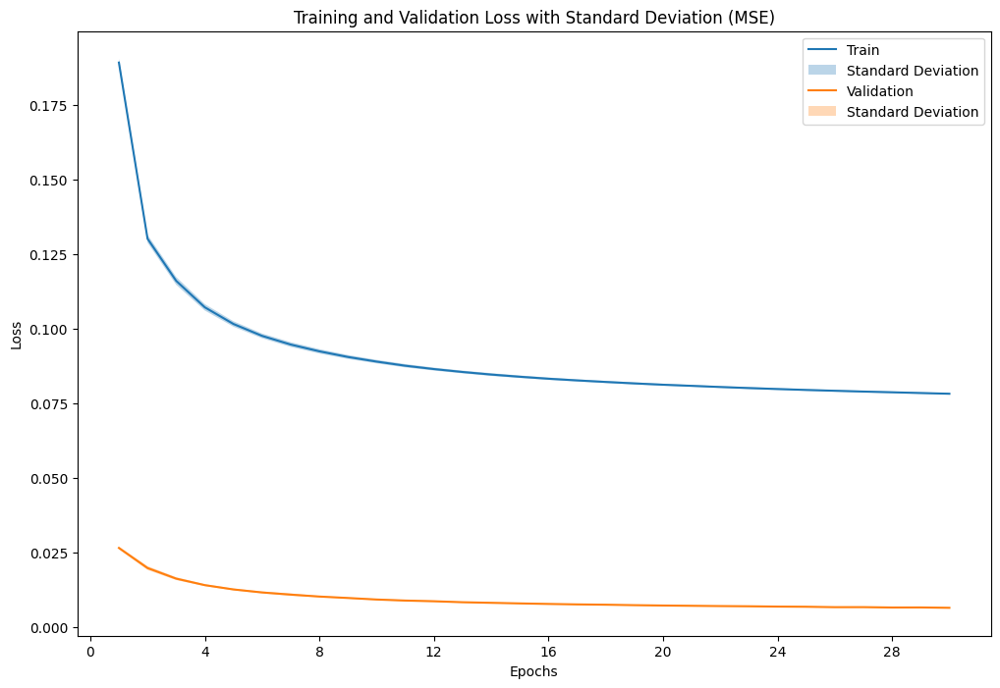

In [ ]:
loss_type_to_plot = 'MSE'  # You can change this to our desired loss type
result_data_4_9_2 = AE_plot_results(fold_results_4_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_4_9_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_4_9_2['epochs'])
plot_mean_std(result_data_4_9_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_4_9_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_4_9_2['valid_result'], result_data_4_9_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.006605   0.006487
1  Standard Deviation         0.000139   0.000134

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.006655,0.006491
1,2,0.006574,0.006476
2,3,0.006751,0.006593
3,4,0.006750,0.006692
4,5,0.006420,0.006246
5,6,0.006784,0.006676
6,7,0.006514,0.006403
7,8,0.006656,0.006469
8,9,0.006611,0.006493
9,10,0.006338,0.006326


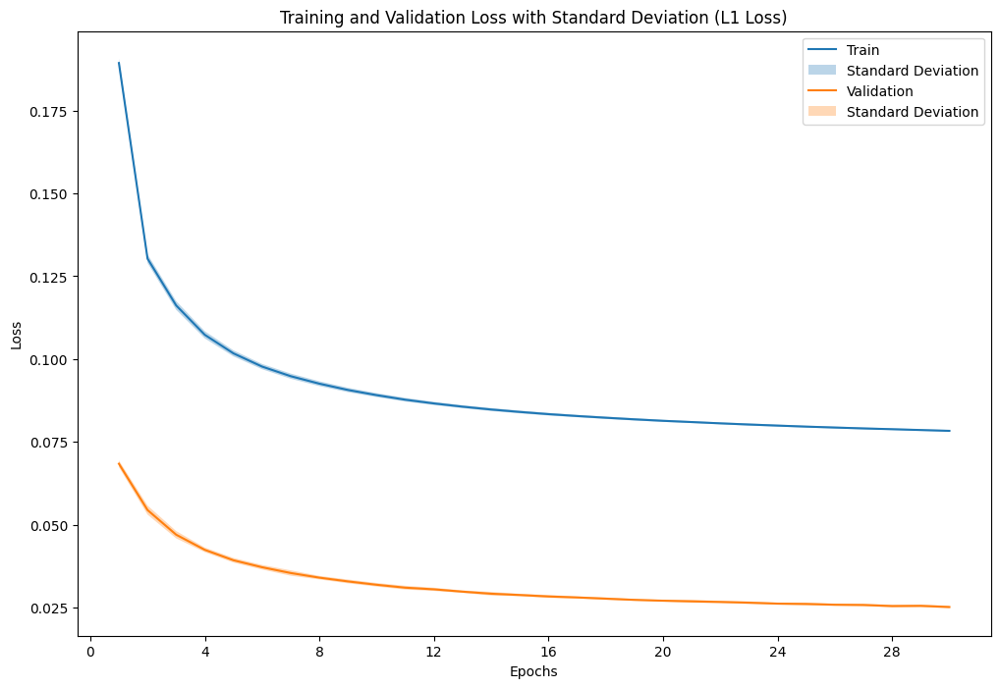

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_4_9_3 = AE_plot_results(fold_results_4_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_4_9_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_4_9_3['epochs'])
plot_mean_std(result_data_4_9_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_4_9_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_4_9_3['valid_result'], result_data_4_9_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.025181   0.024854
1  Standard Deviation         0.000362   0.000327

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.025232,0.024818
1,2,0.025087,0.024851
2,3,0.025588,0.025189
3,4,0.025365,0.025139
4,5,0.024632,0.024231
5,6,0.025788,0.025416
6,7,0.024847,0.024545
7,8,0.025458,0.024910
8,9,0.025125,0.024851
9,10,0.024692,0.024587


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_4_9 = sum(p.numel() for p in models_4_9[0].parameters())
print(f"Number of parameters in the model: {total_params_4_9}")

Number of parameters in the model: 1617728


### Experiments 3 : AE with n_layers =6

- We evaluate the performance of both the autoencoder and the variational autoencoder by systematically varying the latent space dimensionality (Dz=2). Additionally, for this assessment, we set the number of layers (n_layer) to be equal to 6, considering likelihoods modeled as Gaussian and Bernoulli.

### Experiments with MNIST: Autoencoder

## Test 2 AE: BCE

### Experiment 2.1 : AE with 6 layer

- Model: AE of 6 layer, D_x=784, D_z=2, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AE_model_name_2_10 = 'AE'
model_config_2_10 = {'D_x': 784, 'n_layers': 6, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'AE_criterion' : AE_criterion,
    'device' : device,
    'AE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_2_10, fold_results_2_10 = AE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], AE_model_name_2_10),
                                                model_config=model_config_2_10,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                AE_criterion= AE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
[Linear(in_features=784, out_features=654, bias=True), ReLU(), Linear(in_features=654, out_features=524, bias=True), ReLU(), Linear(in_features=524, out_features=393, bias=True), ReLU(), Linear(in_features=393, out_features=263, bias=True), ReLU(), Linear(in_features=263, out_features=133, bias=True), ReLU(), Linear(in_features=133, out_features=2, bias=True)]
[Linear(in_features=2, out_features=133, bias=True), ReLU(), Linear(in_features=133, out_features=263, bias=True), ReLU(), Linear(in_features=263, out_features=393, bias=True), ReLU(), Linear(in_features=393, out_features=524, bias=True), ReLU(), Linear(in_features=524, out_features=654, bias=True), ReLU(), Linear(in_features=654, out_features=784, bias=True), Sigmoid()]
Train Fold/Epoch: 1/1, Training Loss: 0.222821
Validation Fold/Epoch: 1/1, Validation AE Loss: {'MSE': 0.04454

### Visualizing reconstructions for all fold

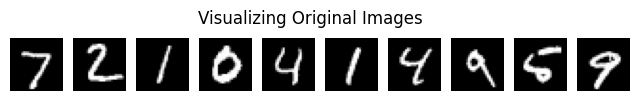

Visualizing reconstructions for fold 1


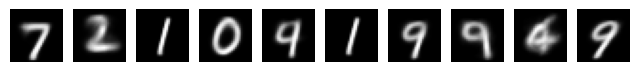

Visualizing reconstructions for fold 2


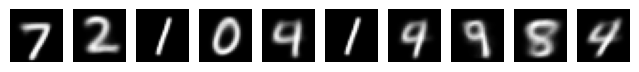

Visualizing reconstructions for fold 3


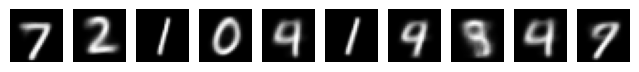

Visualizing reconstructions for fold 4


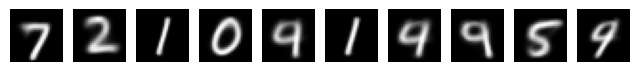

Visualizing reconstructions for fold 5


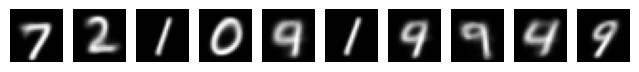

Visualizing reconstructions for fold 6


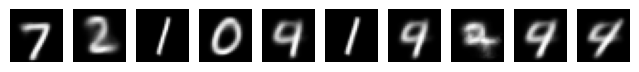

Visualizing reconstructions for fold 7


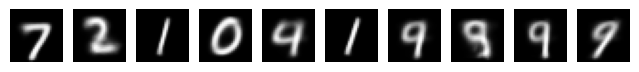

Visualizing reconstructions for fold 8


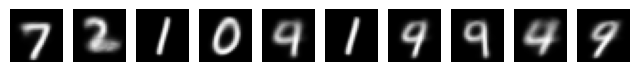

Visualizing reconstructions for fold 9


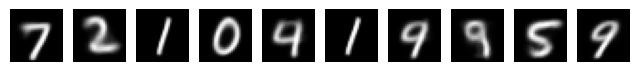

Visualizing reconstructions for fold 10


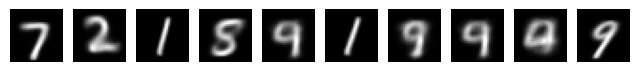

In [ ]:
AE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_2_10):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    AE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

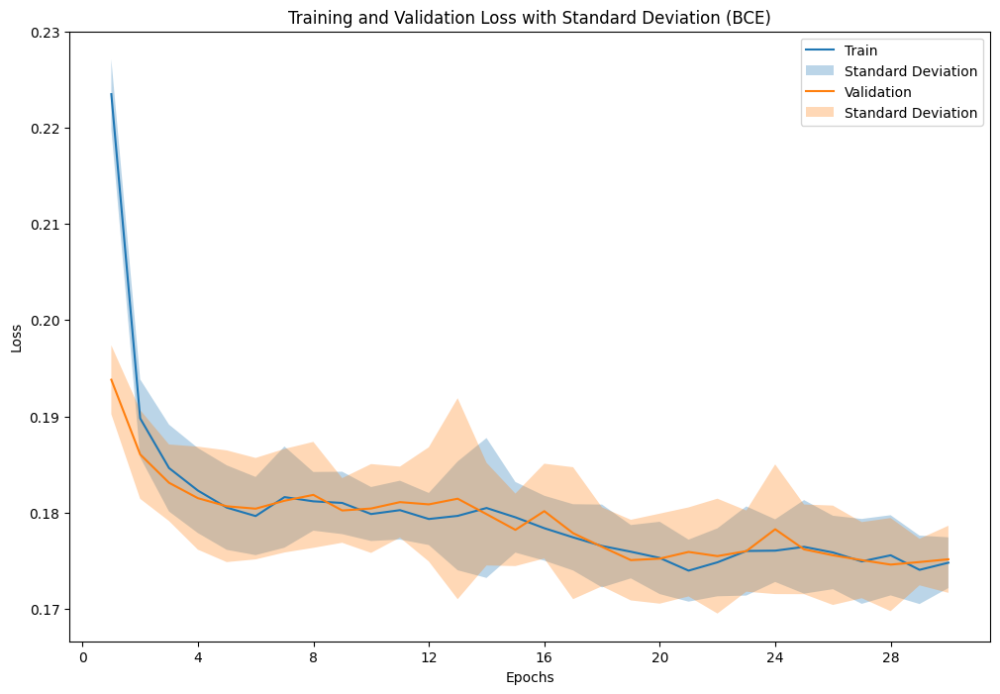

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_2_10_1 = AE_plot_results(fold_results_2_10, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_10_1['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_10_1['epochs'])
plot_mean_std(result_data_2_10_1['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_10_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_10_1['valid_result'], result_data_2_10_1['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.175140   0.174864
1  Standard Deviation         0.003487   0.003057

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.171519,0.171632
1,2,0.172128,0.172096
2,3,0.175059,0.174288
3,4,0.176418,0.176730
4,5,0.177980,0.177599
5,6,0.175698,0.174817
6,7,0.177541,0.176971
7,8,0.179746,0.177863
8,9,0.167654,0.168533
9,10,0.177660,0.178110


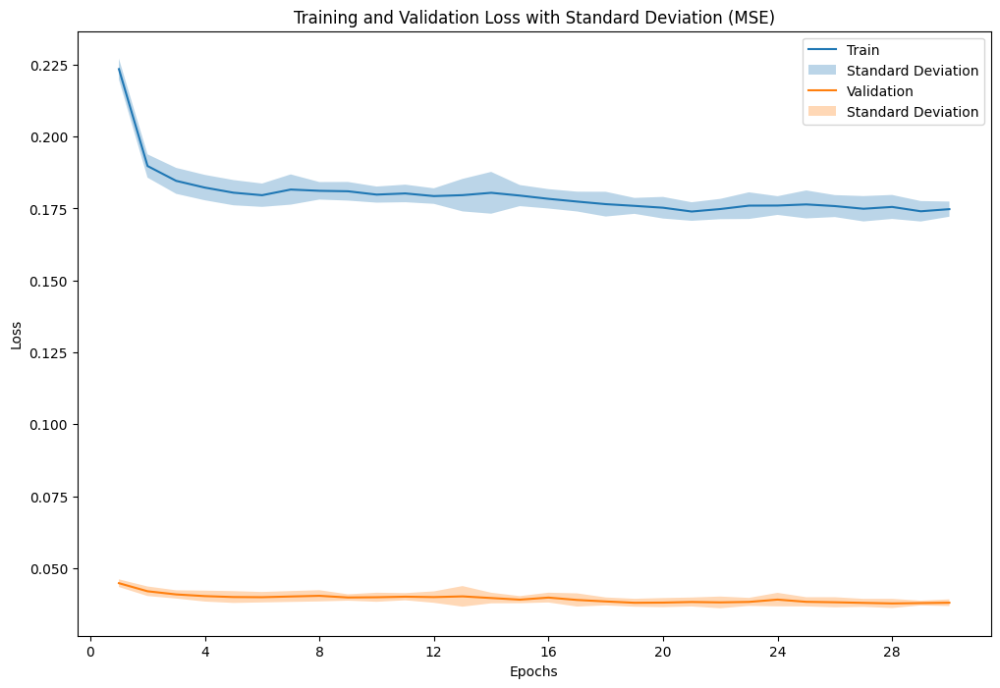

In [ ]:
loss_type_to_plot = 'MSE'  # You can change this to our desired loss type
result_data_2_10_2 = AE_plot_results(fold_results_2_10, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_10_2['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_10_2['epochs'])
plot_mean_std(result_data_2_10_2['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_10_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_10_2['valid_result'], result_data_2_10_2['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.037948   0.037929
1  Standard Deviation         0.001163   0.001060

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.036673,0.036763
1,2,0.036952,0.036985
2,3,0.037884,0.037705
3,4,0.038532,0.038676
4,5,0.038938,0.038968
5,6,0.038029,0.037918
6,7,0.038723,0.038554
7,8,0.039460,0.038984
8,9,0.035501,0.035761
9,10,0.038786,0.038976


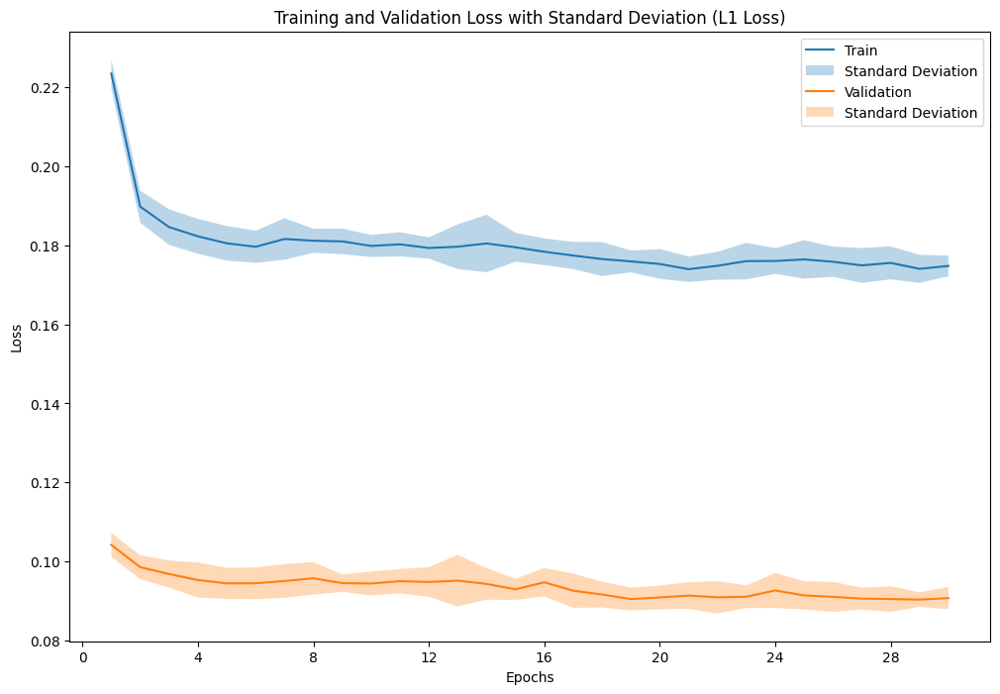

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_2_10_3 = AE_plot_results(fold_results_2_10, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
plot_mean_std(result_data_2_10_3['train_losses'], 'Training and Validation Loss', ax, 'Train', result_data_2_10_3['epochs'])
plot_mean_std(result_data_2_10_3['val_losses'], 'Training and Validation Loss', ax, 'Validation', result_data_2_10_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(result_data_2_10_3['valid_result'], result_data_2_10_3['test_result'])


Mean and Standard Deviation Table:
               Metric  Validation Loss  Test Loss
0                Mean         0.090707   0.090689
1  Standard Deviation         0.002818   0.002671

Detailed Evaluation Table:


,Fold,Validation Loss,Test Loss
0,1,0.087907,0.087818
1,2,0.087560,0.087694
2,3,0.090031,0.089819
3,4,0.092416,0.092487
4,5,0.093825,0.093737
5,6,0.090271,0.090014
6,7,0.092611,0.092609
7,8,0.094098,0.093463
8,9,0.085396,0.085969
9,10,0.092953,0.093284


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_2_10 = sum(p.numel() for p in models_2_10[0].parameters())
print(f"Number of parameters in the model: {total_params_2_10}")

Number of parameters in the model: 2404656


### Latente Space for each fold

<ipython-input-11-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


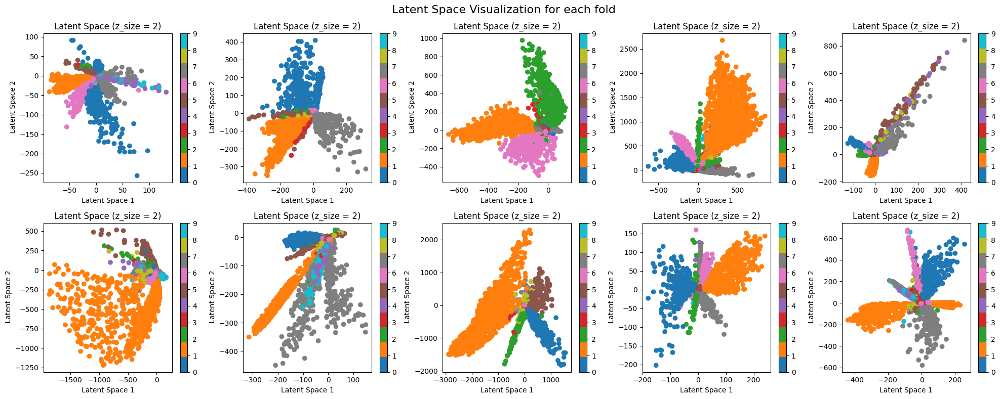

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))
fig.suptitle('Latent Space Visualization for each fold', fontsize=16)

# Flatten the 2D array of subplots
axes = axes.flatten()

for i, model in enumerate(models_2_10):
    latent_space_AE_model(model, test_loader, device, ax=axes[i])

# plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


<ipython-input-11-c3ee784ddcaf>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


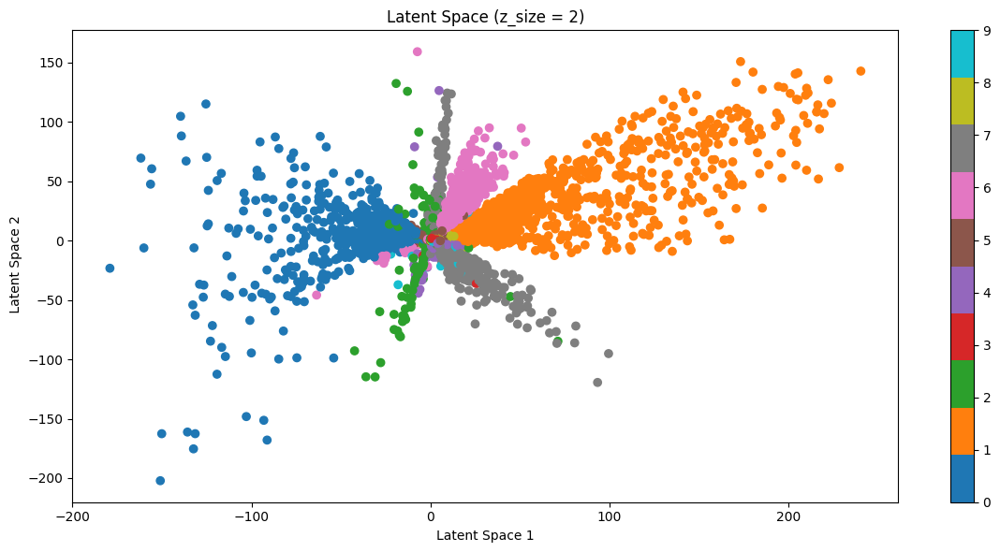

In [ ]:
latent_space_AE_model(models_2_10[8], test_loader, device)
# print(type(models_2_10[9]))

$$\textbf{METRIC} : MSE$$

$$
\begin{array}{c|S|r}
{\textbf{Model}}{\textbf{}} & \textbf{AE Validadion} & \textbf{AE Testing} & \textbf{AE Number of Parameters}& \textbf{VAE Validation} & \textbf{VAE Testing} & \textbf{VAE Number of Parameters} & \textbf{Observation (overfitting)}\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 2 & 0.055572 \pm 0.000272 & 0.055313 \pm 0.000034 & 3922 &0.056540 \pm 0.000261 & 0.056233 \pm 0.000075 & 5492 & No\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 8 & 0.033802 \pm 0.000171 & 0.033319 \pm 0.000106 & 13336 & 0.039264 \pm 0.000155 & 0.038767 \pm 0.000081 & 19616 & No\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 16 & 0.020919 \pm 0.000109 & 0.020343 \pm 0.000054 & 25888 & 0.032211 \pm 0.000164 & 0.031700 \pm 0.000111 & 38448 & No\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 32 & 0.009812 \pm  0.000029 & 0.009411 \pm 0.000016 & 50992 & 0.030086 \pm 0.000190 & 0.029557 \pm  0.000164 & 76112 & No\\
\hline \\
\textbf{D_x: 784, n_{layers}: 1, D_z: 64} & \textbf{0.003633} \pm \textbf{0.000022} & \textbf{0.003473} \pm. \textbf{0.000010} & \textbf{101200} & \textbf{0.030077} \pm \textbf{0.000228} & \textbf{0.029532} \pm \textbf{0.000178} & \textbf{151440} & \textbf{No}\\
\hline \\
D_x: 784, n_{layers}: 2, D_z: 2 & 0.039761 \pm 0.000556  &  0.039597 \pm 0.000405& 619368 & 0.041751 \pm 0.000340 & 0.041653 \pm 0.000194& 620156 & Yes\\
\hline \\
D_x: 784, n_{layers}: 2, D_z: 16 & 0.008909 \pm 0.000103 & 0.008692 \pm 0.000069 & 641600 &  0.021863 \pm 0.000213 & 0.021452 \pm 0.000264 & 648016 & Yes\\
\hline \\
D_x: 784, n_{layers}: 2, D_z: 32 & 0.004746 \pm 0.000049 & 0.004616 \pm 0.000030 & 667488 & 0.021903 \pm 0.000156 & 0.021529 \pm 0.000197 &  680576 & Yes\\
\hline \\
\color{red}{D_x: 784, n_{layers}: 2, D_z: 64} & \color{red}{0.002518 \pm 0.000044} & \color{red}{0.002450 \pm  0.000034} & \color{red}{720800} & \color{red}{0.022126 \pm 0.000180} & \color{red}{0.021717 \pm 0.000175} & \color{red}{748000} & \color{red}{Yes}\\
\hline
\end{array}
$$

$$\textbf{METRIC} : MSE$$

$$
\begin{array}{c|S|r}
{\textbf{Model}}{\textbf{}} & \textbf{AE Validadion} & \textbf{AE Testing} & \textbf{AE Number of Parameters}& \textbf{VAE Validation} & \textbf{VAE Testing} & \textbf{VAE Number of Parameters} & \textbf{Observation (overfitting)}\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 2 & 0.055572 \pm 0.000272 & 0.055313 \pm 0.000034 & 3922 & 0.056540 \pm 0.000261 & 0.056233 \pm 0.000075 & 5492 & No\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 8 & 0.033802 \pm 0.000171 & 0.033319 \pm 0.000106 & 13336 & 0.039264 \pm 0.000155 & 0.038767 \pm 0.000081 & 19616 & No\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 16 & 0.020919 \pm 0.000109 & 0.020343 \pm 0.000054 & 25888 & 0.032211 \pm 0.000164 & 0.031700 \pm 0.000111 & 38448 & No\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 32 & 0.009812 \pm  0.000029 & 0.009411 \pm 0.000016 & 50992 & 0.030086 \pm 0.000190 & 0.029557 \pm  0.000164 & 76112 & No\\
\hline \\
\textbf{D_x: 784, n_{layers}: 1, D_z: 64} & \textbf{0.003633} \pm \textbf{0.000022} & \textbf{0.003473} \pm. \textbf{0.000010} & \textbf{101200} & \textbf{0.030077} \pm \textbf{0.000228} & \textbf{0.029532} \pm \textbf{0.000178} & \textbf{151440} & \textbf{No}\\
\hline \\
D_x: 784, n_{layers}: 2, D_z: 2 & 0.039761 \pm 0.000556  &  0.039597 \pm 0.000405& 619368 & 0.041751 \pm 0.000340 & 0.041653 \pm 0.000194& 620156 & Yes\\
\hline \\
D_x: 784, n_{layers}: 2, D_z: 16 & 0.008909 \pm 0.000103 & 0.008692 \pm 0.000069 & 641600 &  0.021863 \pm 0.000213 & 0.021452 \pm 0.000264 & 648016 & Yes\\
\hline \\
D_x: 784, n_{layers}: 2, D_z: 32 & 0.004746 \pm 0.000049 & 0.004616 \pm 0.000030 & 667488 & 0.021903 \pm 0.000156 & 0.021529 \pm 0.000197 &  680576 & Yes\\
\hline \\
\color{red}{D_x: 784, n_{layers}: 2, D_z: 64} & \color{red}{0.002518 \pm 0.000044} & \color{red}{0.002450 \pm  0.000034} & \color{red}{720800} & \color{red}{0.022126 \pm 0.000180} & \color{red}{0.021717 \pm 0.000175} & \color{red}{748000} & \color{red}{Yes}\\
\hline
\end{array}
$$

$$\textbf{METRIC} : BCE$$

$$
\begin{array}{c|S|r}
{\textbf{Model}}{\textbf{}} & \textbf{AE Validadion} & \textbf{AE Testing} & \textbf{AE Number of Parameters}& \textbf{VAE Validation} & \textbf{VAE Testing} & \textbf{VAE Number of Parameters} & \textbf{Observation (overfitting)}\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 2 & 0.226050 \pm 0.000917 & 0.224878 \pm 0.000088 & 3922 & 0.227362 \pm 0.000904 & 0.226324 \pm 0.000175 & 5492 & No\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 8 & 0.164717 \pm 0.000559 & 0.163044 \pm 0.000060 & 13336 & 0.170698 \pm 0.000714 & 0.169026 \pm 0.000223 & 19616 & No\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 16 & 0.127461 \pm  0.000322 & 0.125537 \pm 0.000154 & 25888 & 0.138710 \pm 0.000452 & 0.136802 \pm  0.000307 & 38448 & No\\
\hline \\
D_x: 784, n_{layers}: 1, D_z: 32 & 0.092783 \pm  0.000279 & 0.091194  \pm 0.000111 & 50992 & 0.114663 \pm  0.000411 & 0.112963 \pm 0.000302  & 76112 & No\\
\hline \\
\textbf{D_x: 784, n_{layers}: 1, D_z: 64} & \textbf{0.072957} \pm \textbf{0.000222} & \textbf{0.072091} \pm. \textbf{0.000031} & \textbf{101200} & \textbf{0.109525} \pm \textbf{0.000464} & \textbf{0.108042} \pm \textbf{0.000376} & \textbf{151440} & \textbf{No}\\
\hline \\
D_x: 784, n_{layers}: 2, D_z: 2 & 0.181634 \pm 0.001712 &  0.181347 \pm 0.001797 & 619368 & 0.183637 \pm 0.001529 & 0.183448 \pm 0.001187& 620156 & Yes\\
\hline \\
D_x: 784, n_{layers}: 2, D_z: 16 & 0.088638 \pm 0.000399 & 0.087703 \pm 0.000298 & 641600 &  0.102409 \pm 0.000495 & 0.101333 \pm 0.000425 & 648016 & Yes\\
\hline \\
D_x: 784, n_{layers}: 2, D_z: 32 & 0.075168 \pm 0.000292 & 0.074414 \pm 0.000088 & 667488 & 0.099006  \pm 0.000620 & 0.097906 \pm 0.000575 &  680576 & Yes\\
\hline \\
\color{red}{D_x: 784, n_{layers}: 2, D_z: 64} & \color{red}{0.067964 \pm 0.000280} & \color{red}{0.067433 \pm 0.000094 } & \color{red}{720800} & \color{red}{0.099061 \pm 0.000346} & \color{red}{0.098014 \pm 0.000418} & \color{red}{748000} & \color{red}{Yes}\\
\hline \\
D_x: 784, n_{layers}: 4, D_z: 2 & 0.168765 \pm 0.003771 & 0.168674 \pm 0.003685 & 1546072 &0.167256 \pm 0.001344 & 0.167123 \pm 0.000882 & 1546470 & Yes\\
\hline \\
D_x: 784, n_{layers}: 4, D_z: 32 & 0.081482 \pm 0.000567 & 0.080799 \pm 0.000438 & 1617728 & 0.122626 \pm 0.000720 & 0.122409 \pm 0.000471 & 1624800 & Yes \\
\hline
\end{array}
$$